# Afriat

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

In [3]:
torch.cuda.is_available()

False

In [4]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [5]:
adata_file_path = os.path.join(tardis.config.io_directories["processed"], "biolord_afriat.h5ad")
assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
adata = ad.read_h5ad(adata_file_path)
adata

AnnData object with n_obs × n_vars = 19053 × 5000
    obs: 'mouse', 'experiment', 'time_int', 'time_cat', 'zone', 'status_control'

In [6]:
model_level_metrics = [
    dict(
        metric_identifier = "metric_mi|status_control",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 256,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|zone",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|time_cat",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|mouse",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    )
]

In [7]:
warmup_epoch_range = [6, 48]
dtc_w1 = 100
dtc_w2 = 10

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = [False, False],
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "time_cat",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2,
                method = "mse_z", 
                latent_group = "unreserved",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1, 
                method = "mse_z", 
                latent_group = "unreserved",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [8]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(24 + 8 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.25,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    encode_covariates=False,
    beta_kl_weight = 0.5,
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=128,
    check_val_every_n_epoch=10,
    limit_train_batches=1.0, 
    limit_val_batches=1.0,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-4,
        weight_decay=1e-4,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=['status_control', 'zone'],
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=model_level_metrics,
    model_level_metrics_helper_covariates=['zone', 'status_control', 'time_cat', 'mouse']
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "afriat_v4_1_encode"
)

vae.save(
    dir_path,
    overwrite=True,
)

/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/scvi/data/fields/_base_field.py:64: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)
/tmp/ipykernel_791109/903340300.py:51: UserWarning: `(None, ['status_control', 'zone'])` is defined as `batch_key` or `categorical_covariate`, it will be given to both encoder and decoder. Make sure this does not contain information of any of your disentenglement targets. For example, if `donor_id` is chosen as a batch key, do not disentengle donor level information such as `sex` or `age`. The decoder should not use the disentengled latent spaces, simply ignores, if it is already given a batch_key. 
  tardis.MyModel.setup_anndata(adata, **dataset_params)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: 1e7n9tav
Name: sith-fighter-156
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/1e7n9tav
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240504_161157-1e7n9tav/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
GPU available: False, used: False


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..


`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|          | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `time_cat` for `training` set. Number of elements in each group: 2547,2560,1706,3442,1641,3347
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `time_cat` for `validation` set. Number of elements in each group: 658,642,402,848,408,852
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


Epoch 1/600:   0%|          | 1/600 [00:10<1:40:04, 10.02s/it]

Epoch 1/600:   0%|          | 1/600 [00:10<1:40:04, 10.02s/it, v_num=av_1, total_loss_train=3.68e+3, kl_local_train=50.6]

Epoch 2/600:   0%|          | 1/600 [00:10<1:40:04, 10.02s/it, v_num=av_1, total_loss_train=3.68e+3, kl_local_train=50.6]

Epoch 2/600:   0%|          | 2/600 [00:18<1:32:01,  9.23s/it, v_num=av_1, total_loss_train=3.68e+3, kl_local_train=50.6]

Epoch 2/600:   0%|          | 2/600 [00:18<1:32:01,  9.23s/it, v_num=av_1, total_loss_train=3.22e+3, kl_local_train=75.8]

Epoch 3/600:   0%|          | 2/600 [00:18<1:32:01,  9.23s/it, v_num=av_1, total_loss_train=3.22e+3, kl_local_train=75.8]

Epoch 3/600:   0%|          | 3/600 [00:27<1:27:57,  8.84s/it, v_num=av_1, total_loss_train=3.22e+3, kl_local_train=75.8]

Epoch 3/600:   0%|          | 3/600 [00:27<1:27:57,  8.84s/it, v_num=av_1, total_loss_train=3.21e+3, kl_local_train=77]  

Epoch 4/600:   0%|          | 3/600 [00:27<1:27:57,  8.84s/it, v_num=av_1, total_loss_train=3.21e+3, kl_local_train=77]

Epoch 4/600:   1%|          | 4/600 [00:35<1:27:22,  8.80s/it, v_num=av_1, total_loss_train=3.21e+3, kl_local_train=77]

Epoch 4/600:   1%|          | 4/600 [00:35<1:27:22,  8.80s/it, v_num=av_1, total_loss_train=3.2e+3, kl_local_train=71.6]

Epoch 5/600:   1%|          | 4/600 [00:35<1:27:22,  8.80s/it, v_num=av_1, total_loss_train=3.2e+3, kl_local_train=71.6]

Epoch 5/600:   1%|          | 5/600 [00:44<1:27:03,  8.78s/it, v_num=av_1, total_loss_train=3.2e+3, kl_local_train=71.6]

Epoch 5/600:   1%|          | 5/600 [00:44<1:27:03,  8.78s/it, v_num=av_1, total_loss_train=3.2e+3, kl_local_train=58.1]

Epoch 6/600:   1%|          | 5/600 [00:45<1:27:03,  8.78s/it, v_num=av_1, total_loss_train=3.2e+3, kl_local_train=58.1]

Epoch 6/600:   1%|          | 6/600 [00:53<1:27:01,  8.79s/it, v_num=av_1, total_loss_train=3.2e+3, kl_local_train=58.1]

Epoch 6/600:   1%|          | 6/600 [00:53<1:27:01,  8.79s/it, v_num=av_1, total_loss_train=3.19e+3, kl_local_train=43.1, metric_mi|status_control_train=0.0186, metric_mi|zone_train=0.00783, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0348]

Epoch 7/600:   1%|          | 6/600 [00:53<1:27:01,  8.79s/it, v_num=av_1, total_loss_train=3.19e+3, kl_local_train=43.1, metric_mi|status_control_train=0.0186, metric_mi|zone_train=0.00783, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0348]

Epoch 7/600:   1%|          | 7/600 [01:01<1:24:40,  8.57s/it, v_num=av_1, total_loss_train=3.19e+3, kl_local_train=43.1, metric_mi|status_control_train=0.0186, metric_mi|zone_train=0.00783, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0348]

Epoch 7/600:   1%|          | 7/600 [01:01<1:24:40,  8.57s/it, v_num=av_1, total_loss_train=3.18e+3, kl_local_train=44.8, metric_mi|status_control_train=0.0186, metric_mi|zone_train=0.00783, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0348]

Epoch 8/600:   1%|          | 7/600 [01:01<1:24:40,  8.57s/it, v_num=av_1, total_loss_train=3.18e+3, kl_local_train=44.8, metric_mi|status_control_train=0.0186, metric_mi|zone_train=0.00783, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0348]

Epoch 8/600:   1%|▏         | 8/600 [01:09<1:23:01,  8.41s/it, v_num=av_1, total_loss_train=3.18e+3, kl_local_train=44.8, metric_mi|status_control_train=0.0186, metric_mi|zone_train=0.00783, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0348]

Epoch 8/600:   1%|▏         | 8/600 [01:09<1:23:01,  8.41s/it, v_num=av_1, total_loss_train=3.17e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0186, metric_mi|zone_train=0.00783, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0348]

Epoch 9/600:   1%|▏         | 8/600 [01:09<1:23:01,  8.41s/it, v_num=av_1, total_loss_train=3.17e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0186, metric_mi|zone_train=0.00783, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0348]

Epoch 9/600:   2%|▏         | 9/600 [01:17<1:20:43,  8.20s/it, v_num=av_1, total_loss_train=3.17e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0186, metric_mi|zone_train=0.00783, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0348]

Epoch 9/600:   2%|▏         | 9/600 [01:17<1:20:43,  8.20s/it, v_num=av_1, total_loss_train=3.16e+3, kl_local_train=54.4, metric_mi|status_control_train=0.0186, metric_mi|zone_train=0.00783, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0348]

Epoch 10/600:   2%|▏         | 9/600 [01:17<1:20:43,  8.20s/it, v_num=av_1, total_loss_train=3.16e+3, kl_local_train=54.4, metric_mi|status_control_train=0.0186, metric_mi|zone_train=0.00783, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0348]

Epoch 10/600:   2%|▏         | 10/600 [01:25<1:20:46,  8.21s/it, v_num=av_1, total_loss_train=3.16e+3, kl_local_train=54.4, metric_mi|status_control_train=0.0186, metric_mi|zone_train=0.00783, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0348]

Epoch 10/600:   2%|▏         | 10/600 [01:25<1:20:46,  8.21s/it, v_num=av_1, total_loss_train=3.16e+3, kl_local_train=57.8, metric_mi|status_control_train=0.0186, metric_mi|zone_train=0.00783, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0348]

Epoch 11/600:   2%|▏         | 10/600 [01:26<1:20:46,  8.21s/it, v_num=av_1, total_loss_train=3.16e+3, kl_local_train=57.8, metric_mi|status_control_train=0.0186, metric_mi|zone_train=0.00783, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0348]

Epoch 11/600:   2%|▏         | 11/600 [01:34<1:21:58,  8.35s/it, v_num=av_1, total_loss_train=3.16e+3, kl_local_train=57.8, metric_mi|status_control_train=0.0186, metric_mi|zone_train=0.00783, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0348]

Epoch 11/600:   2%|▏         | 11/600 [01:34<1:21:58,  8.35s/it, v_num=av_1, total_loss_train=3.15e+3, kl_local_train=62.1, metric_mi|status_control_train=0.069, metric_mi|zone_train=0.111, metric_mi|time_cat_train=0.0807, metric_mi|mouse_train=0.099]    

Epoch 12/600:   2%|▏         | 11/600 [01:34<1:21:58,  8.35s/it, v_num=av_1, total_loss_train=3.15e+3, kl_local_train=62.1, metric_mi|status_control_train=0.069, metric_mi|zone_train=0.111, metric_mi|time_cat_train=0.0807, metric_mi|mouse_train=0.099]

Epoch 12/600:   2%|▏         | 12/600 [01:42<1:20:51,  8.25s/it, v_num=av_1, total_loss_train=3.15e+3, kl_local_train=62.1, metric_mi|status_control_train=0.069, metric_mi|zone_train=0.111, metric_mi|time_cat_train=0.0807, metric_mi|mouse_train=0.099]

Epoch 12/600:   2%|▏         | 12/600 [01:42<1:20:51,  8.25s/it, v_num=av_1, total_loss_train=3.15e+3, kl_local_train=70.7, metric_mi|status_control_train=0.069, metric_mi|zone_train=0.111, metric_mi|time_cat_train=0.0807, metric_mi|mouse_train=0.099]

Epoch 13/600:   2%|▏         | 12/600 [01:42<1:20:51,  8.25s/it, v_num=av_1, total_loss_train=3.15e+3, kl_local_train=70.7, metric_mi|status_control_train=0.069, metric_mi|zone_train=0.111, metric_mi|time_cat_train=0.0807, metric_mi|mouse_train=0.099]

Epoch 13/600:   2%|▏         | 13/600 [01:50<1:20:12,  8.20s/it, v_num=av_1, total_loss_train=3.15e+3, kl_local_train=70.7, metric_mi|status_control_train=0.069, metric_mi|zone_train=0.111, metric_mi|time_cat_train=0.0807, metric_mi|mouse_train=0.099]

Epoch 13/600:   2%|▏         | 13/600 [01:50<1:20:12,  8.20s/it, v_num=av_1, total_loss_train=3.14e+3, kl_local_train=76, metric_mi|status_control_train=0.069, metric_mi|zone_train=0.111, metric_mi|time_cat_train=0.0807, metric_mi|mouse_train=0.099]  

Epoch 14/600:   2%|▏         | 13/600 [01:50<1:20:12,  8.20s/it, v_num=av_1, total_loss_train=3.14e+3, kl_local_train=76, metric_mi|status_control_train=0.069, metric_mi|zone_train=0.111, metric_mi|time_cat_train=0.0807, metric_mi|mouse_train=0.099]

Epoch 14/600:   2%|▏         | 14/600 [01:57<1:18:26,  8.03s/it, v_num=av_1, total_loss_train=3.14e+3, kl_local_train=76, metric_mi|status_control_train=0.069, metric_mi|zone_train=0.111, metric_mi|time_cat_train=0.0807, metric_mi|mouse_train=0.099]

Epoch 14/600:   2%|▏         | 14/600 [01:57<1:18:26,  8.03s/it, v_num=av_1, total_loss_train=3.14e+3, kl_local_train=79.6, metric_mi|status_control_train=0.069, metric_mi|zone_train=0.111, metric_mi|time_cat_train=0.0807, metric_mi|mouse_train=0.099]

Epoch 15/600:   2%|▏         | 14/600 [01:57<1:18:26,  8.03s/it, v_num=av_1, total_loss_train=3.14e+3, kl_local_train=79.6, metric_mi|status_control_train=0.069, metric_mi|zone_train=0.111, metric_mi|time_cat_train=0.0807, metric_mi|mouse_train=0.099]

Epoch 15/600:   2%|▎         | 15/600 [02:06<1:18:49,  8.09s/it, v_num=av_1, total_loss_train=3.14e+3, kl_local_train=79.6, metric_mi|status_control_train=0.069, metric_mi|zone_train=0.111, metric_mi|time_cat_train=0.0807, metric_mi|mouse_train=0.099]

Epoch 15/600:   2%|▎         | 15/600 [02:06<1:18:49,  8.09s/it, v_num=av_1, total_loss_train=3.13e+3, kl_local_train=80.7, metric_mi|status_control_train=0.069, metric_mi|zone_train=0.111, metric_mi|time_cat_train=0.0807, metric_mi|mouse_train=0.099]

Epoch 16/600:   2%|▎         | 15/600 [02:07<1:18:49,  8.09s/it, v_num=av_1, total_loss_train=3.13e+3, kl_local_train=80.7, metric_mi|status_control_train=0.069, metric_mi|zone_train=0.111, metric_mi|time_cat_train=0.0807, metric_mi|mouse_train=0.099]

Epoch 16/600:   3%|▎         | 16/600 [02:14<1:20:34,  8.28s/it, v_num=av_1, total_loss_train=3.13e+3, kl_local_train=80.7, metric_mi|status_control_train=0.069, metric_mi|zone_train=0.111, metric_mi|time_cat_train=0.0807, metric_mi|mouse_train=0.099]

Epoch 16/600:   3%|▎         | 16/600 [02:14<1:20:34,  8.28s/it, v_num=av_1, total_loss_train=3.13e+3, kl_local_train=84.7, metric_mi|status_control_train=0.0767, metric_mi|zone_train=0.0907, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.14]

Epoch 17/600:   3%|▎         | 16/600 [02:14<1:20:34,  8.28s/it, v_num=av_1, total_loss_train=3.13e+3, kl_local_train=84.7, metric_mi|status_control_train=0.0767, metric_mi|zone_train=0.0907, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.14]

Epoch 17/600:   3%|▎         | 17/600 [02:22<1:19:31,  8.18s/it, v_num=av_1, total_loss_train=3.13e+3, kl_local_train=84.7, metric_mi|status_control_train=0.0767, metric_mi|zone_train=0.0907, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.14]

Epoch 17/600:   3%|▎         | 17/600 [02:22<1:19:31,  8.18s/it, v_num=av_1, total_loss_train=3.13e+3, kl_local_train=89.7, metric_mi|status_control_train=0.0767, metric_mi|zone_train=0.0907, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.14]

Epoch 18/600:   3%|▎         | 17/600 [02:22<1:19:31,  8.18s/it, v_num=av_1, total_loss_train=3.13e+3, kl_local_train=89.7, metric_mi|status_control_train=0.0767, metric_mi|zone_train=0.0907, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.14]

Epoch 18/600:   3%|▎         | 18/600 [02:30<1:18:46,  8.12s/it, v_num=av_1, total_loss_train=3.13e+3, kl_local_train=89.7, metric_mi|status_control_train=0.0767, metric_mi|zone_train=0.0907, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.14]

Epoch 18/600:   3%|▎         | 18/600 [02:30<1:18:46,  8.12s/it, v_num=av_1, total_loss_train=3.13e+3, kl_local_train=89.6, metric_mi|status_control_train=0.0767, metric_mi|zone_train=0.0907, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.14]

Epoch 19/600:   3%|▎         | 18/600 [02:30<1:18:46,  8.12s/it, v_num=av_1, total_loss_train=3.13e+3, kl_local_train=89.6, metric_mi|status_control_train=0.0767, metric_mi|zone_train=0.0907, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.14]

Epoch 19/600:   3%|▎         | 19/600 [02:38<1:17:41,  8.02s/it, v_num=av_1, total_loss_train=3.13e+3, kl_local_train=89.6, metric_mi|status_control_train=0.0767, metric_mi|zone_train=0.0907, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.14]

Epoch 19/600:   3%|▎         | 19/600 [02:38<1:17:41,  8.02s/it, v_num=av_1, total_loss_train=3.13e+3, kl_local_train=92.3, metric_mi|status_control_train=0.0767, metric_mi|zone_train=0.0907, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.14]

Epoch 20/600:   3%|▎         | 19/600 [02:38<1:17:41,  8.02s/it, v_num=av_1, total_loss_train=3.13e+3, kl_local_train=92.3, metric_mi|status_control_train=0.0767, metric_mi|zone_train=0.0907, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.14]

Epoch 20/600:   3%|▎         | 20/600 [02:46<1:17:57,  8.06s/it, v_num=av_1, total_loss_train=3.13e+3, kl_local_train=92.3, metric_mi|status_control_train=0.0767, metric_mi|zone_train=0.0907, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.14]

Epoch 20/600:   3%|▎         | 20/600 [02:46<1:17:57,  8.06s/it, v_num=av_1, total_loss_train=3.12e+3, kl_local_train=91.5, metric_mi|status_control_train=0.0767, metric_mi|zone_train=0.0907, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.14]

Epoch 21/600:   3%|▎         | 20/600 [02:47<1:17:57,  8.06s/it, v_num=av_1, total_loss_train=3.12e+3, kl_local_train=91.5, metric_mi|status_control_train=0.0767, metric_mi|zone_train=0.0907, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.14]

Epoch 21/600:   4%|▎         | 21/600 [02:55<1:19:22,  8.23s/it, v_num=av_1, total_loss_train=3.12e+3, kl_local_train=91.5, metric_mi|status_control_train=0.0767, metric_mi|zone_train=0.0907, metric_mi|time_cat_train=0.134, metric_mi|mouse_train=0.14]

Epoch 21/600:   4%|▎         | 21/600 [02:55<1:19:22,  8.23s/it, v_num=av_1, total_loss_train=3.12e+3, kl_local_train=94.1, metric_mi|status_control_train=0.0885, metric_mi|zone_train=0.0767, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.165]

Epoch 22/600:   4%|▎         | 21/600 [02:55<1:19:22,  8.23s/it, v_num=av_1, total_loss_train=3.12e+3, kl_local_train=94.1, metric_mi|status_control_train=0.0885, metric_mi|zone_train=0.0767, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.165]

Epoch 22/600:   4%|▎         | 22/600 [03:03<1:18:40,  8.17s/it, v_num=av_1, total_loss_train=3.12e+3, kl_local_train=94.1, metric_mi|status_control_train=0.0885, metric_mi|zone_train=0.0767, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.165]

Epoch 22/600:   4%|▎         | 22/600 [03:03<1:18:40,  8.17s/it, v_num=av_1, total_loss_train=3.12e+3, kl_local_train=92.3, metric_mi|status_control_train=0.0885, metric_mi|zone_train=0.0767, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.165]

Epoch 23/600:   4%|▎         | 22/600 [03:03<1:18:40,  8.17s/it, v_num=av_1, total_loss_train=3.12e+3, kl_local_train=92.3, metric_mi|status_control_train=0.0885, metric_mi|zone_train=0.0767, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.165]

Epoch 23/600:   4%|▍         | 23/600 [03:11<1:17:34,  8.07s/it, v_num=av_1, total_loss_train=3.12e+3, kl_local_train=92.3, metric_mi|status_control_train=0.0885, metric_mi|zone_train=0.0767, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.165]

Epoch 23/600:   4%|▍         | 23/600 [03:11<1:17:34,  8.07s/it, v_num=av_1, total_loss_train=3.12e+3, kl_local_train=91.7, metric_mi|status_control_train=0.0885, metric_mi|zone_train=0.0767, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.165]

Epoch 24/600:   4%|▍         | 23/600 [03:11<1:17:34,  8.07s/it, v_num=av_1, total_loss_train=3.12e+3, kl_local_train=91.7, metric_mi|status_control_train=0.0885, metric_mi|zone_train=0.0767, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.165]

Epoch 24/600:   4%|▍         | 24/600 [03:18<1:16:32,  7.97s/it, v_num=av_1, total_loss_train=3.12e+3, kl_local_train=91.7, metric_mi|status_control_train=0.0885, metric_mi|zone_train=0.0767, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.165]

Epoch 24/600:   4%|▍         | 24/600 [03:18<1:16:32,  7.97s/it, v_num=av_1, total_loss_train=3.12e+3, kl_local_train=93.4, metric_mi|status_control_train=0.0885, metric_mi|zone_train=0.0767, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.165]

Epoch 25/600:   4%|▍         | 24/600 [03:18<1:16:32,  7.97s/it, v_num=av_1, total_loss_train=3.12e+3, kl_local_train=93.4, metric_mi|status_control_train=0.0885, metric_mi|zone_train=0.0767, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.165]

Epoch 25/600:   4%|▍         | 25/600 [03:27<1:17:16,  8.06s/it, v_num=av_1, total_loss_train=3.12e+3, kl_local_train=93.4, metric_mi|status_control_train=0.0885, metric_mi|zone_train=0.0767, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.165]

Epoch 25/600:   4%|▍         | 25/600 [03:27<1:17:16,  8.06s/it, v_num=av_1, total_loss_train=3.12e+3, kl_local_train=93, metric_mi|status_control_train=0.0885, metric_mi|zone_train=0.0767, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.165]  

Epoch 26/600:   4%|▍         | 25/600 [03:28<1:17:16,  8.06s/it, v_num=av_1, total_loss_train=3.12e+3, kl_local_train=93, metric_mi|status_control_train=0.0885, metric_mi|zone_train=0.0767, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.165]

Epoch 26/600:   4%|▍         | 26/600 [03:35<1:19:00,  8.26s/it, v_num=av_1, total_loss_train=3.12e+3, kl_local_train=93, metric_mi|status_control_train=0.0885, metric_mi|zone_train=0.0767, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.165]

Epoch 26/600:   4%|▍         | 26/600 [03:35<1:19:00,  8.26s/it, v_num=av_1, total_loss_train=3.11e+3, kl_local_train=92.5, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.0672, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.174]

Epoch 27/600:   4%|▍         | 26/600 [03:35<1:19:00,  8.26s/it, v_num=av_1, total_loss_train=3.11e+3, kl_local_train=92.5, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.0672, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.174]

Epoch 27/600:   4%|▍         | 27/600 [03:43<1:17:51,  8.15s/it, v_num=av_1, total_loss_train=3.11e+3, kl_local_train=92.5, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.0672, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.174]

Epoch 27/600:   4%|▍         | 27/600 [03:43<1:17:51,  8.15s/it, v_num=av_1, total_loss_train=3.11e+3, kl_local_train=95.4, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.0672, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.174]

Epoch 28/600:   4%|▍         | 27/600 [03:43<1:17:51,  8.15s/it, v_num=av_1, total_loss_train=3.11e+3, kl_local_train=95.4, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.0672, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.174]

Epoch 28/600:   5%|▍         | 28/600 [03:51<1:16:33,  8.03s/it, v_num=av_1, total_loss_train=3.11e+3, kl_local_train=95.4, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.0672, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.174]

Epoch 28/600:   5%|▍         | 28/600 [03:51<1:16:33,  8.03s/it, v_num=av_1, total_loss_train=3.11e+3, kl_local_train=94.4, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.0672, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.174]

Epoch 29/600:   5%|▍         | 28/600 [03:51<1:16:33,  8.03s/it, v_num=av_1, total_loss_train=3.11e+3, kl_local_train=94.4, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.0672, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.174]

Epoch 29/600:   5%|▍         | 29/600 [03:59<1:16:29,  8.04s/it, v_num=av_1, total_loss_train=3.11e+3, kl_local_train=94.4, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.0672, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.174]

Epoch 29/600:   5%|▍         | 29/600 [03:59<1:16:29,  8.04s/it, v_num=av_1, total_loss_train=3.11e+3, kl_local_train=93.8, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.0672, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.174]

Epoch 30/600:   5%|▍         | 29/600 [03:59<1:16:29,  8.04s/it, v_num=av_1, total_loss_train=3.11e+3, kl_local_train=93.8, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.0672, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.174]

Epoch 30/600:   5%|▌         | 30/600 [04:07<1:17:09,  8.12s/it, v_num=av_1, total_loss_train=3.11e+3, kl_local_train=93.8, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.0672, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.174]

Epoch 30/600:   5%|▌         | 30/600 [04:08<1:17:09,  8.12s/it, v_num=av_1, total_loss_train=3.11e+3, kl_local_train=93.5, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.0672, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.174]

Epoch 31/600:   5%|▌         | 30/600 [04:09<1:17:09,  8.12s/it, v_num=av_1, total_loss_train=3.11e+3, kl_local_train=93.5, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.0672, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.174]

Epoch 31/600:   5%|▌         | 31/600 [04:16<1:18:37,  8.29s/it, v_num=av_1, total_loss_train=3.11e+3, kl_local_train=93.5, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.0672, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.174]

Epoch 31/600:   5%|▌         | 31/600 [04:16<1:18:37,  8.29s/it, v_num=av_1, total_loss_train=3.11e+3, kl_local_train=93.4, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.061, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.177] 

Epoch 32/600:   5%|▌         | 31/600 [04:16<1:18:37,  8.29s/it, v_num=av_1, total_loss_train=3.11e+3, kl_local_train=93.4, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.061, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.177]

Epoch 32/600:   5%|▌         | 32/600 [04:24<1:17:56,  8.23s/it, v_num=av_1, total_loss_train=3.11e+3, kl_local_train=93.4, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.061, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.177]

Epoch 32/600:   5%|▌         | 32/600 [04:24<1:17:56,  8.23s/it, v_num=av_1, total_loss_train=3.11e+3, kl_local_train=92.1, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.061, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.177]

Epoch 33/600:   5%|▌         | 32/600 [04:24<1:17:56,  8.23s/it, v_num=av_1, total_loss_train=3.11e+3, kl_local_train=92.1, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.061, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.177]

Epoch 33/600:   6%|▌         | 33/600 [04:32<1:17:24,  8.19s/it, v_num=av_1, total_loss_train=3.11e+3, kl_local_train=92.1, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.061, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.177]

Epoch 33/600:   6%|▌         | 33/600 [04:32<1:17:24,  8.19s/it, v_num=av_1, total_loss_train=3.11e+3, kl_local_train=94.1, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.061, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.177]

Epoch 34/600:   6%|▌         | 33/600 [04:32<1:17:24,  8.19s/it, v_num=av_1, total_loss_train=3.11e+3, kl_local_train=94.1, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.061, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.177]

Epoch 34/600:   6%|▌         | 34/600 [04:40<1:15:36,  8.02s/it, v_num=av_1, total_loss_train=3.11e+3, kl_local_train=94.1, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.061, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.177]

Epoch 34/600:   6%|▌         | 34/600 [04:40<1:15:36,  8.02s/it, v_num=av_1, total_loss_train=3.11e+3, kl_local_train=92.3, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.061, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.177]

Epoch 35/600:   6%|▌         | 34/600 [04:40<1:15:36,  8.02s/it, v_num=av_1, total_loss_train=3.11e+3, kl_local_train=92.3, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.061, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.177]

Epoch 35/600:   6%|▌         | 35/600 [04:48<1:16:31,  8.13s/it, v_num=av_1, total_loss_train=3.11e+3, kl_local_train=92.3, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.061, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.177]

Epoch 35/600:   6%|▌         | 35/600 [04:48<1:16:31,  8.13s/it, v_num=av_1, total_loss_train=3.11e+3, kl_local_train=93.8, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.061, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.177]

Epoch 36/600:   6%|▌         | 35/600 [04:49<1:16:31,  8.13s/it, v_num=av_1, total_loss_train=3.11e+3, kl_local_train=93.8, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.061, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.177]

Epoch 36/600:   6%|▌         | 36/600 [04:57<1:18:48,  8.38s/it, v_num=av_1, total_loss_train=3.11e+3, kl_local_train=93.8, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.061, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.177]

Epoch 36/600:   6%|▌         | 36/600 [04:57<1:18:48,  8.38s/it, v_num=av_1, total_loss_train=3.11e+3, kl_local_train=94.9, metric_mi|status_control_train=0.107, metric_mi|zone_train=0.0578, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.183]

Epoch 37/600:   6%|▌         | 36/600 [04:57<1:18:48,  8.38s/it, v_num=av_1, total_loss_train=3.11e+3, kl_local_train=94.9, metric_mi|status_control_train=0.107, metric_mi|zone_train=0.0578, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.183]

Epoch 37/600:   6%|▌         | 37/600 [05:05<1:17:00,  8.21s/it, v_num=av_1, total_loss_train=3.11e+3, kl_local_train=94.9, metric_mi|status_control_train=0.107, metric_mi|zone_train=0.0578, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.183]

Epoch 37/600:   6%|▌         | 37/600 [05:05<1:17:00,  8.21s/it, v_num=av_1, total_loss_train=3.11e+3, kl_local_train=95.8, metric_mi|status_control_train=0.107, metric_mi|zone_train=0.0578, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.183]

Epoch 38/600:   6%|▌         | 37/600 [05:05<1:17:00,  8.21s/it, v_num=av_1, total_loss_train=3.11e+3, kl_local_train=95.8, metric_mi|status_control_train=0.107, metric_mi|zone_train=0.0578, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.183]

Epoch 38/600:   6%|▋         | 38/600 [05:14<1:17:18,  8.25s/it, v_num=av_1, total_loss_train=3.11e+3, kl_local_train=95.8, metric_mi|status_control_train=0.107, metric_mi|zone_train=0.0578, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.183]

Epoch 38/600:   6%|▋         | 38/600 [05:14<1:17:18,  8.25s/it, v_num=av_1, total_loss_train=3.1e+3, kl_local_train=94.9, metric_mi|status_control_train=0.107, metric_mi|zone_train=0.0578, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.183] 

Epoch 39/600:   6%|▋         | 38/600 [05:14<1:17:18,  8.25s/it, v_num=av_1, total_loss_train=3.1e+3, kl_local_train=94.9, metric_mi|status_control_train=0.107, metric_mi|zone_train=0.0578, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.183]

Epoch 39/600:   6%|▋         | 39/600 [05:22<1:17:02,  8.24s/it, v_num=av_1, total_loss_train=3.1e+3, kl_local_train=94.9, metric_mi|status_control_train=0.107, metric_mi|zone_train=0.0578, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.183]

Epoch 39/600:   6%|▋         | 39/600 [05:22<1:17:02,  8.24s/it, v_num=av_1, total_loss_train=3.1e+3, kl_local_train=95.9, metric_mi|status_control_train=0.107, metric_mi|zone_train=0.0578, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.183]

Epoch 40/600:   6%|▋         | 39/600 [05:22<1:17:02,  8.24s/it, v_num=av_1, total_loss_train=3.1e+3, kl_local_train=95.9, metric_mi|status_control_train=0.107, metric_mi|zone_train=0.0578, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.183]

Epoch 40/600:   7%|▋         | 40/600 [05:30<1:16:52,  8.24s/it, v_num=av_1, total_loss_train=3.1e+3, kl_local_train=95.9, metric_mi|status_control_train=0.107, metric_mi|zone_train=0.0578, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.183]

Epoch 40/600:   7%|▋         | 40/600 [05:30<1:16:52,  8.24s/it, v_num=av_1, total_loss_train=3.1e+3, kl_local_train=94.2, metric_mi|status_control_train=0.107, metric_mi|zone_train=0.0578, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.183]

Epoch 41/600:   7%|▋         | 40/600 [05:31<1:16:52,  8.24s/it, v_num=av_1, total_loss_train=3.1e+3, kl_local_train=94.2, metric_mi|status_control_train=0.107, metric_mi|zone_train=0.0578, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.183]

Epoch 41/600:   7%|▋         | 41/600 [05:40<1:20:29,  8.64s/it, v_num=av_1, total_loss_train=3.1e+3, kl_local_train=94.2, metric_mi|status_control_train=0.107, metric_mi|zone_train=0.0578, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.183]

Epoch 41/600:   7%|▋         | 41/600 [05:40<1:20:29,  8.64s/it, v_num=av_1, total_loss_train=3.1e+3, kl_local_train=95.9, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.0538, metric_mi|time_cat_train=0.211, metric_mi|mouse_train=0.187]

Epoch 42/600:   7%|▋         | 41/600 [05:40<1:20:29,  8.64s/it, v_num=av_1, total_loss_train=3.1e+3, kl_local_train=95.9, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.0538, metric_mi|time_cat_train=0.211, metric_mi|mouse_train=0.187]

Epoch 42/600:   7%|▋         | 42/600 [05:48<1:20:05,  8.61s/it, v_num=av_1, total_loss_train=3.1e+3, kl_local_train=95.9, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.0538, metric_mi|time_cat_train=0.211, metric_mi|mouse_train=0.187]

Epoch 42/600:   7%|▋         | 42/600 [05:48<1:20:05,  8.61s/it, v_num=av_1, total_loss_train=3.1e+3, kl_local_train=96, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.0538, metric_mi|time_cat_train=0.211, metric_mi|mouse_train=0.187]  

Epoch 43/600:   7%|▋         | 42/600 [05:48<1:20:05,  8.61s/it, v_num=av_1, total_loss_train=3.1e+3, kl_local_train=96, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.0538, metric_mi|time_cat_train=0.211, metric_mi|mouse_train=0.187]

Epoch 43/600:   7%|▋         | 43/600 [05:56<1:18:46,  8.48s/it, v_num=av_1, total_loss_train=3.1e+3, kl_local_train=96, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.0538, metric_mi|time_cat_train=0.211, metric_mi|mouse_train=0.187]

Epoch 43/600:   7%|▋         | 43/600 [05:56<1:18:46,  8.48s/it, v_num=av_1, total_loss_train=3.1e+3, kl_local_train=97.7, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.0538, metric_mi|time_cat_train=0.211, metric_mi|mouse_train=0.187]

Epoch 44/600:   7%|▋         | 43/600 [05:56<1:18:46,  8.48s/it, v_num=av_1, total_loss_train=3.1e+3, kl_local_train=97.7, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.0538, metric_mi|time_cat_train=0.211, metric_mi|mouse_train=0.187]

Epoch 44/600:   7%|▋         | 44/600 [06:05<1:18:52,  8.51s/it, v_num=av_1, total_loss_train=3.1e+3, kl_local_train=97.7, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.0538, metric_mi|time_cat_train=0.211, metric_mi|mouse_train=0.187]

Epoch 44/600:   7%|▋         | 44/600 [06:05<1:18:52,  8.51s/it, v_num=av_1, total_loss_train=3.1e+3, kl_local_train=98.8, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.0538, metric_mi|time_cat_train=0.211, metric_mi|mouse_train=0.187]

Epoch 45/600:   7%|▋         | 44/600 [06:05<1:18:52,  8.51s/it, v_num=av_1, total_loss_train=3.1e+3, kl_local_train=98.8, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.0538, metric_mi|time_cat_train=0.211, metric_mi|mouse_train=0.187]

Epoch 45/600:   8%|▊         | 45/600 [06:13<1:19:01,  8.54s/it, v_num=av_1, total_loss_train=3.1e+3, kl_local_train=98.8, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.0538, metric_mi|time_cat_train=0.211, metric_mi|mouse_train=0.187]

Epoch 45/600:   8%|▊         | 45/600 [06:13<1:19:01,  8.54s/it, v_num=av_1, total_loss_train=3.1e+3, kl_local_train=97.6, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.0538, metric_mi|time_cat_train=0.211, metric_mi|mouse_train=0.187]

Epoch 46/600:   8%|▊         | 45/600 [06:14<1:19:01,  8.54s/it, v_num=av_1, total_loss_train=3.1e+3, kl_local_train=97.6, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.0538, metric_mi|time_cat_train=0.211, metric_mi|mouse_train=0.187]

Epoch 46/600:   8%|▊         | 46/600 [06:23<1:20:33,  8.72s/it, v_num=av_1, total_loss_train=3.1e+3, kl_local_train=97.6, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.0538, metric_mi|time_cat_train=0.211, metric_mi|mouse_train=0.187]

Epoch 46/600:   8%|▊         | 46/600 [06:23<1:20:33,  8.72s/it, v_num=av_1, total_loss_train=3.1e+3, kl_local_train=99.6, metric_mi|status_control_train=0.123, metric_mi|zone_train=0.0526, metric_mi|time_cat_train=0.221, metric_mi|mouse_train=0.192]

Epoch 47/600:   8%|▊         | 46/600 [06:23<1:20:33,  8.72s/it, v_num=av_1, total_loss_train=3.1e+3, kl_local_train=99.6, metric_mi|status_control_train=0.123, metric_mi|zone_train=0.0526, metric_mi|time_cat_train=0.221, metric_mi|mouse_train=0.192]

Epoch 47/600:   8%|▊         | 47/600 [06:31<1:19:54,  8.67s/it, v_num=av_1, total_loss_train=3.1e+3, kl_local_train=99.6, metric_mi|status_control_train=0.123, metric_mi|zone_train=0.0526, metric_mi|time_cat_train=0.221, metric_mi|mouse_train=0.192]

Epoch 47/600:   8%|▊         | 47/600 [06:31<1:19:54,  8.67s/it, v_num=av_1, total_loss_train=3.1e+3, kl_local_train=97.1, metric_mi|status_control_train=0.123, metric_mi|zone_train=0.0526, metric_mi|time_cat_train=0.221, metric_mi|mouse_train=0.192]

Epoch 48/600:   8%|▊         | 47/600 [06:31<1:19:54,  8.67s/it, v_num=av_1, total_loss_train=3.1e+3, kl_local_train=97.1, metric_mi|status_control_train=0.123, metric_mi|zone_train=0.0526, metric_mi|time_cat_train=0.221, metric_mi|mouse_train=0.192]

Epoch 48/600:   8%|▊         | 48/600 [06:40<1:19:26,  8.63s/it, v_num=av_1, total_loss_train=3.1e+3, kl_local_train=97.1, metric_mi|status_control_train=0.123, metric_mi|zone_train=0.0526, metric_mi|time_cat_train=0.221, metric_mi|mouse_train=0.192]

Epoch 48/600:   8%|▊         | 48/600 [06:40<1:19:26,  8.63s/it, v_num=av_1, total_loss_train=3.1e+3, kl_local_train=97.4, metric_mi|status_control_train=0.123, metric_mi|zone_train=0.0526, metric_mi|time_cat_train=0.221, metric_mi|mouse_train=0.192]

Epoch 49/600:   8%|▊         | 48/600 [06:40<1:19:26,  8.63s/it, v_num=av_1, total_loss_train=3.1e+3, kl_local_train=97.4, metric_mi|status_control_train=0.123, metric_mi|zone_train=0.0526, metric_mi|time_cat_train=0.221, metric_mi|mouse_train=0.192]

Epoch 49/600:   8%|▊         | 49/600 [06:48<1:18:54,  8.59s/it, v_num=av_1, total_loss_train=3.1e+3, kl_local_train=97.4, metric_mi|status_control_train=0.123, metric_mi|zone_train=0.0526, metric_mi|time_cat_train=0.221, metric_mi|mouse_train=0.192]

Epoch 49/600:   8%|▊         | 49/600 [06:48<1:18:54,  8.59s/it, v_num=av_1, total_loss_train=3.1e+3, kl_local_train=99, metric_mi|status_control_train=0.123, metric_mi|zone_train=0.0526, metric_mi|time_cat_train=0.221, metric_mi|mouse_train=0.192]  

Epoch 50/600:   8%|▊         | 49/600 [06:48<1:18:54,  8.59s/it, v_num=av_1, total_loss_train=3.1e+3, kl_local_train=99, metric_mi|status_control_train=0.123, metric_mi|zone_train=0.0526, metric_mi|time_cat_train=0.221, metric_mi|mouse_train=0.192]

Epoch 50/600:   8%|▊         | 50/600 [06:56<1:17:48,  8.49s/it, v_num=av_1, total_loss_train=3.1e+3, kl_local_train=99, metric_mi|status_control_train=0.123, metric_mi|zone_train=0.0526, metric_mi|time_cat_train=0.221, metric_mi|mouse_train=0.192]

Epoch 50/600:   8%|▊         | 50/600 [06:56<1:17:48,  8.49s/it, v_num=av_1, total_loss_train=3.1e+3, kl_local_train=97.6, metric_mi|status_control_train=0.123, metric_mi|zone_train=0.0526, metric_mi|time_cat_train=0.221, metric_mi|mouse_train=0.192]

Epoch 51/600:   8%|▊         | 50/600 [06:57<1:17:48,  8.49s/it, v_num=av_1, total_loss_train=3.1e+3, kl_local_train=97.6, metric_mi|status_control_train=0.123, metric_mi|zone_train=0.0526, metric_mi|time_cat_train=0.221, metric_mi|mouse_train=0.192]

Epoch 51/600:   8%|▊         | 51/600 [07:06<1:19:25,  8.68s/it, v_num=av_1, total_loss_train=3.1e+3, kl_local_train=97.6, metric_mi|status_control_train=0.123, metric_mi|zone_train=0.0526, metric_mi|time_cat_train=0.221, metric_mi|mouse_train=0.192]

Epoch 51/600:   8%|▊         | 51/600 [07:06<1:19:25,  8.68s/it, v_num=av_1, total_loss_train=3.1e+3, kl_local_train=98.6, metric_mi|status_control_train=0.122, metric_mi|zone_train=0.05, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.192]  

Epoch 52/600:   8%|▊         | 51/600 [07:06<1:19:25,  8.68s/it, v_num=av_1, total_loss_train=3.1e+3, kl_local_train=98.6, metric_mi|status_control_train=0.122, metric_mi|zone_train=0.05, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.192]

Epoch 52/600:   9%|▊         | 52/600 [07:14<1:17:24,  8.48s/it, v_num=av_1, total_loss_train=3.1e+3, kl_local_train=98.6, metric_mi|status_control_train=0.122, metric_mi|zone_train=0.05, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.192]

Epoch 52/600:   9%|▊         | 52/600 [07:14<1:17:24,  8.48s/it, v_num=av_1, total_loss_train=3.1e+3, kl_local_train=99.2, metric_mi|status_control_train=0.122, metric_mi|zone_train=0.05, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.192]

Epoch 53/600:   9%|▊         | 52/600 [07:14<1:17:24,  8.48s/it, v_num=av_1, total_loss_train=3.1e+3, kl_local_train=99.2, metric_mi|status_control_train=0.122, metric_mi|zone_train=0.05, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.192]

Epoch 53/600:   9%|▉         | 53/600 [07:21<1:14:49,  8.21s/it, v_num=av_1, total_loss_train=3.1e+3, kl_local_train=99.2, metric_mi|status_control_train=0.122, metric_mi|zone_train=0.05, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.192]

Epoch 53/600:   9%|▉         | 53/600 [07:21<1:14:49,  8.21s/it, v_num=av_1, total_loss_train=3.1e+3, kl_local_train=97.4, metric_mi|status_control_train=0.122, metric_mi|zone_train=0.05, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.192]

Epoch 54/600:   9%|▉         | 53/600 [07:21<1:14:49,  8.21s/it, v_num=av_1, total_loss_train=3.1e+3, kl_local_train=97.4, metric_mi|status_control_train=0.122, metric_mi|zone_train=0.05, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.192]

Epoch 54/600:   9%|▉         | 54/600 [07:29<1:13:58,  8.13s/it, v_num=av_1, total_loss_train=3.1e+3, kl_local_train=97.4, metric_mi|status_control_train=0.122, metric_mi|zone_train=0.05, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.192]

Epoch 54/600:   9%|▉         | 54/600 [07:29<1:13:58,  8.13s/it, v_num=av_1, total_loss_train=3.09e+3, kl_local_train=96, metric_mi|status_control_train=0.122, metric_mi|zone_train=0.05, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.192] 

Epoch 55/600:   9%|▉         | 54/600 [07:29<1:13:58,  8.13s/it, v_num=av_1, total_loss_train=3.09e+3, kl_local_train=96, metric_mi|status_control_train=0.122, metric_mi|zone_train=0.05, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.192]

Epoch 55/600:   9%|▉         | 55/600 [07:38<1:15:06,  8.27s/it, v_num=av_1, total_loss_train=3.09e+3, kl_local_train=96, metric_mi|status_control_train=0.122, metric_mi|zone_train=0.05, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.192]

Epoch 55/600:   9%|▉         | 55/600 [07:38<1:15:06,  8.27s/it, v_num=av_1, total_loss_train=3.09e+3, kl_local_train=97.2, metric_mi|status_control_train=0.122, metric_mi|zone_train=0.05, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.192]

Epoch 56/600:   9%|▉         | 55/600 [07:39<1:15:06,  8.27s/it, v_num=av_1, total_loss_train=3.09e+3, kl_local_train=97.2, metric_mi|status_control_train=0.122, metric_mi|zone_train=0.05, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.192]

Epoch 56/600:   9%|▉         | 56/600 [07:47<1:17:03,  8.50s/it, v_num=av_1, total_loss_train=3.09e+3, kl_local_train=97.2, metric_mi|status_control_train=0.122, metric_mi|zone_train=0.05, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.192]

Epoch 56/600:   9%|▉         | 56/600 [07:47<1:17:03,  8.50s/it, v_num=av_1, total_loss_train=3.09e+3, kl_local_train=95.8, metric_mi|status_control_train=0.123, metric_mi|zone_train=0.0479, metric_mi|time_cat_train=0.225, metric_mi|mouse_train=0.193]

Epoch 57/600:   9%|▉         | 56/600 [07:47<1:17:03,  8.50s/it, v_num=av_1, total_loss_train=3.09e+3, kl_local_train=95.8, metric_mi|status_control_train=0.123, metric_mi|zone_train=0.0479, metric_mi|time_cat_train=0.225, metric_mi|mouse_train=0.193]

Epoch 57/600:  10%|▉         | 57/600 [07:55<1:16:42,  8.48s/it, v_num=av_1, total_loss_train=3.09e+3, kl_local_train=95.8, metric_mi|status_control_train=0.123, metric_mi|zone_train=0.0479, metric_mi|time_cat_train=0.225, metric_mi|mouse_train=0.193]

Epoch 57/600:  10%|▉         | 57/600 [07:55<1:16:42,  8.48s/it, v_num=av_1, total_loss_train=3.09e+3, kl_local_train=97.3, metric_mi|status_control_train=0.123, metric_mi|zone_train=0.0479, metric_mi|time_cat_train=0.225, metric_mi|mouse_train=0.193]

Epoch 58/600:  10%|▉         | 57/600 [07:55<1:16:42,  8.48s/it, v_num=av_1, total_loss_train=3.09e+3, kl_local_train=97.3, metric_mi|status_control_train=0.123, metric_mi|zone_train=0.0479, metric_mi|time_cat_train=0.225, metric_mi|mouse_train=0.193]

Epoch 58/600:  10%|▉         | 58/600 [08:04<1:16:32,  8.47s/it, v_num=av_1, total_loss_train=3.09e+3, kl_local_train=97.3, metric_mi|status_control_train=0.123, metric_mi|zone_train=0.0479, metric_mi|time_cat_train=0.225, metric_mi|mouse_train=0.193]

Epoch 58/600:  10%|▉         | 58/600 [08:04<1:16:32,  8.47s/it, v_num=av_1, total_loss_train=3.09e+3, kl_local_train=96, metric_mi|status_control_train=0.123, metric_mi|zone_train=0.0479, metric_mi|time_cat_train=0.225, metric_mi|mouse_train=0.193]  

Epoch 59/600:  10%|▉         | 58/600 [08:04<1:16:32,  8.47s/it, v_num=av_1, total_loss_train=3.09e+3, kl_local_train=96, metric_mi|status_control_train=0.123, metric_mi|zone_train=0.0479, metric_mi|time_cat_train=0.225, metric_mi|mouse_train=0.193]

Epoch 59/600:  10%|▉         | 59/600 [08:12<1:15:23,  8.36s/it, v_num=av_1, total_loss_train=3.09e+3, kl_local_train=96, metric_mi|status_control_train=0.123, metric_mi|zone_train=0.0479, metric_mi|time_cat_train=0.225, metric_mi|mouse_train=0.193]

Epoch 59/600:  10%|▉         | 59/600 [08:12<1:15:23,  8.36s/it, v_num=av_1, total_loss_train=3.09e+3, kl_local_train=96, metric_mi|status_control_train=0.123, metric_mi|zone_train=0.0479, metric_mi|time_cat_train=0.225, metric_mi|mouse_train=0.193]

Epoch 60/600:  10%|▉         | 59/600 [08:12<1:15:23,  8.36s/it, v_num=av_1, total_loss_train=3.09e+3, kl_local_train=96, metric_mi|status_control_train=0.123, metric_mi|zone_train=0.0479, metric_mi|time_cat_train=0.225, metric_mi|mouse_train=0.193]

Epoch 60/600:  10%|█         | 60/600 [08:20<1:16:14,  8.47s/it, v_num=av_1, total_loss_train=3.09e+3, kl_local_train=96, metric_mi|status_control_train=0.123, metric_mi|zone_train=0.0479, metric_mi|time_cat_train=0.225, metric_mi|mouse_train=0.193]

Epoch 60/600:  10%|█         | 60/600 [08:20<1:16:14,  8.47s/it, v_num=av_1, total_loss_train=3.08e+3, kl_local_train=95.9, metric_mi|status_control_train=0.123, metric_mi|zone_train=0.0479, metric_mi|time_cat_train=0.225, metric_mi|mouse_train=0.193]

Epoch 61/600:  10%|█         | 60/600 [08:21<1:16:14,  8.47s/it, v_num=av_1, total_loss_train=3.08e+3, kl_local_train=95.9, metric_mi|status_control_train=0.123, metric_mi|zone_train=0.0479, metric_mi|time_cat_train=0.225, metric_mi|mouse_train=0.193]

Epoch 61/600:  10%|█         | 61/600 [08:30<1:18:27,  8.73s/it, v_num=av_1, total_loss_train=3.08e+3, kl_local_train=95.9, metric_mi|status_control_train=0.123, metric_mi|zone_train=0.0479, metric_mi|time_cat_train=0.225, metric_mi|mouse_train=0.193]

Epoch 61/600:  10%|█         | 61/600 [08:30<1:18:27,  8.73s/it, v_num=av_1, total_loss_train=3.08e+3, kl_local_train=94.9, metric_mi|status_control_train=0.119, metric_mi|zone_train=0.0453, metric_mi|time_cat_train=0.223, metric_mi|mouse_train=0.191]

Epoch 62/600:  10%|█         | 61/600 [08:30<1:18:27,  8.73s/it, v_num=av_1, total_loss_train=3.08e+3, kl_local_train=94.9, metric_mi|status_control_train=0.119, metric_mi|zone_train=0.0453, metric_mi|time_cat_train=0.223, metric_mi|mouse_train=0.191]

Epoch 62/600:  10%|█         | 62/600 [08:38<1:17:05,  8.60s/it, v_num=av_1, total_loss_train=3.08e+3, kl_local_train=94.9, metric_mi|status_control_train=0.119, metric_mi|zone_train=0.0453, metric_mi|time_cat_train=0.223, metric_mi|mouse_train=0.191]

Epoch 62/600:  10%|█         | 62/600 [08:38<1:17:05,  8.60s/it, v_num=av_1, total_loss_train=3.08e+3, kl_local_train=94.1, metric_mi|status_control_train=0.119, metric_mi|zone_train=0.0453, metric_mi|time_cat_train=0.223, metric_mi|mouse_train=0.191]

Epoch 63/600:  10%|█         | 62/600 [08:38<1:17:05,  8.60s/it, v_num=av_1, total_loss_train=3.08e+3, kl_local_train=94.1, metric_mi|status_control_train=0.119, metric_mi|zone_train=0.0453, metric_mi|time_cat_train=0.223, metric_mi|mouse_train=0.191]

Epoch 63/600:  10%|█         | 63/600 [08:47<1:16:39,  8.56s/it, v_num=av_1, total_loss_train=3.08e+3, kl_local_train=94.1, metric_mi|status_control_train=0.119, metric_mi|zone_train=0.0453, metric_mi|time_cat_train=0.223, metric_mi|mouse_train=0.191]

Epoch 63/600:  10%|█         | 63/600 [08:47<1:16:39,  8.56s/it, v_num=av_1, total_loss_train=3.08e+3, kl_local_train=95, metric_mi|status_control_train=0.119, metric_mi|zone_train=0.0453, metric_mi|time_cat_train=0.223, metric_mi|mouse_train=0.191]  

Epoch 64/600:  10%|█         | 63/600 [08:47<1:16:39,  8.56s/it, v_num=av_1, total_loss_train=3.08e+3, kl_local_train=95, metric_mi|status_control_train=0.119, metric_mi|zone_train=0.0453, metric_mi|time_cat_train=0.223, metric_mi|mouse_train=0.191]

Epoch 64/600:  11%|█         | 64/600 [08:55<1:15:31,  8.45s/it, v_num=av_1, total_loss_train=3.08e+3, kl_local_train=95, metric_mi|status_control_train=0.119, metric_mi|zone_train=0.0453, metric_mi|time_cat_train=0.223, metric_mi|mouse_train=0.191]

Epoch 64/600:  11%|█         | 64/600 [08:55<1:15:31,  8.45s/it, v_num=av_1, total_loss_train=3.08e+3, kl_local_train=93.7, metric_mi|status_control_train=0.119, metric_mi|zone_train=0.0453, metric_mi|time_cat_train=0.223, metric_mi|mouse_train=0.191]

Epoch 65/600:  11%|█         | 64/600 [08:55<1:15:31,  8.45s/it, v_num=av_1, total_loss_train=3.08e+3, kl_local_train=93.7, metric_mi|status_control_train=0.119, metric_mi|zone_train=0.0453, metric_mi|time_cat_train=0.223, metric_mi|mouse_train=0.191]

Epoch 65/600:  11%|█         | 65/600 [09:03<1:16:04,  8.53s/it, v_num=av_1, total_loss_train=3.08e+3, kl_local_train=93.7, metric_mi|status_control_train=0.119, metric_mi|zone_train=0.0453, metric_mi|time_cat_train=0.223, metric_mi|mouse_train=0.191]

Epoch 65/600:  11%|█         | 65/600 [09:03<1:16:04,  8.53s/it, v_num=av_1, total_loss_train=3.08e+3, kl_local_train=93.5, metric_mi|status_control_train=0.119, metric_mi|zone_train=0.0453, metric_mi|time_cat_train=0.223, metric_mi|mouse_train=0.191]

Epoch 66/600:  11%|█         | 65/600 [09:05<1:16:04,  8.53s/it, v_num=av_1, total_loss_train=3.08e+3, kl_local_train=93.5, metric_mi|status_control_train=0.119, metric_mi|zone_train=0.0453, metric_mi|time_cat_train=0.223, metric_mi|mouse_train=0.191]

Epoch 66/600:  11%|█         | 66/600 [09:13<1:18:31,  8.82s/it, v_num=av_1, total_loss_train=3.08e+3, kl_local_train=93.5, metric_mi|status_control_train=0.119, metric_mi|zone_train=0.0453, metric_mi|time_cat_train=0.223, metric_mi|mouse_train=0.191]

Epoch 66/600:  11%|█         | 66/600 [09:13<1:18:31,  8.82s/it, v_num=av_1, total_loss_train=3.08e+3, kl_local_train=94.4, metric_mi|status_control_train=0.117, metric_mi|zone_train=0.0444, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.189]

Epoch 67/600:  11%|█         | 66/600 [09:13<1:18:31,  8.82s/it, v_num=av_1, total_loss_train=3.08e+3, kl_local_train=94.4, metric_mi|status_control_train=0.117, metric_mi|zone_train=0.0444, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.189]

Epoch 67/600:  11%|█         | 67/600 [09:21<1:16:27,  8.61s/it, v_num=av_1, total_loss_train=3.08e+3, kl_local_train=94.4, metric_mi|status_control_train=0.117, metric_mi|zone_train=0.0444, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.189]

Epoch 67/600:  11%|█         | 67/600 [09:21<1:16:27,  8.61s/it, v_num=av_1, total_loss_train=3.07e+3, kl_local_train=93.8, metric_mi|status_control_train=0.117, metric_mi|zone_train=0.0444, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.189]

Epoch 68/600:  11%|█         | 67/600 [09:21<1:16:27,  8.61s/it, v_num=av_1, total_loss_train=3.07e+3, kl_local_train=93.8, metric_mi|status_control_train=0.117, metric_mi|zone_train=0.0444, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.189]

Epoch 68/600:  11%|█▏        | 68/600 [09:30<1:15:58,  8.57s/it, v_num=av_1, total_loss_train=3.07e+3, kl_local_train=93.8, metric_mi|status_control_train=0.117, metric_mi|zone_train=0.0444, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.189]

Epoch 68/600:  11%|█▏        | 68/600 [09:30<1:15:58,  8.57s/it, v_num=av_1, total_loss_train=3.07e+3, kl_local_train=93.5, metric_mi|status_control_train=0.117, metric_mi|zone_train=0.0444, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.189]

Epoch 69/600:  11%|█▏        | 68/600 [09:30<1:15:58,  8.57s/it, v_num=av_1, total_loss_train=3.07e+3, kl_local_train=93.5, metric_mi|status_control_train=0.117, metric_mi|zone_train=0.0444, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.189]

Epoch 69/600:  12%|█▏        | 69/600 [09:39<1:17:11,  8.72s/it, v_num=av_1, total_loss_train=3.07e+3, kl_local_train=93.5, metric_mi|status_control_train=0.117, metric_mi|zone_train=0.0444, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.189]

Epoch 69/600:  12%|█▏        | 69/600 [09:39<1:17:11,  8.72s/it, v_num=av_1, total_loss_train=3.07e+3, kl_local_train=92.6, metric_mi|status_control_train=0.117, metric_mi|zone_train=0.0444, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.189]

Epoch 70/600:  12%|█▏        | 69/600 [09:39<1:17:11,  8.72s/it, v_num=av_1, total_loss_train=3.07e+3, kl_local_train=92.6, metric_mi|status_control_train=0.117, metric_mi|zone_train=0.0444, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.189]

Epoch 70/600:  12%|█▏        | 70/600 [09:47<1:16:07,  8.62s/it, v_num=av_1, total_loss_train=3.07e+3, kl_local_train=92.6, metric_mi|status_control_train=0.117, metric_mi|zone_train=0.0444, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.189]

Epoch 70/600:  12%|█▏        | 70/600 [09:47<1:16:07,  8.62s/it, v_num=av_1, total_loss_train=3.07e+3, kl_local_train=90.7, metric_mi|status_control_train=0.117, metric_mi|zone_train=0.0444, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.189]

Epoch 71/600:  12%|█▏        | 70/600 [09:48<1:16:07,  8.62s/it, v_num=av_1, total_loss_train=3.07e+3, kl_local_train=90.7, metric_mi|status_control_train=0.117, metric_mi|zone_train=0.0444, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.189]

Epoch 71/600:  12%|█▏        | 71/600 [09:56<1:18:12,  8.87s/it, v_num=av_1, total_loss_train=3.07e+3, kl_local_train=90.7, metric_mi|status_control_train=0.117, metric_mi|zone_train=0.0444, metric_mi|time_cat_train=0.222, metric_mi|mouse_train=0.189]

Epoch 71/600:  12%|█▏        | 71/600 [09:56<1:18:12,  8.87s/it, v_num=av_1, total_loss_train=3.07e+3, kl_local_train=90.5, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0423, metric_mi|time_cat_train=0.219, metric_mi|mouse_train=0.186]

Epoch 72/600:  12%|█▏        | 71/600 [09:56<1:18:12,  8.87s/it, v_num=av_1, total_loss_train=3.07e+3, kl_local_train=90.5, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0423, metric_mi|time_cat_train=0.219, metric_mi|mouse_train=0.186]

Epoch 72/600:  12%|█▏        | 72/600 [10:05<1:17:11,  8.77s/it, v_num=av_1, total_loss_train=3.07e+3, kl_local_train=90.5, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0423, metric_mi|time_cat_train=0.219, metric_mi|mouse_train=0.186]

Epoch 72/600:  12%|█▏        | 72/600 [10:05<1:17:11,  8.77s/it, v_num=av_1, total_loss_train=3.07e+3, kl_local_train=91.3, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0423, metric_mi|time_cat_train=0.219, metric_mi|mouse_train=0.186]

Epoch 73/600:  12%|█▏        | 72/600 [10:05<1:17:11,  8.77s/it, v_num=av_1, total_loss_train=3.07e+3, kl_local_train=91.3, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0423, metric_mi|time_cat_train=0.219, metric_mi|mouse_train=0.186]

Epoch 73/600:  12%|█▏        | 73/600 [10:13<1:15:42,  8.62s/it, v_num=av_1, total_loss_train=3.07e+3, kl_local_train=91.3, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0423, metric_mi|time_cat_train=0.219, metric_mi|mouse_train=0.186]

Epoch 73/600:  12%|█▏        | 73/600 [10:13<1:15:42,  8.62s/it, v_num=av_1, total_loss_train=3.07e+3, kl_local_train=90.2, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0423, metric_mi|time_cat_train=0.219, metric_mi|mouse_train=0.186]

Epoch 74/600:  12%|█▏        | 73/600 [10:13<1:15:42,  8.62s/it, v_num=av_1, total_loss_train=3.07e+3, kl_local_train=90.2, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0423, metric_mi|time_cat_train=0.219, metric_mi|mouse_train=0.186]

Epoch 74/600:  12%|█▏        | 74/600 [10:22<1:15:15,  8.58s/it, v_num=av_1, total_loss_train=3.07e+3, kl_local_train=90.2, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0423, metric_mi|time_cat_train=0.219, metric_mi|mouse_train=0.186]

Epoch 74/600:  12%|█▏        | 74/600 [10:22<1:15:15,  8.58s/it, v_num=av_1, total_loss_train=3.07e+3, kl_local_train=90.5, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0423, metric_mi|time_cat_train=0.219, metric_mi|mouse_train=0.186]

Epoch 75/600:  12%|█▏        | 74/600 [10:22<1:15:15,  8.58s/it, v_num=av_1, total_loss_train=3.07e+3, kl_local_train=90.5, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0423, metric_mi|time_cat_train=0.219, metric_mi|mouse_train=0.186]

Epoch 75/600:  12%|█▎        | 75/600 [10:30<1:15:07,  8.59s/it, v_num=av_1, total_loss_train=3.07e+3, kl_local_train=90.5, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0423, metric_mi|time_cat_train=0.219, metric_mi|mouse_train=0.186]

Epoch 75/600:  12%|█▎        | 75/600 [10:30<1:15:07,  8.59s/it, v_num=av_1, total_loss_train=3.06e+3, kl_local_train=90.1, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0423, metric_mi|time_cat_train=0.219, metric_mi|mouse_train=0.186]

Epoch 76/600:  12%|█▎        | 75/600 [10:31<1:15:07,  8.59s/it, v_num=av_1, total_loss_train=3.06e+3, kl_local_train=90.1, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0423, metric_mi|time_cat_train=0.219, metric_mi|mouse_train=0.186]

Epoch 76/600:  13%|█▎        | 76/600 [10:40<1:16:33,  8.77s/it, v_num=av_1, total_loss_train=3.06e+3, kl_local_train=90.1, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0423, metric_mi|time_cat_train=0.219, metric_mi|mouse_train=0.186]

Epoch 76/600:  13%|█▎        | 76/600 [10:40<1:16:33,  8.77s/it, v_num=av_1, total_loss_train=3.06e+3, kl_local_train=90.6, metric_mi|status_control_train=0.111, metric_mi|zone_train=0.0413, metric_mi|time_cat_train=0.219, metric_mi|mouse_train=0.185]

Epoch 77/600:  13%|█▎        | 76/600 [10:40<1:16:33,  8.77s/it, v_num=av_1, total_loss_train=3.06e+3, kl_local_train=90.6, metric_mi|status_control_train=0.111, metric_mi|zone_train=0.0413, metric_mi|time_cat_train=0.219, metric_mi|mouse_train=0.185]

Epoch 77/600:  13%|█▎        | 77/600 [10:48<1:15:04,  8.61s/it, v_num=av_1, total_loss_train=3.06e+3, kl_local_train=90.6, metric_mi|status_control_train=0.111, metric_mi|zone_train=0.0413, metric_mi|time_cat_train=0.219, metric_mi|mouse_train=0.185]

Epoch 77/600:  13%|█▎        | 77/600 [10:48<1:15:04,  8.61s/it, v_num=av_1, total_loss_train=3.06e+3, kl_local_train=89.1, metric_mi|status_control_train=0.111, metric_mi|zone_train=0.0413, metric_mi|time_cat_train=0.219, metric_mi|mouse_train=0.185]

Epoch 78/600:  13%|█▎        | 77/600 [10:48<1:15:04,  8.61s/it, v_num=av_1, total_loss_train=3.06e+3, kl_local_train=89.1, metric_mi|status_control_train=0.111, metric_mi|zone_train=0.0413, metric_mi|time_cat_train=0.219, metric_mi|mouse_train=0.185]

Epoch 78/600:  13%|█▎        | 78/600 [10:56<1:13:08,  8.41s/it, v_num=av_1, total_loss_train=3.06e+3, kl_local_train=89.1, metric_mi|status_control_train=0.111, metric_mi|zone_train=0.0413, metric_mi|time_cat_train=0.219, metric_mi|mouse_train=0.185]

Epoch 78/600:  13%|█▎        | 78/600 [10:56<1:13:08,  8.41s/it, v_num=av_1, total_loss_train=3.06e+3, kl_local_train=88.4, metric_mi|status_control_train=0.111, metric_mi|zone_train=0.0413, metric_mi|time_cat_train=0.219, metric_mi|mouse_train=0.185]

Epoch 79/600:  13%|█▎        | 78/600 [10:56<1:13:08,  8.41s/it, v_num=av_1, total_loss_train=3.06e+3, kl_local_train=88.4, metric_mi|status_control_train=0.111, metric_mi|zone_train=0.0413, metric_mi|time_cat_train=0.219, metric_mi|mouse_train=0.185]

Epoch 79/600:  13%|█▎        | 79/600 [11:03<1:10:37,  8.13s/it, v_num=av_1, total_loss_train=3.06e+3, kl_local_train=88.4, metric_mi|status_control_train=0.111, metric_mi|zone_train=0.0413, metric_mi|time_cat_train=0.219, metric_mi|mouse_train=0.185]

Epoch 79/600:  13%|█▎        | 79/600 [11:03<1:10:37,  8.13s/it, v_num=av_1, total_loss_train=3.06e+3, kl_local_train=87.6, metric_mi|status_control_train=0.111, metric_mi|zone_train=0.0413, metric_mi|time_cat_train=0.219, metric_mi|mouse_train=0.185]

Epoch 80/600:  13%|█▎        | 79/600 [11:03<1:10:37,  8.13s/it, v_num=av_1, total_loss_train=3.06e+3, kl_local_train=87.6, metric_mi|status_control_train=0.111, metric_mi|zone_train=0.0413, metric_mi|time_cat_train=0.219, metric_mi|mouse_train=0.185]

Epoch 80/600:  13%|█▎        | 80/600 [11:11<1:08:32,  7.91s/it, v_num=av_1, total_loss_train=3.06e+3, kl_local_train=87.6, metric_mi|status_control_train=0.111, metric_mi|zone_train=0.0413, metric_mi|time_cat_train=0.219, metric_mi|mouse_train=0.185]

Epoch 80/600:  13%|█▎        | 80/600 [11:11<1:08:32,  7.91s/it, v_num=av_1, total_loss_train=3.06e+3, kl_local_train=88.2, metric_mi|status_control_train=0.111, metric_mi|zone_train=0.0413, metric_mi|time_cat_train=0.219, metric_mi|mouse_train=0.185]

Epoch 81/600:  13%|█▎        | 80/600 [11:12<1:08:32,  7.91s/it, v_num=av_1, total_loss_train=3.06e+3, kl_local_train=88.2, metric_mi|status_control_train=0.111, metric_mi|zone_train=0.0413, metric_mi|time_cat_train=0.219, metric_mi|mouse_train=0.185]

Epoch 81/600:  14%|█▎        | 81/600 [11:19<1:08:55,  7.97s/it, v_num=av_1, total_loss_train=3.06e+3, kl_local_train=88.2, metric_mi|status_control_train=0.111, metric_mi|zone_train=0.0413, metric_mi|time_cat_train=0.219, metric_mi|mouse_train=0.185]

Epoch 81/600:  14%|█▎        | 81/600 [11:19<1:08:55,  7.97s/it, v_num=av_1, total_loss_train=3.06e+3, kl_local_train=87.2, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0409, metric_mi|time_cat_train=0.216, metric_mi|mouse_train=0.183]

Epoch 82/600:  14%|█▎        | 81/600 [11:19<1:08:55,  7.97s/it, v_num=av_1, total_loss_train=3.06e+3, kl_local_train=87.2, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0409, metric_mi|time_cat_train=0.216, metric_mi|mouse_train=0.183]

Epoch 82/600:  14%|█▎        | 82/600 [11:26<1:06:44,  7.73s/it, v_num=av_1, total_loss_train=3.06e+3, kl_local_train=87.2, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0409, metric_mi|time_cat_train=0.216, metric_mi|mouse_train=0.183]

Epoch 82/600:  14%|█▎        | 82/600 [11:26<1:06:44,  7.73s/it, v_num=av_1, total_loss_train=3.06e+3, kl_local_train=86.9, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0409, metric_mi|time_cat_train=0.216, metric_mi|mouse_train=0.183]

Epoch 83/600:  14%|█▎        | 82/600 [11:26<1:06:44,  7.73s/it, v_num=av_1, total_loss_train=3.06e+3, kl_local_train=86.9, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0409, metric_mi|time_cat_train=0.216, metric_mi|mouse_train=0.183]

Epoch 83/600:  14%|█▍        | 83/600 [11:33<1:05:23,  7.59s/it, v_num=av_1, total_loss_train=3.06e+3, kl_local_train=86.9, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0409, metric_mi|time_cat_train=0.216, metric_mi|mouse_train=0.183]

Epoch 83/600:  14%|█▍        | 83/600 [11:33<1:05:23,  7.59s/it, v_num=av_1, total_loss_train=3.05e+3, kl_local_train=86.8, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0409, metric_mi|time_cat_train=0.216, metric_mi|mouse_train=0.183]

Epoch 84/600:  14%|█▍        | 83/600 [11:33<1:05:23,  7.59s/it, v_num=av_1, total_loss_train=3.05e+3, kl_local_train=86.8, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0409, metric_mi|time_cat_train=0.216, metric_mi|mouse_train=0.183]

Epoch 84/600:  14%|█▍        | 84/600 [11:40<1:04:16,  7.47s/it, v_num=av_1, total_loss_train=3.05e+3, kl_local_train=86.8, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0409, metric_mi|time_cat_train=0.216, metric_mi|mouse_train=0.183]

Epoch 84/600:  14%|█▍        | 84/600 [11:40<1:04:16,  7.47s/it, v_num=av_1, total_loss_train=3.05e+3, kl_local_train=87, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0409, metric_mi|time_cat_train=0.216, metric_mi|mouse_train=0.183]  

Epoch 85/600:  14%|█▍        | 84/600 [11:40<1:04:16,  7.47s/it, v_num=av_1, total_loss_train=3.05e+3, kl_local_train=87, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0409, metric_mi|time_cat_train=0.216, metric_mi|mouse_train=0.183]

Epoch 85/600:  14%|█▍        | 85/600 [11:48<1:04:22,  7.50s/it, v_num=av_1, total_loss_train=3.05e+3, kl_local_train=87, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0409, metric_mi|time_cat_train=0.216, metric_mi|mouse_train=0.183]

Epoch 85/600:  14%|█▍        | 85/600 [11:48<1:04:22,  7.50s/it, v_num=av_1, total_loss_train=3.05e+3, kl_local_train=87.4, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0409, metric_mi|time_cat_train=0.216, metric_mi|mouse_train=0.183]

Epoch 86/600:  14%|█▍        | 85/600 [11:49<1:04:22,  7.50s/it, v_num=av_1, total_loss_train=3.05e+3, kl_local_train=87.4, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0409, metric_mi|time_cat_train=0.216, metric_mi|mouse_train=0.183]

Epoch 86/600:  14%|█▍        | 86/600 [11:56<1:05:55,  7.70s/it, v_num=av_1, total_loss_train=3.05e+3, kl_local_train=87.4, metric_mi|status_control_train=0.109, metric_mi|zone_train=0.0409, metric_mi|time_cat_train=0.216, metric_mi|mouse_train=0.183]

Epoch 86/600:  14%|█▍        | 86/600 [11:56<1:05:55,  7.70s/it, v_num=av_1, total_loss_train=3.05e+3, kl_local_train=85.9, metric_mi|status_control_train=0.112, metric_mi|zone_train=0.0391, metric_mi|time_cat_train=0.219, metric_mi|mouse_train=0.184]

Epoch 87/600:  14%|█▍        | 86/600 [11:56<1:05:55,  7.70s/it, v_num=av_1, total_loss_train=3.05e+3, kl_local_train=85.9, metric_mi|status_control_train=0.112, metric_mi|zone_train=0.0391, metric_mi|time_cat_train=0.219, metric_mi|mouse_train=0.184]

Epoch 87/600:  14%|█▍        | 87/600 [12:03<1:04:53,  7.59s/it, v_num=av_1, total_loss_train=3.05e+3, kl_local_train=85.9, metric_mi|status_control_train=0.112, metric_mi|zone_train=0.0391, metric_mi|time_cat_train=0.219, metric_mi|mouse_train=0.184]

Epoch 87/600:  14%|█▍        | 87/600 [12:03<1:04:53,  7.59s/it, v_num=av_1, total_loss_train=3.05e+3, kl_local_train=86.5, metric_mi|status_control_train=0.112, metric_mi|zone_train=0.0391, metric_mi|time_cat_train=0.219, metric_mi|mouse_train=0.184]

Epoch 88/600:  14%|█▍        | 87/600 [12:03<1:04:53,  7.59s/it, v_num=av_1, total_loss_train=3.05e+3, kl_local_train=86.5, metric_mi|status_control_train=0.112, metric_mi|zone_train=0.0391, metric_mi|time_cat_train=0.219, metric_mi|mouse_train=0.184]

Epoch 88/600:  15%|█▍        | 88/600 [12:11<1:03:56,  7.49s/it, v_num=av_1, total_loss_train=3.05e+3, kl_local_train=86.5, metric_mi|status_control_train=0.112, metric_mi|zone_train=0.0391, metric_mi|time_cat_train=0.219, metric_mi|mouse_train=0.184]

Epoch 88/600:  15%|█▍        | 88/600 [12:11<1:03:56,  7.49s/it, v_num=av_1, total_loss_train=3.05e+3, kl_local_train=85.1, metric_mi|status_control_train=0.112, metric_mi|zone_train=0.0391, metric_mi|time_cat_train=0.219, metric_mi|mouse_train=0.184]

Epoch 89/600:  15%|█▍        | 88/600 [12:11<1:03:56,  7.49s/it, v_num=av_1, total_loss_train=3.05e+3, kl_local_train=85.1, metric_mi|status_control_train=0.112, metric_mi|zone_train=0.0391, metric_mi|time_cat_train=0.219, metric_mi|mouse_train=0.184]

Epoch 89/600:  15%|█▍        | 89/600 [12:18<1:03:17,  7.43s/it, v_num=av_1, total_loss_train=3.05e+3, kl_local_train=85.1, metric_mi|status_control_train=0.112, metric_mi|zone_train=0.0391, metric_mi|time_cat_train=0.219, metric_mi|mouse_train=0.184]

Epoch 89/600:  15%|█▍        | 89/600 [12:18<1:03:17,  7.43s/it, v_num=av_1, total_loss_train=3.05e+3, kl_local_train=86, metric_mi|status_control_train=0.112, metric_mi|zone_train=0.0391, metric_mi|time_cat_train=0.219, metric_mi|mouse_train=0.184]  

Epoch 90/600:  15%|█▍        | 89/600 [12:18<1:03:17,  7.43s/it, v_num=av_1, total_loss_train=3.05e+3, kl_local_train=86, metric_mi|status_control_train=0.112, metric_mi|zone_train=0.0391, metric_mi|time_cat_train=0.219, metric_mi|mouse_train=0.184]

Epoch 90/600:  15%|█▌        | 90/600 [12:26<1:03:53,  7.52s/it, v_num=av_1, total_loss_train=3.05e+3, kl_local_train=86, metric_mi|status_control_train=0.112, metric_mi|zone_train=0.0391, metric_mi|time_cat_train=0.219, metric_mi|mouse_train=0.184]

Epoch 90/600:  15%|█▌        | 90/600 [12:26<1:03:53,  7.52s/it, v_num=av_1, total_loss_train=3.05e+3, kl_local_train=85.5, metric_mi|status_control_train=0.112, metric_mi|zone_train=0.0391, metric_mi|time_cat_train=0.219, metric_mi|mouse_train=0.184]

Epoch 91/600:  15%|█▌        | 90/600 [12:27<1:03:53,  7.52s/it, v_num=av_1, total_loss_train=3.05e+3, kl_local_train=85.5, metric_mi|status_control_train=0.112, metric_mi|zone_train=0.0391, metric_mi|time_cat_train=0.219, metric_mi|mouse_train=0.184]

Epoch 91/600:  15%|█▌        | 91/600 [12:34<1:05:18,  7.70s/it, v_num=av_1, total_loss_train=3.05e+3, kl_local_train=85.5, metric_mi|status_control_train=0.112, metric_mi|zone_train=0.0391, metric_mi|time_cat_train=0.219, metric_mi|mouse_train=0.184]

Epoch 91/600:  15%|█▌        | 91/600 [12:34<1:05:18,  7.70s/it, v_num=av_1, total_loss_train=3.04e+3, kl_local_train=85.2, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0384, metric_mi|time_cat_train=0.213, metric_mi|mouse_train=0.18] 

Epoch 92/600:  15%|█▌        | 91/600 [12:34<1:05:18,  7.70s/it, v_num=av_1, total_loss_train=3.04e+3, kl_local_train=85.2, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0384, metric_mi|time_cat_train=0.213, metric_mi|mouse_train=0.18]

Epoch 92/600:  15%|█▌        | 92/600 [12:41<1:04:02,  7.56s/it, v_num=av_1, total_loss_train=3.04e+3, kl_local_train=85.2, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0384, metric_mi|time_cat_train=0.213, metric_mi|mouse_train=0.18]

Epoch 92/600:  15%|█▌        | 92/600 [12:41<1:04:02,  7.56s/it, v_num=av_1, total_loss_train=3.04e+3, kl_local_train=84.6, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0384, metric_mi|time_cat_train=0.213, metric_mi|mouse_train=0.18]

Epoch 93/600:  15%|█▌        | 92/600 [12:41<1:04:02,  7.56s/it, v_num=av_1, total_loss_train=3.04e+3, kl_local_train=84.6, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0384, metric_mi|time_cat_train=0.213, metric_mi|mouse_train=0.18]

Epoch 93/600:  16%|█▌        | 93/600 [12:48<1:03:10,  7.48s/it, v_num=av_1, total_loss_train=3.04e+3, kl_local_train=84.6, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0384, metric_mi|time_cat_train=0.213, metric_mi|mouse_train=0.18]

Epoch 93/600:  16%|█▌        | 93/600 [12:48<1:03:10,  7.48s/it, v_num=av_1, total_loss_train=3.04e+3, kl_local_train=84.7, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0384, metric_mi|time_cat_train=0.213, metric_mi|mouse_train=0.18]

Epoch 94/600:  16%|█▌        | 93/600 [12:48<1:03:10,  7.48s/it, v_num=av_1, total_loss_train=3.04e+3, kl_local_train=84.7, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0384, metric_mi|time_cat_train=0.213, metric_mi|mouse_train=0.18]

Epoch 94/600:  16%|█▌        | 94/600 [12:56<1:02:40,  7.43s/it, v_num=av_1, total_loss_train=3.04e+3, kl_local_train=84.7, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0384, metric_mi|time_cat_train=0.213, metric_mi|mouse_train=0.18]

Epoch 94/600:  16%|█▌        | 94/600 [12:56<1:02:40,  7.43s/it, v_num=av_1, total_loss_train=3.04e+3, kl_local_train=83.8, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0384, metric_mi|time_cat_train=0.213, metric_mi|mouse_train=0.18]

Epoch 95/600:  16%|█▌        | 94/600 [12:56<1:02:40,  7.43s/it, v_num=av_1, total_loss_train=3.04e+3, kl_local_train=83.8, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0384, metric_mi|time_cat_train=0.213, metric_mi|mouse_train=0.18]

Epoch 95/600:  16%|█▌        | 95/600 [13:03<1:03:34,  7.55s/it, v_num=av_1, total_loss_train=3.04e+3, kl_local_train=83.8, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0384, metric_mi|time_cat_train=0.213, metric_mi|mouse_train=0.18]

Epoch 95/600:  16%|█▌        | 95/600 [13:03<1:03:34,  7.55s/it, v_num=av_1, total_loss_train=3.04e+3, kl_local_train=82.6, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0384, metric_mi|time_cat_train=0.213, metric_mi|mouse_train=0.18]

Epoch 96/600:  16%|█▌        | 95/600 [13:05<1:03:34,  7.55s/it, v_num=av_1, total_loss_train=3.04e+3, kl_local_train=82.6, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0384, metric_mi|time_cat_train=0.213, metric_mi|mouse_train=0.18]

Epoch 96/600:  16%|█▌        | 96/600 [13:13<1:07:15,  8.01s/it, v_num=av_1, total_loss_train=3.04e+3, kl_local_train=82.6, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0384, metric_mi|time_cat_train=0.213, metric_mi|mouse_train=0.18]

Epoch 96/600:  16%|█▌        | 96/600 [13:13<1:07:15,  8.01s/it, v_num=av_1, total_loss_train=3.04e+3, kl_local_train=83.1, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0374, metric_mi|time_cat_train=0.213, metric_mi|mouse_train=0.178]

Epoch 97/600:  16%|█▌        | 96/600 [13:13<1:07:15,  8.01s/it, v_num=av_1, total_loss_train=3.04e+3, kl_local_train=83.1, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0374, metric_mi|time_cat_train=0.213, metric_mi|mouse_train=0.178]

Epoch 97/600:  16%|█▌        | 97/600 [13:20<1:06:38,  7.95s/it, v_num=av_1, total_loss_train=3.04e+3, kl_local_train=83.1, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0374, metric_mi|time_cat_train=0.213, metric_mi|mouse_train=0.178]

Epoch 97/600:  16%|█▌        | 97/600 [13:20<1:06:38,  7.95s/it, v_num=av_1, total_loss_train=3.04e+3, kl_local_train=82.1, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0374, metric_mi|time_cat_train=0.213, metric_mi|mouse_train=0.178]

Epoch 98/600:  16%|█▌        | 97/600 [13:20<1:06:38,  7.95s/it, v_num=av_1, total_loss_train=3.04e+3, kl_local_train=82.1, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0374, metric_mi|time_cat_train=0.213, metric_mi|mouse_train=0.178]

Epoch 98/600:  16%|█▋        | 98/600 [13:28<1:06:34,  7.96s/it, v_num=av_1, total_loss_train=3.04e+3, kl_local_train=82.1, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0374, metric_mi|time_cat_train=0.213, metric_mi|mouse_train=0.178]

Epoch 98/600:  16%|█▋        | 98/600 [13:28<1:06:34,  7.96s/it, v_num=av_1, total_loss_train=3.04e+3, kl_local_train=81.7, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0374, metric_mi|time_cat_train=0.213, metric_mi|mouse_train=0.178]

Epoch 99/600:  16%|█▋        | 98/600 [13:28<1:06:34,  7.96s/it, v_num=av_1, total_loss_train=3.04e+3, kl_local_train=81.7, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0374, metric_mi|time_cat_train=0.213, metric_mi|mouse_train=0.178]

Epoch 99/600:  16%|█▋        | 99/600 [13:36<1:05:51,  7.89s/it, v_num=av_1, total_loss_train=3.04e+3, kl_local_train=81.7, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0374, metric_mi|time_cat_train=0.213, metric_mi|mouse_train=0.178]

Epoch 99/600:  16%|█▋        | 99/600 [13:36<1:05:51,  7.89s/it, v_num=av_1, total_loss_train=3.04e+3, kl_local_train=81.5, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0374, metric_mi|time_cat_train=0.213, metric_mi|mouse_train=0.178]

Epoch 100/600:  16%|█▋        | 99/600 [13:36<1:05:51,  7.89s/it, v_num=av_1, total_loss_train=3.04e+3, kl_local_train=81.5, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0374, metric_mi|time_cat_train=0.213, metric_mi|mouse_train=0.178]

Epoch 100/600:  17%|█▋        | 100/600 [13:44<1:07:03,  8.05s/it, v_num=av_1, total_loss_train=3.04e+3, kl_local_train=81.5, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0374, metric_mi|time_cat_train=0.213, metric_mi|mouse_train=0.178]

Epoch 100/600:  17%|█▋        | 100/600 [13:44<1:07:03,  8.05s/it, v_num=av_1, total_loss_train=3.04e+3, kl_local_train=81.5, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0374, metric_mi|time_cat_train=0.213, metric_mi|mouse_train=0.178]

Epoch 101/600:  17%|█▋        | 100/600 [13:46<1:07:03,  8.05s/it, v_num=av_1, total_loss_train=3.04e+3, kl_local_train=81.5, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0374, metric_mi|time_cat_train=0.213, metric_mi|mouse_train=0.178]

Epoch 101/600:  17%|█▋        | 101/600 [13:53<1:09:13,  8.32s/it, v_num=av_1, total_loss_train=3.04e+3, kl_local_train=81.5, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0374, metric_mi|time_cat_train=0.213, metric_mi|mouse_train=0.178]

Epoch 101/600:  17%|█▋        | 101/600 [13:53<1:09:13,  8.32s/it, v_num=av_1, total_loss_train=3.03e+3, kl_local_train=80.9, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.0367, metric_mi|time_cat_train=0.211, metric_mi|mouse_train=0.177]

Epoch 102/600:  17%|█▋        | 101/600 [13:53<1:09:13,  8.32s/it, v_num=av_1, total_loss_train=3.03e+3, kl_local_train=80.9, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.0367, metric_mi|time_cat_train=0.211, metric_mi|mouse_train=0.177]

Epoch 102/600:  17%|█▋        | 102/600 [14:01<1:07:35,  8.14s/it, v_num=av_1, total_loss_train=3.03e+3, kl_local_train=80.9, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.0367, metric_mi|time_cat_train=0.211, metric_mi|mouse_train=0.177]

Epoch 102/600:  17%|█▋        | 102/600 [14:01<1:07:35,  8.14s/it, v_num=av_1, total_loss_train=3.03e+3, kl_local_train=81.4, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.0367, metric_mi|time_cat_train=0.211, metric_mi|mouse_train=0.177]

Epoch 103/600:  17%|█▋        | 102/600 [14:01<1:07:35,  8.14s/it, v_num=av_1, total_loss_train=3.03e+3, kl_local_train=81.4, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.0367, metric_mi|time_cat_train=0.211, metric_mi|mouse_train=0.177]

Epoch 103/600:  17%|█▋        | 103/600 [14:09<1:07:28,  8.14s/it, v_num=av_1, total_loss_train=3.03e+3, kl_local_train=81.4, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.0367, metric_mi|time_cat_train=0.211, metric_mi|mouse_train=0.177]

Epoch 103/600:  17%|█▋        | 103/600 [14:09<1:07:28,  8.14s/it, v_num=av_1, total_loss_train=3.03e+3, kl_local_train=81.4, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.0367, metric_mi|time_cat_train=0.211, metric_mi|mouse_train=0.177]

Epoch 104/600:  17%|█▋        | 103/600 [14:09<1:07:28,  8.14s/it, v_num=av_1, total_loss_train=3.03e+3, kl_local_train=81.4, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.0367, metric_mi|time_cat_train=0.211, metric_mi|mouse_train=0.177]

Epoch 104/600:  17%|█▋        | 104/600 [14:17<1:06:25,  8.04s/it, v_num=av_1, total_loss_train=3.03e+3, kl_local_train=81.4, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.0367, metric_mi|time_cat_train=0.211, metric_mi|mouse_train=0.177]

Epoch 104/600:  17%|█▋        | 104/600 [14:17<1:06:25,  8.04s/it, v_num=av_1, total_loss_train=3.03e+3, kl_local_train=81.3, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.0367, metric_mi|time_cat_train=0.211, metric_mi|mouse_train=0.177]

Epoch 105/600:  17%|█▋        | 104/600 [14:17<1:06:25,  8.04s/it, v_num=av_1, total_loss_train=3.03e+3, kl_local_train=81.3, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.0367, metric_mi|time_cat_train=0.211, metric_mi|mouse_train=0.177]

Epoch 105/600:  18%|█▊        | 105/600 [14:25<1:06:53,  8.11s/it, v_num=av_1, total_loss_train=3.03e+3, kl_local_train=81.3, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.0367, metric_mi|time_cat_train=0.211, metric_mi|mouse_train=0.177]

Epoch 105/600:  18%|█▊        | 105/600 [14:25<1:06:53,  8.11s/it, v_num=av_1, total_loss_train=3.03e+3, kl_local_train=80.7, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.0367, metric_mi|time_cat_train=0.211, metric_mi|mouse_train=0.177]

Epoch 106/600:  18%|█▊        | 105/600 [14:26<1:06:53,  8.11s/it, v_num=av_1, total_loss_train=3.03e+3, kl_local_train=80.7, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.0367, metric_mi|time_cat_train=0.211, metric_mi|mouse_train=0.177]

Epoch 106/600:  18%|█▊        | 106/600 [14:34<1:08:03,  8.27s/it, v_num=av_1, total_loss_train=3.03e+3, kl_local_train=80.7, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.0367, metric_mi|time_cat_train=0.211, metric_mi|mouse_train=0.177]

Epoch 106/600:  18%|█▊        | 106/600 [14:34<1:08:03,  8.27s/it, v_num=av_1, total_loss_train=3.03e+3, kl_local_train=80, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0367, metric_mi|time_cat_train=0.212, metric_mi|mouse_train=0.177]  

Epoch 107/600:  18%|█▊        | 106/600 [14:34<1:08:03,  8.27s/it, v_num=av_1, total_loss_train=3.03e+3, kl_local_train=80, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0367, metric_mi|time_cat_train=0.212, metric_mi|mouse_train=0.177]

Epoch 107/600:  18%|█▊        | 107/600 [14:42<1:07:30,  8.22s/it, v_num=av_1, total_loss_train=3.03e+3, kl_local_train=80, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0367, metric_mi|time_cat_train=0.212, metric_mi|mouse_train=0.177]

Epoch 107/600:  18%|█▊        | 107/600 [14:42<1:07:30,  8.22s/it, v_num=av_1, total_loss_train=3.03e+3, kl_local_train=79.4, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0367, metric_mi|time_cat_train=0.212, metric_mi|mouse_train=0.177]

Epoch 108/600:  18%|█▊        | 107/600 [14:42<1:07:30,  8.22s/it, v_num=av_1, total_loss_train=3.03e+3, kl_local_train=79.4, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0367, metric_mi|time_cat_train=0.212, metric_mi|mouse_train=0.177]

Epoch 108/600:  18%|█▊        | 108/600 [14:50<1:06:10,  8.07s/it, v_num=av_1, total_loss_train=3.03e+3, kl_local_train=79.4, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0367, metric_mi|time_cat_train=0.212, metric_mi|mouse_train=0.177]

Epoch 108/600:  18%|█▊        | 108/600 [14:50<1:06:10,  8.07s/it, v_num=av_1, total_loss_train=3.03e+3, kl_local_train=79.4, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0367, metric_mi|time_cat_train=0.212, metric_mi|mouse_train=0.177]

Epoch 109/600:  18%|█▊        | 108/600 [14:50<1:06:10,  8.07s/it, v_num=av_1, total_loss_train=3.03e+3, kl_local_train=79.4, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0367, metric_mi|time_cat_train=0.212, metric_mi|mouse_train=0.177]

Epoch 109/600:  18%|█▊        | 109/600 [14:58<1:05:57,  8.06s/it, v_num=av_1, total_loss_train=3.03e+3, kl_local_train=79.4, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0367, metric_mi|time_cat_train=0.212, metric_mi|mouse_train=0.177]

Epoch 109/600:  18%|█▊        | 109/600 [14:58<1:05:57,  8.06s/it, v_num=av_1, total_loss_train=3.03e+3, kl_local_train=79.9, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0367, metric_mi|time_cat_train=0.212, metric_mi|mouse_train=0.177]

Epoch 110/600:  18%|█▊        | 109/600 [14:58<1:05:57,  8.06s/it, v_num=av_1, total_loss_train=3.03e+3, kl_local_train=79.9, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0367, metric_mi|time_cat_train=0.212, metric_mi|mouse_train=0.177]

Epoch 110/600:  18%|█▊        | 110/600 [15:06<1:05:24,  8.01s/it, v_num=av_1, total_loss_train=3.03e+3, kl_local_train=79.9, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0367, metric_mi|time_cat_train=0.212, metric_mi|mouse_train=0.177]

Epoch 110/600:  18%|█▊        | 110/600 [15:06<1:05:24,  8.01s/it, v_num=av_1, total_loss_train=3.02e+3, kl_local_train=79.1, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0367, metric_mi|time_cat_train=0.212, metric_mi|mouse_train=0.177]

Epoch 111/600:  18%|█▊        | 110/600 [15:07<1:05:24,  8.01s/it, v_num=av_1, total_loss_train=3.02e+3, kl_local_train=79.1, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0367, metric_mi|time_cat_train=0.212, metric_mi|mouse_train=0.177]

Epoch 111/600:  18%|█▊        | 111/600 [15:15<1:07:50,  8.32s/it, v_num=av_1, total_loss_train=3.02e+3, kl_local_train=79.1, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0367, metric_mi|time_cat_train=0.212, metric_mi|mouse_train=0.177]

Epoch 111/600:  18%|█▊        | 111/600 [15:15<1:07:50,  8.32s/it, v_num=av_1, total_loss_train=3.02e+3, kl_local_train=78.9, metric_mi|status_control_train=0.0995, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.209, metric_mi|mouse_train=0.175]

Epoch 112/600:  18%|█▊        | 111/600 [15:15<1:07:50,  8.32s/it, v_num=av_1, total_loss_train=3.02e+3, kl_local_train=78.9, metric_mi|status_control_train=0.0995, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.209, metric_mi|mouse_train=0.175]

Epoch 112/600:  19%|█▊        | 112/600 [15:23<1:06:45,  8.21s/it, v_num=av_1, total_loss_train=3.02e+3, kl_local_train=78.9, metric_mi|status_control_train=0.0995, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.209, metric_mi|mouse_train=0.175]

Epoch 112/600:  19%|█▊        | 112/600 [15:23<1:06:45,  8.21s/it, v_num=av_1, total_loss_train=3.02e+3, kl_local_train=79.5, metric_mi|status_control_train=0.0995, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.209, metric_mi|mouse_train=0.175]

Epoch 113/600:  19%|█▊        | 112/600 [15:23<1:06:45,  8.21s/it, v_num=av_1, total_loss_train=3.02e+3, kl_local_train=79.5, metric_mi|status_control_train=0.0995, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.209, metric_mi|mouse_train=0.175]

Epoch 113/600:  19%|█▉        | 113/600 [15:31<1:05:39,  8.09s/it, v_num=av_1, total_loss_train=3.02e+3, kl_local_train=79.5, metric_mi|status_control_train=0.0995, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.209, metric_mi|mouse_train=0.175]

Epoch 113/600:  19%|█▉        | 113/600 [15:31<1:05:39,  8.09s/it, v_num=av_1, total_loss_train=3.02e+3, kl_local_train=79.1, metric_mi|status_control_train=0.0995, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.209, metric_mi|mouse_train=0.175]

Epoch 114/600:  19%|█▉        | 113/600 [15:31<1:05:39,  8.09s/it, v_num=av_1, total_loss_train=3.02e+3, kl_local_train=79.1, metric_mi|status_control_train=0.0995, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.209, metric_mi|mouse_train=0.175]

Epoch 114/600:  19%|█▉        | 114/600 [15:39<1:05:26,  8.08s/it, v_num=av_1, total_loss_train=3.02e+3, kl_local_train=79.1, metric_mi|status_control_train=0.0995, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.209, metric_mi|mouse_train=0.175]

Epoch 114/600:  19%|█▉        | 114/600 [15:39<1:05:26,  8.08s/it, v_num=av_1, total_loss_train=3.02e+3, kl_local_train=79.3, metric_mi|status_control_train=0.0995, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.209, metric_mi|mouse_train=0.175]

Epoch 115/600:  19%|█▉        | 114/600 [15:39<1:05:26,  8.08s/it, v_num=av_1, total_loss_train=3.02e+3, kl_local_train=79.3, metric_mi|status_control_train=0.0995, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.209, metric_mi|mouse_train=0.175]

Epoch 115/600:  19%|█▉        | 115/600 [15:47<1:04:55,  8.03s/it, v_num=av_1, total_loss_train=3.02e+3, kl_local_train=79.3, metric_mi|status_control_train=0.0995, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.209, metric_mi|mouse_train=0.175]

Epoch 115/600:  19%|█▉        | 115/600 [15:47<1:04:55,  8.03s/it, v_num=av_1, total_loss_train=3.02e+3, kl_local_train=78.7, metric_mi|status_control_train=0.0995, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.209, metric_mi|mouse_train=0.175]

Epoch 116/600:  19%|█▉        | 115/600 [15:48<1:04:55,  8.03s/it, v_num=av_1, total_loss_train=3.02e+3, kl_local_train=78.7, metric_mi|status_control_train=0.0995, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.209, metric_mi|mouse_train=0.175]

Epoch 116/600:  19%|█▉        | 116/600 [15:56<1:07:09,  8.32s/it, v_num=av_1, total_loss_train=3.02e+3, kl_local_train=78.7, metric_mi|status_control_train=0.0995, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.209, metric_mi|mouse_train=0.175]

Epoch 116/600:  19%|█▉        | 116/600 [15:56<1:07:09,  8.32s/it, v_num=av_1, total_loss_train=3.02e+3, kl_local_train=78.1, metric_mi|status_control_train=0.099, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.207, metric_mi|mouse_train=0.174] 

Epoch 117/600:  19%|█▉        | 116/600 [15:56<1:07:09,  8.32s/it, v_num=av_1, total_loss_train=3.02e+3, kl_local_train=78.1, metric_mi|status_control_train=0.099, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.207, metric_mi|mouse_train=0.174]

Epoch 117/600:  20%|█▉        | 117/600 [16:03<1:05:23,  8.12s/it, v_num=av_1, total_loss_train=3.02e+3, kl_local_train=78.1, metric_mi|status_control_train=0.099, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.207, metric_mi|mouse_train=0.174]

Epoch 117/600:  20%|█▉        | 117/600 [16:03<1:05:23,  8.12s/it, v_num=av_1, total_loss_train=3.02e+3, kl_local_train=78.1, metric_mi|status_control_train=0.099, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.207, metric_mi|mouse_train=0.174]

Epoch 118/600:  20%|█▉        | 117/600 [16:03<1:05:23,  8.12s/it, v_num=av_1, total_loss_train=3.02e+3, kl_local_train=78.1, metric_mi|status_control_train=0.099, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.207, metric_mi|mouse_train=0.174]

Epoch 118/600:  20%|█▉        | 118/600 [16:11<1:04:44,  8.06s/it, v_num=av_1, total_loss_train=3.02e+3, kl_local_train=78.1, metric_mi|status_control_train=0.099, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.207, metric_mi|mouse_train=0.174]

Epoch 118/600:  20%|█▉        | 118/600 [16:11<1:04:44,  8.06s/it, v_num=av_1, total_loss_train=3.02e+3, kl_local_train=78.1, metric_mi|status_control_train=0.099, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.207, metric_mi|mouse_train=0.174]

Epoch 119/600:  20%|█▉        | 118/600 [16:11<1:04:44,  8.06s/it, v_num=av_1, total_loss_train=3.02e+3, kl_local_train=78.1, metric_mi|status_control_train=0.099, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.207, metric_mi|mouse_train=0.174]

Epoch 119/600:  20%|█▉        | 119/600 [16:19<1:03:52,  7.97s/it, v_num=av_1, total_loss_train=3.02e+3, kl_local_train=78.1, metric_mi|status_control_train=0.099, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.207, metric_mi|mouse_train=0.174]

Epoch 119/600:  20%|█▉        | 119/600 [16:19<1:03:52,  7.97s/it, v_num=av_1, total_loss_train=3.02e+3, kl_local_train=77.7, metric_mi|status_control_train=0.099, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.207, metric_mi|mouse_train=0.174]

Epoch 120/600:  20%|█▉        | 119/600 [16:19<1:03:52,  7.97s/it, v_num=av_1, total_loss_train=3.02e+3, kl_local_train=77.7, metric_mi|status_control_train=0.099, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.207, metric_mi|mouse_train=0.174]

Epoch 120/600:  20%|██        | 120/600 [16:27<1:04:30,  8.06s/it, v_num=av_1, total_loss_train=3.02e+3, kl_local_train=77.7, metric_mi|status_control_train=0.099, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.207, metric_mi|mouse_train=0.174]

Epoch 120/600:  20%|██        | 120/600 [16:27<1:04:30,  8.06s/it, v_num=av_1, total_loss_train=3.02e+3, kl_local_train=76.6, metric_mi|status_control_train=0.099, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.207, metric_mi|mouse_train=0.174]

Epoch 121/600:  20%|██        | 120/600 [16:28<1:04:30,  8.06s/it, v_num=av_1, total_loss_train=3.02e+3, kl_local_train=76.6, metric_mi|status_control_train=0.099, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.207, metric_mi|mouse_train=0.174]

Epoch 121/600:  20%|██        | 121/600 [16:36<1:05:32,  8.21s/it, v_num=av_1, total_loss_train=3.02e+3, kl_local_train=76.6, metric_mi|status_control_train=0.099, metric_mi|zone_train=0.0349, metric_mi|time_cat_train=0.207, metric_mi|mouse_train=0.174]

Epoch 121/600:  20%|██        | 121/600 [16:36<1:05:32,  8.21s/it, v_num=av_1, total_loss_train=3.01e+3, kl_local_train=77.3, metric_mi|status_control_train=0.0973, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.206, metric_mi|mouse_train=0.172]

Epoch 122/600:  20%|██        | 121/600 [16:36<1:05:32,  8.21s/it, v_num=av_1, total_loss_train=3.01e+3, kl_local_train=77.3, metric_mi|status_control_train=0.0973, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.206, metric_mi|mouse_train=0.172]

Epoch 122/600:  20%|██        | 122/600 [16:43<1:03:54,  8.02s/it, v_num=av_1, total_loss_train=3.01e+3, kl_local_train=77.3, metric_mi|status_control_train=0.0973, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.206, metric_mi|mouse_train=0.172]

Epoch 122/600:  20%|██        | 122/600 [16:43<1:03:54,  8.02s/it, v_num=av_1, total_loss_train=3.01e+3, kl_local_train=76.4, metric_mi|status_control_train=0.0973, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.206, metric_mi|mouse_train=0.172]

Epoch 123/600:  20%|██        | 122/600 [16:43<1:03:54,  8.02s/it, v_num=av_1, total_loss_train=3.01e+3, kl_local_train=76.4, metric_mi|status_control_train=0.0973, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.206, metric_mi|mouse_train=0.172]

Epoch 123/600:  20%|██        | 123/600 [16:51<1:03:49,  8.03s/it, v_num=av_1, total_loss_train=3.01e+3, kl_local_train=76.4, metric_mi|status_control_train=0.0973, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.206, metric_mi|mouse_train=0.172]

Epoch 123/600:  20%|██        | 123/600 [16:51<1:03:49,  8.03s/it, v_num=av_1, total_loss_train=3.01e+3, kl_local_train=76.1, metric_mi|status_control_train=0.0973, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.206, metric_mi|mouse_train=0.172]

Epoch 124/600:  20%|██        | 123/600 [16:51<1:03:49,  8.03s/it, v_num=av_1, total_loss_train=3.01e+3, kl_local_train=76.1, metric_mi|status_control_train=0.0973, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.206, metric_mi|mouse_train=0.172]

Epoch 124/600:  21%|██        | 124/600 [16:59<1:03:31,  8.01s/it, v_num=av_1, total_loss_train=3.01e+3, kl_local_train=76.1, metric_mi|status_control_train=0.0973, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.206, metric_mi|mouse_train=0.172]

Epoch 124/600:  21%|██        | 124/600 [16:59<1:03:31,  8.01s/it, v_num=av_1, total_loss_train=3.01e+3, kl_local_train=76.1, metric_mi|status_control_train=0.0973, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.206, metric_mi|mouse_train=0.172]

Epoch 125/600:  21%|██        | 124/600 [16:59<1:03:31,  8.01s/it, v_num=av_1, total_loss_train=3.01e+3, kl_local_train=76.1, metric_mi|status_control_train=0.0973, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.206, metric_mi|mouse_train=0.172]

Epoch 125/600:  21%|██        | 125/600 [17:07<1:02:42,  7.92s/it, v_num=av_1, total_loss_train=3.01e+3, kl_local_train=76.1, metric_mi|status_control_train=0.0973, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.206, metric_mi|mouse_train=0.172]

Epoch 125/600:  21%|██        | 125/600 [17:07<1:02:42,  7.92s/it, v_num=av_1, total_loss_train=3.01e+3, kl_local_train=75.7, metric_mi|status_control_train=0.0973, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.206, metric_mi|mouse_train=0.172]

Epoch 126/600:  21%|██        | 125/600 [17:08<1:02:42,  7.92s/it, v_num=av_1, total_loss_train=3.01e+3, kl_local_train=75.7, metric_mi|status_control_train=0.0973, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.206, metric_mi|mouse_train=0.172]

Epoch 126/600:  21%|██        | 126/600 [17:16<1:04:16,  8.14s/it, v_num=av_1, total_loss_train=3.01e+3, kl_local_train=75.7, metric_mi|status_control_train=0.0973, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.206, metric_mi|mouse_train=0.172]

Epoch 126/600:  21%|██        | 126/600 [17:16<1:04:16,  8.14s/it, v_num=av_1, total_loss_train=3.01e+3, kl_local_train=75.8, metric_mi|status_control_train=0.0942, metric_mi|zone_train=0.0335, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.17] 

Epoch 127/600:  21%|██        | 126/600 [17:16<1:04:16,  8.14s/it, v_num=av_1, total_loss_train=3.01e+3, kl_local_train=75.8, metric_mi|status_control_train=0.0942, metric_mi|zone_train=0.0335, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.17]

Epoch 127/600:  21%|██        | 127/600 [17:24<1:03:55,  8.11s/it, v_num=av_1, total_loss_train=3.01e+3, kl_local_train=75.8, metric_mi|status_control_train=0.0942, metric_mi|zone_train=0.0335, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.17]

Epoch 127/600:  21%|██        | 127/600 [17:24<1:03:55,  8.11s/it, v_num=av_1, total_loss_train=3.01e+3, kl_local_train=74.9, metric_mi|status_control_train=0.0942, metric_mi|zone_train=0.0335, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.17]

Epoch 128/600:  21%|██        | 127/600 [17:24<1:03:55,  8.11s/it, v_num=av_1, total_loss_train=3.01e+3, kl_local_train=74.9, metric_mi|status_control_train=0.0942, metric_mi|zone_train=0.0335, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.17]

Epoch 128/600:  21%|██▏       | 128/600 [17:31<1:02:54,  8.00s/it, v_num=av_1, total_loss_train=3.01e+3, kl_local_train=74.9, metric_mi|status_control_train=0.0942, metric_mi|zone_train=0.0335, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.17]

Epoch 128/600:  21%|██▏       | 128/600 [17:31<1:02:54,  8.00s/it, v_num=av_1, total_loss_train=3.01e+3, kl_local_train=75.5, metric_mi|status_control_train=0.0942, metric_mi|zone_train=0.0335, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.17]

Epoch 129/600:  21%|██▏       | 128/600 [17:31<1:02:54,  8.00s/it, v_num=av_1, total_loss_train=3.01e+3, kl_local_train=75.5, metric_mi|status_control_train=0.0942, metric_mi|zone_train=0.0335, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.17]

Epoch 129/600:  22%|██▏       | 129/600 [17:39<1:02:50,  8.00s/it, v_num=av_1, total_loss_train=3.01e+3, kl_local_train=75.5, metric_mi|status_control_train=0.0942, metric_mi|zone_train=0.0335, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.17]

Epoch 129/600:  22%|██▏       | 129/600 [17:39<1:02:50,  8.00s/it, v_num=av_1, total_loss_train=3.01e+3, kl_local_train=75.8, metric_mi|status_control_train=0.0942, metric_mi|zone_train=0.0335, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.17]

Epoch 130/600:  22%|██▏       | 129/600 [17:39<1:02:50,  8.00s/it, v_num=av_1, total_loss_train=3.01e+3, kl_local_train=75.8, metric_mi|status_control_train=0.0942, metric_mi|zone_train=0.0335, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.17]

Epoch 130/600:  22%|██▏       | 130/600 [17:47<1:02:15,  7.95s/it, v_num=av_1, total_loss_train=3.01e+3, kl_local_train=75.8, metric_mi|status_control_train=0.0942, metric_mi|zone_train=0.0335, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.17]

Epoch 130/600:  22%|██▏       | 130/600 [17:47<1:02:15,  7.95s/it, v_num=av_1, total_loss_train=3.01e+3, kl_local_train=75.4, metric_mi|status_control_train=0.0942, metric_mi|zone_train=0.0335, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.17]

Epoch 131/600:  22%|██▏       | 130/600 [17:48<1:02:15,  7.95s/it, v_num=av_1, total_loss_train=3.01e+3, kl_local_train=75.4, metric_mi|status_control_train=0.0942, metric_mi|zone_train=0.0335, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.17]

Epoch 131/600:  22%|██▏       | 131/600 [17:56<1:04:30,  8.25s/it, v_num=av_1, total_loss_train=3.01e+3, kl_local_train=75.4, metric_mi|status_control_train=0.0942, metric_mi|zone_train=0.0335, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.17]

Epoch 131/600:  22%|██▏       | 131/600 [17:56<1:04:30,  8.25s/it, v_num=av_1, total_loss_train=3.01e+3, kl_local_train=75.1, metric_mi|status_control_train=0.097, metric_mi|zone_train=0.0331, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.17] 

Epoch 132/600:  22%|██▏       | 131/600 [17:56<1:04:30,  8.25s/it, v_num=av_1, total_loss_train=3.01e+3, kl_local_train=75.1, metric_mi|status_control_train=0.097, metric_mi|zone_train=0.0331, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.17]

Epoch 132/600:  22%|██▏       | 132/600 [18:04<1:03:07,  8.09s/it, v_num=av_1, total_loss_train=3.01e+3, kl_local_train=75.1, metric_mi|status_control_train=0.097, metric_mi|zone_train=0.0331, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.17]

Epoch 132/600:  22%|██▏       | 132/600 [18:04<1:03:07,  8.09s/it, v_num=av_1, total_loss_train=3e+3, kl_local_train=75.2, metric_mi|status_control_train=0.097, metric_mi|zone_train=0.0331, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.17]   

Epoch 133/600:  22%|██▏       | 132/600 [18:04<1:03:07,  8.09s/it, v_num=av_1, total_loss_train=3e+3, kl_local_train=75.2, metric_mi|status_control_train=0.097, metric_mi|zone_train=0.0331, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.17]

Epoch 133/600:  22%|██▏       | 133/600 [18:12<1:02:23,  8.02s/it, v_num=av_1, total_loss_train=3e+3, kl_local_train=75.2, metric_mi|status_control_train=0.097, metric_mi|zone_train=0.0331, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.17]

Epoch 133/600:  22%|██▏       | 133/600 [18:12<1:02:23,  8.02s/it, v_num=av_1, total_loss_train=3e+3, kl_local_train=75.2, metric_mi|status_control_train=0.097, metric_mi|zone_train=0.0331, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.17]

Epoch 134/600:  22%|██▏       | 133/600 [18:12<1:02:23,  8.02s/it, v_num=av_1, total_loss_train=3e+3, kl_local_train=75.2, metric_mi|status_control_train=0.097, metric_mi|zone_train=0.0331, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.17]

Epoch 134/600:  22%|██▏       | 134/600 [18:19<1:01:24,  7.91s/it, v_num=av_1, total_loss_train=3e+3, kl_local_train=75.2, metric_mi|status_control_train=0.097, metric_mi|zone_train=0.0331, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.17]

Epoch 134/600:  22%|██▏       | 134/600 [18:19<1:01:24,  7.91s/it, v_num=av_1, total_loss_train=3e+3, kl_local_train=74.4, metric_mi|status_control_train=0.097, metric_mi|zone_train=0.0331, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.17]

Epoch 135/600:  22%|██▏       | 134/600 [18:19<1:01:24,  7.91s/it, v_num=av_1, total_loss_train=3e+3, kl_local_train=74.4, metric_mi|status_control_train=0.097, metric_mi|zone_train=0.0331, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.17]

Epoch 135/600:  22%|██▎       | 135/600 [18:28<1:01:49,  7.98s/it, v_num=av_1, total_loss_train=3e+3, kl_local_train=74.4, metric_mi|status_control_train=0.097, metric_mi|zone_train=0.0331, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.17]

Epoch 135/600:  22%|██▎       | 135/600 [18:28<1:01:49,  7.98s/it, v_num=av_1, total_loss_train=3e+3, kl_local_train=74.8, metric_mi|status_control_train=0.097, metric_mi|zone_train=0.0331, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.17]

Epoch 136/600:  22%|██▎       | 135/600 [18:29<1:01:49,  7.98s/it, v_num=av_1, total_loss_train=3e+3, kl_local_train=74.8, metric_mi|status_control_train=0.097, metric_mi|zone_train=0.0331, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.17]

Epoch 136/600:  23%|██▎       | 136/600 [18:36<1:03:34,  8.22s/it, v_num=av_1, total_loss_train=3e+3, kl_local_train=74.8, metric_mi|status_control_train=0.097, metric_mi|zone_train=0.0331, metric_mi|time_cat_train=0.204, metric_mi|mouse_train=0.17]

Epoch 136/600:  23%|██▎       | 136/600 [18:36<1:03:34,  8.22s/it, v_num=av_1, total_loss_train=3e+3, kl_local_train=74.7, metric_mi|status_control_train=0.0981, metric_mi|zone_train=0.032, metric_mi|time_cat_train=0.203, metric_mi|mouse_train=0.169]

Epoch 137/600:  23%|██▎       | 136/600 [18:36<1:03:34,  8.22s/it, v_num=av_1, total_loss_train=3e+3, kl_local_train=74.7, metric_mi|status_control_train=0.0981, metric_mi|zone_train=0.032, metric_mi|time_cat_train=0.203, metric_mi|mouse_train=0.169]

Epoch 137/600:  23%|██▎       | 137/600 [18:44<1:02:58,  8.16s/it, v_num=av_1, total_loss_train=3e+3, kl_local_train=74.7, metric_mi|status_control_train=0.0981, metric_mi|zone_train=0.032, metric_mi|time_cat_train=0.203, metric_mi|mouse_train=0.169]

Epoch 137/600:  23%|██▎       | 137/600 [18:44<1:02:58,  8.16s/it, v_num=av_1, total_loss_train=3e+3, kl_local_train=74.5, metric_mi|status_control_train=0.0981, metric_mi|zone_train=0.032, metric_mi|time_cat_train=0.203, metric_mi|mouse_train=0.169]

Epoch 138/600:  23%|██▎       | 137/600 [18:44<1:02:58,  8.16s/it, v_num=av_1, total_loss_train=3e+3, kl_local_train=74.5, metric_mi|status_control_train=0.0981, metric_mi|zone_train=0.032, metric_mi|time_cat_train=0.203, metric_mi|mouse_train=0.169]

Epoch 138/600:  23%|██▎       | 138/600 [18:52<1:01:52,  8.03s/it, v_num=av_1, total_loss_train=3e+3, kl_local_train=74.5, metric_mi|status_control_train=0.0981, metric_mi|zone_train=0.032, metric_mi|time_cat_train=0.203, metric_mi|mouse_train=0.169]

Epoch 138/600:  23%|██▎       | 138/600 [18:52<1:01:52,  8.03s/it, v_num=av_1, total_loss_train=3e+3, kl_local_train=74, metric_mi|status_control_train=0.0981, metric_mi|zone_train=0.032, metric_mi|time_cat_train=0.203, metric_mi|mouse_train=0.169]  

Epoch 139/600:  23%|██▎       | 138/600 [18:52<1:01:52,  8.03s/it, v_num=av_1, total_loss_train=3e+3, kl_local_train=74, metric_mi|status_control_train=0.0981, metric_mi|zone_train=0.032, metric_mi|time_cat_train=0.203, metric_mi|mouse_train=0.169]

Epoch 139/600:  23%|██▎       | 139/600 [19:00<1:01:48,  8.04s/it, v_num=av_1, total_loss_train=3e+3, kl_local_train=74, metric_mi|status_control_train=0.0981, metric_mi|zone_train=0.032, metric_mi|time_cat_train=0.203, metric_mi|mouse_train=0.169]

Epoch 139/600:  23%|██▎       | 139/600 [19:00<1:01:48,  8.04s/it, v_num=av_1, total_loss_train=3e+3, kl_local_train=73.9, metric_mi|status_control_train=0.0981, metric_mi|zone_train=0.032, metric_mi|time_cat_train=0.203, metric_mi|mouse_train=0.169]

Epoch 140/600:  23%|██▎       | 139/600 [19:00<1:01:48,  8.04s/it, v_num=av_1, total_loss_train=3e+3, kl_local_train=73.9, metric_mi|status_control_train=0.0981, metric_mi|zone_train=0.032, metric_mi|time_cat_train=0.203, metric_mi|mouse_train=0.169]

Epoch 140/600:  23%|██▎       | 140/600 [19:08<1:01:47,  8.06s/it, v_num=av_1, total_loss_train=3e+3, kl_local_train=73.9, metric_mi|status_control_train=0.0981, metric_mi|zone_train=0.032, metric_mi|time_cat_train=0.203, metric_mi|mouse_train=0.169]

Epoch 140/600:  23%|██▎       | 140/600 [19:08<1:01:47,  8.06s/it, v_num=av_1, total_loss_train=3e+3, kl_local_train=73.6, metric_mi|status_control_train=0.0981, metric_mi|zone_train=0.032, metric_mi|time_cat_train=0.203, metric_mi|mouse_train=0.169]

Epoch 141/600:  23%|██▎       | 140/600 [19:09<1:01:47,  8.06s/it, v_num=av_1, total_loss_train=3e+3, kl_local_train=73.6, metric_mi|status_control_train=0.0981, metric_mi|zone_train=0.032, metric_mi|time_cat_train=0.203, metric_mi|mouse_train=0.169]

Epoch 141/600:  24%|██▎       | 141/600 [19:17<1:03:54,  8.35s/it, v_num=av_1, total_loss_train=3e+3, kl_local_train=73.6, metric_mi|status_control_train=0.0981, metric_mi|zone_train=0.032, metric_mi|time_cat_train=0.203, metric_mi|mouse_train=0.169]

Epoch 141/600:  24%|██▎       | 141/600 [19:17<1:03:54,  8.35s/it, v_num=av_1, total_loss_train=3e+3, kl_local_train=73, metric_mi|status_control_train=0.0974, metric_mi|zone_train=0.0316, metric_mi|time_cat_train=0.202, metric_mi|mouse_train=0.169] 

Epoch 142/600:  24%|██▎       | 141/600 [19:17<1:03:54,  8.35s/it, v_num=av_1, total_loss_train=3e+3, kl_local_train=73, metric_mi|status_control_train=0.0974, metric_mi|zone_train=0.0316, metric_mi|time_cat_train=0.202, metric_mi|mouse_train=0.169]

Epoch 142/600:  24%|██▎       | 142/600 [19:25<1:02:20,  8.17s/it, v_num=av_1, total_loss_train=3e+3, kl_local_train=73, metric_mi|status_control_train=0.0974, metric_mi|zone_train=0.0316, metric_mi|time_cat_train=0.202, metric_mi|mouse_train=0.169]

Epoch 142/600:  24%|██▎       | 142/600 [19:25<1:02:20,  8.17s/it, v_num=av_1, total_loss_train=3e+3, kl_local_train=74, metric_mi|status_control_train=0.0974, metric_mi|zone_train=0.0316, metric_mi|time_cat_train=0.202, metric_mi|mouse_train=0.169]

Epoch 143/600:  24%|██▎       | 142/600 [19:25<1:02:20,  8.17s/it, v_num=av_1, total_loss_train=3e+3, kl_local_train=74, metric_mi|status_control_train=0.0974, metric_mi|zone_train=0.0316, metric_mi|time_cat_train=0.202, metric_mi|mouse_train=0.169]

Epoch 143/600:  24%|██▍       | 143/600 [19:33<1:02:04,  8.15s/it, v_num=av_1, total_loss_train=3e+3, kl_local_train=74, metric_mi|status_control_train=0.0974, metric_mi|zone_train=0.0316, metric_mi|time_cat_train=0.202, metric_mi|mouse_train=0.169]

Epoch 143/600:  24%|██▍       | 143/600 [19:33<1:02:04,  8.15s/it, v_num=av_1, total_loss_train=3e+3, kl_local_train=73.2, metric_mi|status_control_train=0.0974, metric_mi|zone_train=0.0316, metric_mi|time_cat_train=0.202, metric_mi|mouse_train=0.169]

Epoch 144/600:  24%|██▍       | 143/600 [19:33<1:02:04,  8.15s/it, v_num=av_1, total_loss_train=3e+3, kl_local_train=73.2, metric_mi|status_control_train=0.0974, metric_mi|zone_train=0.0316, metric_mi|time_cat_train=0.202, metric_mi|mouse_train=0.169]

Epoch 144/600:  24%|██▍       | 144/600 [19:41<1:00:47,  8.00s/it, v_num=av_1, total_loss_train=3e+3, kl_local_train=73.2, metric_mi|status_control_train=0.0974, metric_mi|zone_train=0.0316, metric_mi|time_cat_train=0.202, metric_mi|mouse_train=0.169]

Epoch 144/600:  24%|██▍       | 144/600 [19:41<1:00:47,  8.00s/it, v_num=av_1, total_loss_train=2.99e+3, kl_local_train=72.8, metric_mi|status_control_train=0.0974, metric_mi|zone_train=0.0316, metric_mi|time_cat_train=0.202, metric_mi|mouse_train=0.169]

Epoch 145/600:  24%|██▍       | 144/600 [19:41<1:00:47,  8.00s/it, v_num=av_1, total_loss_train=2.99e+3, kl_local_train=72.8, metric_mi|status_control_train=0.0974, metric_mi|zone_train=0.0316, metric_mi|time_cat_train=0.202, metric_mi|mouse_train=0.169]

Epoch 145/600:  24%|██▍       | 145/600 [19:49<1:01:16,  8.08s/it, v_num=av_1, total_loss_train=2.99e+3, kl_local_train=72.8, metric_mi|status_control_train=0.0974, metric_mi|zone_train=0.0316, metric_mi|time_cat_train=0.202, metric_mi|mouse_train=0.169]

Epoch 145/600:  24%|██▍       | 145/600 [19:49<1:01:16,  8.08s/it, v_num=av_1, total_loss_train=2.99e+3, kl_local_train=72.9, metric_mi|status_control_train=0.0974, metric_mi|zone_train=0.0316, metric_mi|time_cat_train=0.202, metric_mi|mouse_train=0.169]

Epoch 146/600:  24%|██▍       | 145/600 [19:50<1:01:16,  8.08s/it, v_num=av_1, total_loss_train=2.99e+3, kl_local_train=72.9, metric_mi|status_control_train=0.0974, metric_mi|zone_train=0.0316, metric_mi|time_cat_train=0.202, metric_mi|mouse_train=0.169]

Epoch 146/600:  24%|██▍       | 146/600 [19:58<1:02:16,  8.23s/it, v_num=av_1, total_loss_train=2.99e+3, kl_local_train=72.9, metric_mi|status_control_train=0.0974, metric_mi|zone_train=0.0316, metric_mi|time_cat_train=0.202, metric_mi|mouse_train=0.169]

Epoch 146/600:  24%|██▍       | 146/600 [19:58<1:02:16,  8.23s/it, v_num=av_1, total_loss_train=2.99e+3, kl_local_train=72.6, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0317, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.167]  

Epoch 147/600:  24%|██▍       | 146/600 [19:58<1:02:16,  8.23s/it, v_num=av_1, total_loss_train=2.99e+3, kl_local_train=72.6, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0317, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.167]

Epoch 147/600:  24%|██▍       | 147/600 [20:06<1:01:45,  8.18s/it, v_num=av_1, total_loss_train=2.99e+3, kl_local_train=72.6, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0317, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.167]

Epoch 147/600:  24%|██▍       | 147/600 [20:06<1:01:45,  8.18s/it, v_num=av_1, total_loss_train=2.99e+3, kl_local_train=72.1, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0317, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.167]

Epoch 148/600:  24%|██▍       | 147/600 [20:06<1:01:45,  8.18s/it, v_num=av_1, total_loss_train=2.99e+3, kl_local_train=72.1, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0317, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.167]

Epoch 148/600:  25%|██▍       | 148/600 [20:13<1:00:34,  8.04s/it, v_num=av_1, total_loss_train=2.99e+3, kl_local_train=72.1, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0317, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.167]

Epoch 148/600:  25%|██▍       | 148/600 [20:13<1:00:34,  8.04s/it, v_num=av_1, total_loss_train=2.99e+3, kl_local_train=72.6, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0317, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.167]

Epoch 149/600:  25%|██▍       | 148/600 [20:13<1:00:34,  8.04s/it, v_num=av_1, total_loss_train=2.99e+3, kl_local_train=72.6, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0317, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.167]

Epoch 149/600:  25%|██▍       | 149/600 [20:22<1:00:51,  8.10s/it, v_num=av_1, total_loss_train=2.99e+3, kl_local_train=72.6, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0317, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.167]

Epoch 149/600:  25%|██▍       | 149/600 [20:22<1:00:51,  8.10s/it, v_num=av_1, total_loss_train=2.99e+3, kl_local_train=71.9, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0317, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.167]

Epoch 150/600:  25%|██▍       | 149/600 [20:22<1:00:51,  8.10s/it, v_num=av_1, total_loss_train=2.99e+3, kl_local_train=71.9, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0317, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.167]

Epoch 150/600:  25%|██▌       | 150/600 [20:30<1:00:21,  8.05s/it, v_num=av_1, total_loss_train=2.99e+3, kl_local_train=71.9, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0317, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.167]

Epoch 150/600:  25%|██▌       | 150/600 [20:30<1:00:21,  8.05s/it, v_num=av_1, total_loss_train=2.99e+3, kl_local_train=72, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0317, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.167]  

Epoch 151/600:  25%|██▌       | 150/600 [20:31<1:00:21,  8.05s/it, v_num=av_1, total_loss_train=2.99e+3, kl_local_train=72, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0317, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.167]

Epoch 151/600:  25%|██▌       | 151/600 [20:39<1:02:24,  8.34s/it, v_num=av_1, total_loss_train=2.99e+3, kl_local_train=72, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0317, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.167]

Epoch 151/600:  25%|██▌       | 151/600 [20:39<1:02:24,  8.34s/it, v_num=av_1, total_loss_train=2.99e+3, kl_local_train=72.1, metric_mi|status_control_train=0.0983, metric_mi|zone_train=0.0311, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.165]

Epoch 152/600:  25%|██▌       | 151/600 [20:39<1:02:24,  8.34s/it, v_num=av_1, total_loss_train=2.99e+3, kl_local_train=72.1, metric_mi|status_control_train=0.0983, metric_mi|zone_train=0.0311, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.165]

Epoch 152/600:  25%|██▌       | 152/600 [20:46<1:00:51,  8.15s/it, v_num=av_1, total_loss_train=2.99e+3, kl_local_train=72.1, metric_mi|status_control_train=0.0983, metric_mi|zone_train=0.0311, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.165]

Epoch 152/600:  25%|██▌       | 152/600 [20:46<1:00:51,  8.15s/it, v_num=av_1, total_loss_train=2.99e+3, kl_local_train=72.3, metric_mi|status_control_train=0.0983, metric_mi|zone_train=0.0311, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.165]

Epoch 153/600:  25%|██▌       | 152/600 [20:46<1:00:51,  8.15s/it, v_num=av_1, total_loss_train=2.99e+3, kl_local_train=72.3, metric_mi|status_control_train=0.0983, metric_mi|zone_train=0.0311, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.165]

Epoch 153/600:  26%|██▌       | 153/600 [20:54<1:00:24,  8.11s/it, v_num=av_1, total_loss_train=2.99e+3, kl_local_train=72.3, metric_mi|status_control_train=0.0983, metric_mi|zone_train=0.0311, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.165]

Epoch 153/600:  26%|██▌       | 153/600 [20:54<1:00:24,  8.11s/it, v_num=av_1, total_loss_train=2.99e+3, kl_local_train=71.8, metric_mi|status_control_train=0.0983, metric_mi|zone_train=0.0311, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.165]

Epoch 154/600:  26%|██▌       | 153/600 [20:54<1:00:24,  8.11s/it, v_num=av_1, total_loss_train=2.99e+3, kl_local_train=71.8, metric_mi|status_control_train=0.0983, metric_mi|zone_train=0.0311, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.165]

Epoch 154/600:  26%|██▌       | 154/600 [21:02<59:33,  8.01s/it, v_num=av_1, total_loss_train=2.99e+3, kl_local_train=71.8, metric_mi|status_control_train=0.0983, metric_mi|zone_train=0.0311, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.165]  

Epoch 154/600:  26%|██▌       | 154/600 [21:02<59:33,  8.01s/it, v_num=av_1, total_loss_train=2.99e+3, kl_local_train=70.9, metric_mi|status_control_train=0.0983, metric_mi|zone_train=0.0311, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.165]

Epoch 155/600:  26%|██▌       | 154/600 [21:02<59:33,  8.01s/it, v_num=av_1, total_loss_train=2.99e+3, kl_local_train=70.9, metric_mi|status_control_train=0.0983, metric_mi|zone_train=0.0311, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.165]

Epoch 155/600:  26%|██▌       | 155/600 [21:10<59:43,  8.05s/it, v_num=av_1, total_loss_train=2.99e+3, kl_local_train=70.9, metric_mi|status_control_train=0.0983, metric_mi|zone_train=0.0311, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.165]

Epoch 155/600:  26%|██▌       | 155/600 [21:10<59:43,  8.05s/it, v_num=av_1, total_loss_train=2.99e+3, kl_local_train=71.7, metric_mi|status_control_train=0.0983, metric_mi|zone_train=0.0311, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.165]

Epoch 156/600:  26%|██▌       | 155/600 [21:11<59:43,  8.05s/it, v_num=av_1, total_loss_train=2.99e+3, kl_local_train=71.7, metric_mi|status_control_train=0.0983, metric_mi|zone_train=0.0311, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.165]

Epoch 156/600:  26%|██▌       | 156/600 [21:19<1:01:08,  8.26s/it, v_num=av_1, total_loss_train=2.99e+3, kl_local_train=71.7, metric_mi|status_control_train=0.0983, metric_mi|zone_train=0.0311, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.165]

Epoch 156/600:  26%|██▌       | 156/600 [21:19<1:01:08,  8.26s/it, v_num=av_1, total_loss_train=2.99e+3, kl_local_train=71.6, metric_mi|status_control_train=0.0981, metric_mi|zone_train=0.0307, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.164]

Epoch 157/600:  26%|██▌       | 156/600 [21:19<1:01:08,  8.26s/it, v_num=av_1, total_loss_train=2.99e+3, kl_local_train=71.6, metric_mi|status_control_train=0.0981, metric_mi|zone_train=0.0307, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.164]

Epoch 157/600:  26%|██▌       | 157/600 [21:27<1:00:21,  8.17s/it, v_num=av_1, total_loss_train=2.99e+3, kl_local_train=71.6, metric_mi|status_control_train=0.0981, metric_mi|zone_train=0.0307, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.164]

Epoch 157/600:  26%|██▌       | 157/600 [21:27<1:00:21,  8.17s/it, v_num=av_1, total_loss_train=2.98e+3, kl_local_train=71.3, metric_mi|status_control_train=0.0981, metric_mi|zone_train=0.0307, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.164]

Epoch 158/600:  26%|██▌       | 157/600 [21:27<1:00:21,  8.17s/it, v_num=av_1, total_loss_train=2.98e+3, kl_local_train=71.3, metric_mi|status_control_train=0.0981, metric_mi|zone_train=0.0307, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.164]

Epoch 158/600:  26%|██▋       | 158/600 [21:35<59:16,  8.05s/it, v_num=av_1, total_loss_train=2.98e+3, kl_local_train=71.3, metric_mi|status_control_train=0.0981, metric_mi|zone_train=0.0307, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.164]  

Epoch 158/600:  26%|██▋       | 158/600 [21:35<59:16,  8.05s/it, v_num=av_1, total_loss_train=2.98e+3, kl_local_train=71.9, metric_mi|status_control_train=0.0981, metric_mi|zone_train=0.0307, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.164]

Epoch 159/600:  26%|██▋       | 158/600 [21:35<59:16,  8.05s/it, v_num=av_1, total_loss_train=2.98e+3, kl_local_train=71.9, metric_mi|status_control_train=0.0981, metric_mi|zone_train=0.0307, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.164]

Epoch 159/600:  26%|██▋       | 159/600 [21:43<59:20,  8.07s/it, v_num=av_1, total_loss_train=2.98e+3, kl_local_train=71.9, metric_mi|status_control_train=0.0981, metric_mi|zone_train=0.0307, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.164]

Epoch 159/600:  26%|██▋       | 159/600 [21:43<59:20,  8.07s/it, v_num=av_1, total_loss_train=2.98e+3, kl_local_train=71.2, metric_mi|status_control_train=0.0981, metric_mi|zone_train=0.0307, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.164]

Epoch 160/600:  26%|██▋       | 159/600 [21:43<59:20,  8.07s/it, v_num=av_1, total_loss_train=2.98e+3, kl_local_train=71.2, metric_mi|status_control_train=0.0981, metric_mi|zone_train=0.0307, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.164]

Epoch 160/600:  27%|██▋       | 160/600 [21:51<59:19,  8.09s/it, v_num=av_1, total_loss_train=2.98e+3, kl_local_train=71.2, metric_mi|status_control_train=0.0981, metric_mi|zone_train=0.0307, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.164]

Epoch 160/600:  27%|██▋       | 160/600 [21:51<59:19,  8.09s/it, v_num=av_1, total_loss_train=2.98e+3, kl_local_train=70.3, metric_mi|status_control_train=0.0981, metric_mi|zone_train=0.0307, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.164]

Epoch 161/600:  27%|██▋       | 160/600 [21:52<59:19,  8.09s/it, v_num=av_1, total_loss_train=2.98e+3, kl_local_train=70.3, metric_mi|status_control_train=0.0981, metric_mi|zone_train=0.0307, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.164]

Epoch 161/600:  27%|██▋       | 161/600 [22:00<1:00:31,  8.27s/it, v_num=av_1, total_loss_train=2.98e+3, kl_local_train=70.3, metric_mi|status_control_train=0.0981, metric_mi|zone_train=0.0307, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.164]

Epoch 161/600:  27%|██▋       | 161/600 [22:00<1:00:31,  8.27s/it, v_num=av_1, total_loss_train=2.98e+3, kl_local_train=70.2, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.0305, metric_mi|time_cat_train=0.199, metric_mi|mouse_train=0.165] 

Epoch 162/600:  27%|██▋       | 161/600 [22:00<1:00:31,  8.27s/it, v_num=av_1, total_loss_train=2.98e+3, kl_local_train=70.2, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.0305, metric_mi|time_cat_train=0.199, metric_mi|mouse_train=0.165]

Epoch 162/600:  27%|██▋       | 162/600 [22:08<59:32,  8.16s/it, v_num=av_1, total_loss_train=2.98e+3, kl_local_train=70.2, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.0305, metric_mi|time_cat_train=0.199, metric_mi|mouse_train=0.165]  

Epoch 162/600:  27%|██▋       | 162/600 [22:08<59:32,  8.16s/it, v_num=av_1, total_loss_train=2.98e+3, kl_local_train=70.2, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.0305, metric_mi|time_cat_train=0.199, metric_mi|mouse_train=0.165]

Epoch 163/600:  27%|██▋       | 162/600 [22:08<59:32,  8.16s/it, v_num=av_1, total_loss_train=2.98e+3, kl_local_train=70.2, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.0305, metric_mi|time_cat_train=0.199, metric_mi|mouse_train=0.165]

Epoch 163/600:  27%|██▋       | 163/600 [22:15<58:12,  7.99s/it, v_num=av_1, total_loss_train=2.98e+3, kl_local_train=70.2, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.0305, metric_mi|time_cat_train=0.199, metric_mi|mouse_train=0.165]

Epoch 163/600:  27%|██▋       | 163/600 [22:15<58:12,  7.99s/it, v_num=av_1, total_loss_train=2.98e+3, kl_local_train=70.1, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.0305, metric_mi|time_cat_train=0.199, metric_mi|mouse_train=0.165]

Epoch 164/600:  27%|██▋       | 163/600 [22:15<58:12,  7.99s/it, v_num=av_1, total_loss_train=2.98e+3, kl_local_train=70.1, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.0305, metric_mi|time_cat_train=0.199, metric_mi|mouse_train=0.165]

Epoch 164/600:  27%|██▋       | 164/600 [22:23<57:56,  7.97s/it, v_num=av_1, total_loss_train=2.98e+3, kl_local_train=70.1, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.0305, metric_mi|time_cat_train=0.199, metric_mi|mouse_train=0.165]

Epoch 164/600:  27%|██▋       | 164/600 [22:23<57:56,  7.97s/it, v_num=av_1, total_loss_train=2.98e+3, kl_local_train=70.2, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.0305, metric_mi|time_cat_train=0.199, metric_mi|mouse_train=0.165]

Epoch 165/600:  27%|██▋       | 164/600 [22:23<57:56,  7.97s/it, v_num=av_1, total_loss_train=2.98e+3, kl_local_train=70.2, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.0305, metric_mi|time_cat_train=0.199, metric_mi|mouse_train=0.165]

Epoch 165/600:  28%|██▊       | 165/600 [22:31<57:04,  7.87s/it, v_num=av_1, total_loss_train=2.98e+3, kl_local_train=70.2, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.0305, metric_mi|time_cat_train=0.199, metric_mi|mouse_train=0.165]

Epoch 165/600:  28%|██▊       | 165/600 [22:31<57:04,  7.87s/it, v_num=av_1, total_loss_train=2.98e+3, kl_local_train=70.1, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.0305, metric_mi|time_cat_train=0.199, metric_mi|mouse_train=0.165]

Epoch 166/600:  28%|██▊       | 165/600 [22:32<57:04,  7.87s/it, v_num=av_1, total_loss_train=2.98e+3, kl_local_train=70.1, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.0305, metric_mi|time_cat_train=0.199, metric_mi|mouse_train=0.165]

Epoch 166/600:  28%|██▊       | 166/600 [22:40<59:28,  8.22s/it, v_num=av_1, total_loss_train=2.98e+3, kl_local_train=70.1, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.0305, metric_mi|time_cat_train=0.199, metric_mi|mouse_train=0.165]

Epoch 166/600:  28%|██▊       | 166/600 [22:40<59:28,  8.22s/it, v_num=av_1, total_loss_train=2.98e+3, kl_local_train=70.4, metric_mi|status_control_train=0.0975, metric_mi|zone_train=0.0295, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.163]

Epoch 167/600:  28%|██▊       | 166/600 [22:40<59:28,  8.22s/it, v_num=av_1, total_loss_train=2.98e+3, kl_local_train=70.4, metric_mi|status_control_train=0.0975, metric_mi|zone_train=0.0295, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.163]

Epoch 167/600:  28%|██▊       | 167/600 [22:47<57:58,  8.03s/it, v_num=av_1, total_loss_train=2.98e+3, kl_local_train=70.4, metric_mi|status_control_train=0.0975, metric_mi|zone_train=0.0295, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.163]

Epoch 167/600:  28%|██▊       | 167/600 [22:47<57:58,  8.03s/it, v_num=av_1, total_loss_train=2.98e+3, kl_local_train=70.3, metric_mi|status_control_train=0.0975, metric_mi|zone_train=0.0295, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.163]

Epoch 168/600:  28%|██▊       | 167/600 [22:47<57:58,  8.03s/it, v_num=av_1, total_loss_train=2.98e+3, kl_local_train=70.3, metric_mi|status_control_train=0.0975, metric_mi|zone_train=0.0295, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.163]

Epoch 168/600:  28%|██▊       | 168/600 [22:55<57:23,  7.97s/it, v_num=av_1, total_loss_train=2.98e+3, kl_local_train=70.3, metric_mi|status_control_train=0.0975, metric_mi|zone_train=0.0295, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.163]

Epoch 168/600:  28%|██▊       | 168/600 [22:55<57:23,  7.97s/it, v_num=av_1, total_loss_train=2.98e+3, kl_local_train=69.9, metric_mi|status_control_train=0.0975, metric_mi|zone_train=0.0295, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.163]

Epoch 169/600:  28%|██▊       | 168/600 [22:55<57:23,  7.97s/it, v_num=av_1, total_loss_train=2.98e+3, kl_local_train=69.9, metric_mi|status_control_train=0.0975, metric_mi|zone_train=0.0295, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.163]

Epoch 169/600:  28%|██▊       | 169/600 [23:03<56:32,  7.87s/it, v_num=av_1, total_loss_train=2.98e+3, kl_local_train=69.9, metric_mi|status_control_train=0.0975, metric_mi|zone_train=0.0295, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.163]

Epoch 169/600:  28%|██▊       | 169/600 [23:03<56:32,  7.87s/it, v_num=av_1, total_loss_train=2.98e+3, kl_local_train=69.9, metric_mi|status_control_train=0.0975, metric_mi|zone_train=0.0295, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.163]

Epoch 170/600:  28%|██▊       | 169/600 [23:03<56:32,  7.87s/it, v_num=av_1, total_loss_train=2.98e+3, kl_local_train=69.9, metric_mi|status_control_train=0.0975, metric_mi|zone_train=0.0295, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.163]

Epoch 170/600:  28%|██▊       | 170/600 [23:11<57:18,  8.00s/it, v_num=av_1, total_loss_train=2.98e+3, kl_local_train=69.9, metric_mi|status_control_train=0.0975, metric_mi|zone_train=0.0295, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.163]

Epoch 170/600:  28%|██▊       | 170/600 [23:11<57:18,  8.00s/it, v_num=av_1, total_loss_train=2.98e+3, kl_local_train=69.8, metric_mi|status_control_train=0.0975, metric_mi|zone_train=0.0295, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.163]

Epoch 171/600:  28%|██▊       | 170/600 [23:12<57:18,  8.00s/it, v_num=av_1, total_loss_train=2.98e+3, kl_local_train=69.8, metric_mi|status_control_train=0.0975, metric_mi|zone_train=0.0295, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.163]

Epoch 171/600:  28%|██▊       | 171/600 [23:20<59:14,  8.29s/it, v_num=av_1, total_loss_train=2.98e+3, kl_local_train=69.8, metric_mi|status_control_train=0.0975, metric_mi|zone_train=0.0295, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.163]

Epoch 171/600:  28%|██▊       | 171/600 [23:20<59:14,  8.29s/it, v_num=av_1, total_loss_train=2.98e+3, kl_local_train=69.4, metric_mi|status_control_train=0.098, metric_mi|zone_train=0.0297, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.162] 

Epoch 172/600:  28%|██▊       | 171/600 [23:20<59:14,  8.29s/it, v_num=av_1, total_loss_train=2.98e+3, kl_local_train=69.4, metric_mi|status_control_train=0.098, metric_mi|zone_train=0.0297, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.162]

Epoch 172/600:  29%|██▊       | 172/600 [23:28<57:35,  8.07s/it, v_num=av_1, total_loss_train=2.98e+3, kl_local_train=69.4, metric_mi|status_control_train=0.098, metric_mi|zone_train=0.0297, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.162]

Epoch 172/600:  29%|██▊       | 172/600 [23:28<57:35,  8.07s/it, v_num=av_1, total_loss_train=2.97e+3, kl_local_train=69.4, metric_mi|status_control_train=0.098, metric_mi|zone_train=0.0297, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.162]

Epoch 173/600:  29%|██▊       | 172/600 [23:28<57:35,  8.07s/it, v_num=av_1, total_loss_train=2.97e+3, kl_local_train=69.4, metric_mi|status_control_train=0.098, metric_mi|zone_train=0.0297, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.162]

Epoch 173/600:  29%|██▉       | 173/600 [23:36<57:06,  8.02s/it, v_num=av_1, total_loss_train=2.97e+3, kl_local_train=69.4, metric_mi|status_control_train=0.098, metric_mi|zone_train=0.0297, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.162]

Epoch 173/600:  29%|██▉       | 173/600 [23:36<57:06,  8.02s/it, v_num=av_1, total_loss_train=2.97e+3, kl_local_train=69, metric_mi|status_control_train=0.098, metric_mi|zone_train=0.0297, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.162]  

Epoch 174/600:  29%|██▉       | 173/600 [23:36<57:06,  8.02s/it, v_num=av_1, total_loss_train=2.97e+3, kl_local_train=69, metric_mi|status_control_train=0.098, metric_mi|zone_train=0.0297, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.162]

Epoch 174/600:  29%|██▉       | 174/600 [23:43<55:57,  7.88s/it, v_num=av_1, total_loss_train=2.97e+3, kl_local_train=69, metric_mi|status_control_train=0.098, metric_mi|zone_train=0.0297, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.162]

Epoch 174/600:  29%|██▉       | 174/600 [23:43<55:57,  7.88s/it, v_num=av_1, total_loss_train=2.97e+3, kl_local_train=68.7, metric_mi|status_control_train=0.098, metric_mi|zone_train=0.0297, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.162]

Epoch 175/600:  29%|██▉       | 174/600 [23:43<55:57,  7.88s/it, v_num=av_1, total_loss_train=2.97e+3, kl_local_train=68.7, metric_mi|status_control_train=0.098, metric_mi|zone_train=0.0297, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.162]

Epoch 175/600:  29%|██▉       | 175/600 [23:51<55:55,  7.90s/it, v_num=av_1, total_loss_train=2.97e+3, kl_local_train=68.7, metric_mi|status_control_train=0.098, metric_mi|zone_train=0.0297, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.162]

Epoch 175/600:  29%|██▉       | 175/600 [23:51<55:55,  7.90s/it, v_num=av_1, total_loss_train=2.97e+3, kl_local_train=68.9, metric_mi|status_control_train=0.098, metric_mi|zone_train=0.0297, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.162]

Epoch 176/600:  29%|██▉       | 175/600 [23:52<55:55,  7.90s/it, v_num=av_1, total_loss_train=2.97e+3, kl_local_train=68.9, metric_mi|status_control_train=0.098, metric_mi|zone_train=0.0297, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.162]

Epoch 176/600:  29%|██▉       | 176/600 [24:00<57:18,  8.11s/it, v_num=av_1, total_loss_train=2.97e+3, kl_local_train=68.9, metric_mi|status_control_train=0.098, metric_mi|zone_train=0.0297, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.162]

Epoch 176/600:  29%|██▉       | 176/600 [24:00<57:18,  8.11s/it, v_num=av_1, total_loss_train=2.97e+3, kl_local_train=69, metric_mi|status_control_train=0.0983, metric_mi|zone_train=0.029, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.162]  

Epoch 177/600:  29%|██▉       | 176/600 [24:00<57:18,  8.11s/it, v_num=av_1, total_loss_train=2.97e+3, kl_local_train=69, metric_mi|status_control_train=0.0983, metric_mi|zone_train=0.029, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.162]

Epoch 177/600:  30%|██▉       | 177/600 [24:07<56:04,  7.95s/it, v_num=av_1, total_loss_train=2.97e+3, kl_local_train=69, metric_mi|status_control_train=0.0983, metric_mi|zone_train=0.029, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.162]

Epoch 177/600:  30%|██▉       | 177/600 [24:07<56:04,  7.95s/it, v_num=av_1, total_loss_train=2.97e+3, kl_local_train=69.3, metric_mi|status_control_train=0.0983, metric_mi|zone_train=0.029, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.162]

Epoch 178/600:  30%|██▉       | 177/600 [24:07<56:04,  7.95s/it, v_num=av_1, total_loss_train=2.97e+3, kl_local_train=69.3, metric_mi|status_control_train=0.0983, metric_mi|zone_train=0.029, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.162]

Epoch 178/600:  30%|██▉       | 178/600 [24:15<55:50,  7.94s/it, v_num=av_1, total_loss_train=2.97e+3, kl_local_train=69.3, metric_mi|status_control_train=0.0983, metric_mi|zone_train=0.029, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.162]

Epoch 178/600:  30%|██▉       | 178/600 [24:15<55:50,  7.94s/it, v_num=av_1, total_loss_train=2.97e+3, kl_local_train=68.6, metric_mi|status_control_train=0.0983, metric_mi|zone_train=0.029, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.162]

Epoch 179/600:  30%|██▉       | 178/600 [24:15<55:50,  7.94s/it, v_num=av_1, total_loss_train=2.97e+3, kl_local_train=68.6, metric_mi|status_control_train=0.0983, metric_mi|zone_train=0.029, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.162]

Epoch 179/600:  30%|██▉       | 179/600 [24:23<54:56,  7.83s/it, v_num=av_1, total_loss_train=2.97e+3, kl_local_train=68.6, metric_mi|status_control_train=0.0983, metric_mi|zone_train=0.029, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.162]

Epoch 179/600:  30%|██▉       | 179/600 [24:23<54:56,  7.83s/it, v_num=av_1, total_loss_train=2.97e+3, kl_local_train=68.6, metric_mi|status_control_train=0.0983, metric_mi|zone_train=0.029, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.162]

Epoch 180/600:  30%|██▉       | 179/600 [24:23<54:56,  7.83s/it, v_num=av_1, total_loss_train=2.97e+3, kl_local_train=68.6, metric_mi|status_control_train=0.0983, metric_mi|zone_train=0.029, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.162]

Epoch 180/600:  30%|███       | 180/600 [24:31<55:05,  7.87s/it, v_num=av_1, total_loss_train=2.97e+3, kl_local_train=68.6, metric_mi|status_control_train=0.0983, metric_mi|zone_train=0.029, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.162]

Epoch 180/600:  30%|███       | 180/600 [24:31<55:05,  7.87s/it, v_num=av_1, total_loss_train=2.97e+3, kl_local_train=68.6, metric_mi|status_control_train=0.0983, metric_mi|zone_train=0.029, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.162]

Epoch 181/600:  30%|███       | 180/600 [24:32<55:05,  7.87s/it, v_num=av_1, total_loss_train=2.97e+3, kl_local_train=68.6, metric_mi|status_control_train=0.0983, metric_mi|zone_train=0.029, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.162]

Epoch 181/600:  30%|███       | 181/600 [24:40<57:07,  8.18s/it, v_num=av_1, total_loss_train=2.97e+3, kl_local_train=68.6, metric_mi|status_control_train=0.0983, metric_mi|zone_train=0.029, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.162]

Epoch 181/600:  30%|███       | 181/600 [24:40<57:07,  8.18s/it, v_num=av_1, total_loss_train=2.97e+3, kl_local_train=68.5, metric_mi|status_control_train=0.0967, metric_mi|zone_train=0.0286, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.161]

Epoch 182/600:  30%|███       | 181/600 [24:40<57:07,  8.18s/it, v_num=av_1, total_loss_train=2.97e+3, kl_local_train=68.5, metric_mi|status_control_train=0.0967, metric_mi|zone_train=0.0286, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.161]

Epoch 182/600:  30%|███       | 182/600 [24:47<56:00,  8.04s/it, v_num=av_1, total_loss_train=2.97e+3, kl_local_train=68.5, metric_mi|status_control_train=0.0967, metric_mi|zone_train=0.0286, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.161]

Epoch 182/600:  30%|███       | 182/600 [24:47<56:00,  8.04s/it, v_num=av_1, total_loss_train=2.97e+3, kl_local_train=68, metric_mi|status_control_train=0.0967, metric_mi|zone_train=0.0286, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.161]  

Epoch 183/600:  30%|███       | 182/600 [24:47<56:00,  8.04s/it, v_num=av_1, total_loss_train=2.97e+3, kl_local_train=68, metric_mi|status_control_train=0.0967, metric_mi|zone_train=0.0286, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.161]

Epoch 183/600:  30%|███       | 183/600 [24:55<55:39,  8.01s/it, v_num=av_1, total_loss_train=2.97e+3, kl_local_train=68, metric_mi|status_control_train=0.0967, metric_mi|zone_train=0.0286, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.161]

Epoch 183/600:  30%|███       | 183/600 [24:55<55:39,  8.01s/it, v_num=av_1, total_loss_train=2.97e+3, kl_local_train=67.8, metric_mi|status_control_train=0.0967, metric_mi|zone_train=0.0286, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.161]

Epoch 184/600:  30%|███       | 183/600 [24:55<55:39,  8.01s/it, v_num=av_1, total_loss_train=2.97e+3, kl_local_train=67.8, metric_mi|status_control_train=0.0967, metric_mi|zone_train=0.0286, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.161]

Epoch 184/600:  31%|███       | 184/600 [25:03<54:41,  7.89s/it, v_num=av_1, total_loss_train=2.97e+3, kl_local_train=67.8, metric_mi|status_control_train=0.0967, metric_mi|zone_train=0.0286, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.161]

Epoch 184/600:  31%|███       | 184/600 [25:03<54:41,  7.89s/it, v_num=av_1, total_loss_train=2.97e+3, kl_local_train=68.1, metric_mi|status_control_train=0.0967, metric_mi|zone_train=0.0286, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.161]

Epoch 185/600:  31%|███       | 184/600 [25:03<54:41,  7.89s/it, v_num=av_1, total_loss_train=2.97e+3, kl_local_train=68.1, metric_mi|status_control_train=0.0967, metric_mi|zone_train=0.0286, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.161]

Epoch 185/600:  31%|███       | 185/600 [25:11<54:40,  7.90s/it, v_num=av_1, total_loss_train=2.97e+3, kl_local_train=68.1, metric_mi|status_control_train=0.0967, metric_mi|zone_train=0.0286, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.161]

Epoch 185/600:  31%|███       | 185/600 [25:11<54:40,  7.90s/it, v_num=av_1, total_loss_train=2.97e+3, kl_local_train=68.1, metric_mi|status_control_train=0.0967, metric_mi|zone_train=0.0286, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.161]

Epoch 186/600:  31%|███       | 185/600 [25:12<54:40,  7.90s/it, v_num=av_1, total_loss_train=2.97e+3, kl_local_train=68.1, metric_mi|status_control_train=0.0967, metric_mi|zone_train=0.0286, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.161]

Epoch 186/600:  31%|███       | 186/600 [25:20<56:11,  8.14s/it, v_num=av_1, total_loss_train=2.97e+3, kl_local_train=68.1, metric_mi|status_control_train=0.0967, metric_mi|zone_train=0.0286, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.161]

Epoch 186/600:  31%|███       | 186/600 [25:20<56:11,  8.14s/it, v_num=av_1, total_loss_train=2.97e+3, kl_local_train=67.6, metric_mi|status_control_train=0.0973, metric_mi|zone_train=0.0283, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.16] 

Epoch 187/600:  31%|███       | 186/600 [25:20<56:11,  8.14s/it, v_num=av_1, total_loss_train=2.97e+3, kl_local_train=67.6, metric_mi|status_control_train=0.0973, metric_mi|zone_train=0.0283, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.16]

Epoch 187/600:  31%|███       | 187/600 [25:28<56:22,  8.19s/it, v_num=av_1, total_loss_train=2.97e+3, kl_local_train=67.6, metric_mi|status_control_train=0.0973, metric_mi|zone_train=0.0283, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.16]

Epoch 187/600:  31%|███       | 187/600 [25:28<56:22,  8.19s/it, v_num=av_1, total_loss_train=2.97e+3, kl_local_train=67.9, metric_mi|status_control_train=0.0973, metric_mi|zone_train=0.0283, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.16]

Epoch 188/600:  31%|███       | 187/600 [25:28<56:22,  8.19s/it, v_num=av_1, total_loss_train=2.97e+3, kl_local_train=67.9, metric_mi|status_control_train=0.0973, metric_mi|zone_train=0.0283, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.16]

Epoch 188/600:  31%|███▏      | 188/600 [25:36<55:12,  8.04s/it, v_num=av_1, total_loss_train=2.97e+3, kl_local_train=67.9, metric_mi|status_control_train=0.0973, metric_mi|zone_train=0.0283, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.16]

Epoch 188/600:  31%|███▏      | 188/600 [25:36<55:12,  8.04s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=67.3, metric_mi|status_control_train=0.0973, metric_mi|zone_train=0.0283, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.16]

Epoch 189/600:  31%|███▏      | 188/600 [25:36<55:12,  8.04s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=67.3, metric_mi|status_control_train=0.0973, metric_mi|zone_train=0.0283, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.16]

Epoch 189/600:  32%|███▏      | 189/600 [25:44<55:07,  8.05s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=67.3, metric_mi|status_control_train=0.0973, metric_mi|zone_train=0.0283, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.16]

Epoch 189/600:  32%|███▏      | 189/600 [25:44<55:07,  8.05s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=67, metric_mi|status_control_train=0.0973, metric_mi|zone_train=0.0283, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.16]  

Epoch 190/600:  32%|███▏      | 189/600 [25:44<55:07,  8.05s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=67, metric_mi|status_control_train=0.0973, metric_mi|zone_train=0.0283, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.16]

Epoch 190/600:  32%|███▏      | 190/600 [25:51<54:19,  7.95s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=67, metric_mi|status_control_train=0.0973, metric_mi|zone_train=0.0283, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.16]

Epoch 190/600:  32%|███▏      | 190/600 [25:51<54:19,  7.95s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=67.8, metric_mi|status_control_train=0.0973, metric_mi|zone_train=0.0283, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.16]

Epoch 191/600:  32%|███▏      | 190/600 [25:52<54:19,  7.95s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=67.8, metric_mi|status_control_train=0.0973, metric_mi|zone_train=0.0283, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.16]

Epoch 191/600:  32%|███▏      | 191/600 [26:00<56:18,  8.26s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=67.8, metric_mi|status_control_train=0.0973, metric_mi|zone_train=0.0283, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.16]

Epoch 191/600:  32%|███▏      | 191/600 [26:00<56:18,  8.26s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=67.6, metric_mi|status_control_train=0.0962, metric_mi|zone_train=0.0277, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.159]

Epoch 192/600:  32%|███▏      | 191/600 [26:00<56:18,  8.26s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=67.6, metric_mi|status_control_train=0.0962, metric_mi|zone_train=0.0277, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.159]

Epoch 192/600:  32%|███▏      | 192/600 [26:08<55:01,  8.09s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=67.6, metric_mi|status_control_train=0.0962, metric_mi|zone_train=0.0277, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.159]

Epoch 192/600:  32%|███▏      | 192/600 [26:08<55:01,  8.09s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=67.5, metric_mi|status_control_train=0.0962, metric_mi|zone_train=0.0277, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.159]

Epoch 193/600:  32%|███▏      | 192/600 [26:08<55:01,  8.09s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=67.5, metric_mi|status_control_train=0.0962, metric_mi|zone_train=0.0277, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.159]

Epoch 193/600:  32%|███▏      | 193/600 [26:16<54:58,  8.10s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=67.5, metric_mi|status_control_train=0.0962, metric_mi|zone_train=0.0277, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.159]

Epoch 193/600:  32%|███▏      | 193/600 [26:16<54:58,  8.10s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=67.3, metric_mi|status_control_train=0.0962, metric_mi|zone_train=0.0277, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.159]

Epoch 194/600:  32%|███▏      | 193/600 [26:16<54:58,  8.10s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=67.3, metric_mi|status_control_train=0.0962, metric_mi|zone_train=0.0277, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.159]

Epoch 194/600:  32%|███▏      | 194/600 [26:24<54:06,  8.00s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=67.3, metric_mi|status_control_train=0.0962, metric_mi|zone_train=0.0277, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.159]

Epoch 194/600:  32%|███▏      | 194/600 [26:24<54:06,  8.00s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=67.4, metric_mi|status_control_train=0.0962, metric_mi|zone_train=0.0277, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.159]

Epoch 195/600:  32%|███▏      | 194/600 [26:24<54:06,  8.00s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=67.4, metric_mi|status_control_train=0.0962, metric_mi|zone_train=0.0277, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.159]

Epoch 195/600:  32%|███▎      | 195/600 [26:32<54:11,  8.03s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=67.4, metric_mi|status_control_train=0.0962, metric_mi|zone_train=0.0277, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.159]

Epoch 195/600:  32%|███▎      | 195/600 [26:32<54:11,  8.03s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=66.9, metric_mi|status_control_train=0.0962, metric_mi|zone_train=0.0277, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.159]

Epoch 196/600:  32%|███▎      | 195/600 [26:33<54:11,  8.03s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=66.9, metric_mi|status_control_train=0.0962, metric_mi|zone_train=0.0277, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.159]

Epoch 196/600:  33%|███▎      | 196/600 [26:41<55:16,  8.21s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=66.9, metric_mi|status_control_train=0.0962, metric_mi|zone_train=0.0277, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.159]

Epoch 196/600:  33%|███▎      | 196/600 [26:41<55:16,  8.21s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=67.2, metric_mi|status_control_train=0.0947, metric_mi|zone_train=0.0274, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.158]

Epoch 197/600:  33%|███▎      | 196/600 [26:41<55:16,  8.21s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=67.2, metric_mi|status_control_train=0.0947, metric_mi|zone_train=0.0274, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.158]

Epoch 197/600:  33%|███▎      | 197/600 [26:49<54:55,  8.18s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=67.2, metric_mi|status_control_train=0.0947, metric_mi|zone_train=0.0274, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.158]

Epoch 197/600:  33%|███▎      | 197/600 [26:49<54:55,  8.18s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=66.6, metric_mi|status_control_train=0.0947, metric_mi|zone_train=0.0274, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.158]

Epoch 198/600:  33%|███▎      | 197/600 [26:49<54:55,  8.18s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=66.6, metric_mi|status_control_train=0.0947, metric_mi|zone_train=0.0274, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.158]

Epoch 198/600:  33%|███▎      | 198/600 [26:56<53:46,  8.03s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=66.6, metric_mi|status_control_train=0.0947, metric_mi|zone_train=0.0274, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.158]

Epoch 198/600:  33%|███▎      | 198/600 [26:56<53:46,  8.03s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=67.2, metric_mi|status_control_train=0.0947, metric_mi|zone_train=0.0274, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.158]

Epoch 199/600:  33%|███▎      | 198/600 [26:56<53:46,  8.03s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=67.2, metric_mi|status_control_train=0.0947, metric_mi|zone_train=0.0274, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.158]

Epoch 199/600:  33%|███▎      | 199/600 [27:04<53:38,  8.03s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=67.2, metric_mi|status_control_train=0.0947, metric_mi|zone_train=0.0274, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.158]

Epoch 199/600:  33%|███▎      | 199/600 [27:04<53:38,  8.03s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=66.4, metric_mi|status_control_train=0.0947, metric_mi|zone_train=0.0274, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.158]

Epoch 200/600:  33%|███▎      | 199/600 [27:04<53:38,  8.03s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=66.4, metric_mi|status_control_train=0.0947, metric_mi|zone_train=0.0274, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.158]

Epoch 200/600:  33%|███▎      | 200/600 [27:12<53:14,  7.99s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=66.4, metric_mi|status_control_train=0.0947, metric_mi|zone_train=0.0274, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.158]

Epoch 200/600:  33%|███▎      | 200/600 [27:12<53:14,  7.99s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=66.5, metric_mi|status_control_train=0.0947, metric_mi|zone_train=0.0274, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.158]

Epoch 201/600:  33%|███▎      | 200/600 [27:13<53:14,  7.99s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=66.5, metric_mi|status_control_train=0.0947, metric_mi|zone_train=0.0274, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.158]

Epoch 201/600:  34%|███▎      | 201/600 [27:21<55:12,  8.30s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=66.5, metric_mi|status_control_train=0.0947, metric_mi|zone_train=0.0274, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.158]

Epoch 201/600:  34%|███▎      | 201/600 [27:21<55:12,  8.30s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=66.3, metric_mi|status_control_train=0.0974, metric_mi|zone_train=0.0278, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.159]

Epoch 202/600:  34%|███▎      | 201/600 [27:21<55:12,  8.30s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=66.3, metric_mi|status_control_train=0.0974, metric_mi|zone_train=0.0278, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.159]

Epoch 202/600:  34%|███▎      | 202/600 [27:29<54:24,  8.20s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=66.3, metric_mi|status_control_train=0.0974, metric_mi|zone_train=0.0278, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.159]

Epoch 202/600:  34%|███▎      | 202/600 [27:29<54:24,  8.20s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=66.2, metric_mi|status_control_train=0.0974, metric_mi|zone_train=0.0278, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.159]

Epoch 203/600:  34%|███▎      | 202/600 [27:29<54:24,  8.20s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=66.2, metric_mi|status_control_train=0.0974, metric_mi|zone_train=0.0278, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.159]

Epoch 203/600:  34%|███▍      | 203/600 [27:37<53:17,  8.05s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=66.2, metric_mi|status_control_train=0.0974, metric_mi|zone_train=0.0278, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.159]

Epoch 203/600:  34%|███▍      | 203/600 [27:37<53:17,  8.05s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=66.2, metric_mi|status_control_train=0.0974, metric_mi|zone_train=0.0278, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.159]

Epoch 204/600:  34%|███▍      | 203/600 [27:37<53:17,  8.05s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=66.2, metric_mi|status_control_train=0.0974, metric_mi|zone_train=0.0278, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.159]

Epoch 204/600:  34%|███▍      | 204/600 [27:45<52:54,  8.02s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=66.2, metric_mi|status_control_train=0.0974, metric_mi|zone_train=0.0278, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.159]

Epoch 204/600:  34%|███▍      | 204/600 [27:45<52:54,  8.02s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=66.2, metric_mi|status_control_train=0.0974, metric_mi|zone_train=0.0278, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.159]

Epoch 205/600:  34%|███▍      | 204/600 [27:45<52:54,  8.02s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=66.2, metric_mi|status_control_train=0.0974, metric_mi|zone_train=0.0278, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.159]

Epoch 205/600:  34%|███▍      | 205/600 [27:53<52:46,  8.02s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=66.2, metric_mi|status_control_train=0.0974, metric_mi|zone_train=0.0278, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.159]

Epoch 205/600:  34%|███▍      | 205/600 [27:53<52:46,  8.02s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=66, metric_mi|status_control_train=0.0974, metric_mi|zone_train=0.0278, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.159]  

Epoch 206/600:  34%|███▍      | 205/600 [27:54<52:46,  8.02s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=66, metric_mi|status_control_train=0.0974, metric_mi|zone_train=0.0278, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.159]

Epoch 206/600:  34%|███▍      | 206/600 [28:02<54:35,  8.31s/it, v_num=av_1, total_loss_train=2.96e+3, kl_local_train=66, metric_mi|status_control_train=0.0974, metric_mi|zone_train=0.0278, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.159]

Epoch 206/600:  34%|███▍      | 206/600 [28:02<54:35,  8.31s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=65.7, metric_mi|status_control_train=0.0966, metric_mi|zone_train=0.0271, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.158]

Epoch 207/600:  34%|███▍      | 206/600 [28:02<54:35,  8.31s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=65.7, metric_mi|status_control_train=0.0966, metric_mi|zone_train=0.0271, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.158]

Epoch 207/600:  34%|███▍      | 207/600 [28:10<53:14,  8.13s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=65.7, metric_mi|status_control_train=0.0966, metric_mi|zone_train=0.0271, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.158]

Epoch 207/600:  34%|███▍      | 207/600 [28:10<53:14,  8.13s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=65.5, metric_mi|status_control_train=0.0966, metric_mi|zone_train=0.0271, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.158]

Epoch 208/600:  34%|███▍      | 207/600 [28:10<53:14,  8.13s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=65.5, metric_mi|status_control_train=0.0966, metric_mi|zone_train=0.0271, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.158]

Epoch 208/600:  35%|███▍      | 208/600 [28:18<53:01,  8.12s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=65.5, metric_mi|status_control_train=0.0966, metric_mi|zone_train=0.0271, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.158]

Epoch 208/600:  35%|███▍      | 208/600 [28:18<53:01,  8.12s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=65.6, metric_mi|status_control_train=0.0966, metric_mi|zone_train=0.0271, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.158]

Epoch 209/600:  35%|███▍      | 208/600 [28:18<53:01,  8.12s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=65.6, metric_mi|status_control_train=0.0966, metric_mi|zone_train=0.0271, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.158]

Epoch 209/600:  35%|███▍      | 209/600 [28:25<52:05,  7.99s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=65.6, metric_mi|status_control_train=0.0966, metric_mi|zone_train=0.0271, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.158]

Epoch 209/600:  35%|███▍      | 209/600 [28:25<52:05,  7.99s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=65, metric_mi|status_control_train=0.0966, metric_mi|zone_train=0.0271, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.158]  

Epoch 210/600:  35%|███▍      | 209/600 [28:25<52:05,  7.99s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=65, metric_mi|status_control_train=0.0966, metric_mi|zone_train=0.0271, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.158]

Epoch 210/600:  35%|███▌      | 210/600 [28:34<52:04,  8.01s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=65, metric_mi|status_control_train=0.0966, metric_mi|zone_train=0.0271, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.158]

Epoch 210/600:  35%|███▌      | 210/600 [28:34<52:04,  8.01s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=65.9, metric_mi|status_control_train=0.0966, metric_mi|zone_train=0.0271, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.158]

Epoch 211/600:  35%|███▌      | 210/600 [28:35<52:04,  8.01s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=65.9, metric_mi|status_control_train=0.0966, metric_mi|zone_train=0.0271, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.158]

Epoch 211/600:  35%|███▌      | 211/600 [28:42<53:21,  8.23s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=65.9, metric_mi|status_control_train=0.0966, metric_mi|zone_train=0.0271, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.158]

Epoch 211/600:  35%|███▌      | 211/600 [28:42<53:21,  8.23s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=65.6, metric_mi|status_control_train=0.094, metric_mi|zone_train=0.0266, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.156] 

Epoch 212/600:  35%|███▌      | 211/600 [28:42<53:21,  8.23s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=65.6, metric_mi|status_control_train=0.094, metric_mi|zone_train=0.0266, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.156]

Epoch 212/600:  35%|███▌      | 212/600 [28:50<52:46,  8.16s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=65.6, metric_mi|status_control_train=0.094, metric_mi|zone_train=0.0266, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.156]

Epoch 212/600:  35%|███▌      | 212/600 [28:50<52:46,  8.16s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=65.6, metric_mi|status_control_train=0.094, metric_mi|zone_train=0.0266, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.156]

Epoch 213/600:  35%|███▌      | 212/600 [28:50<52:46,  8.16s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=65.6, metric_mi|status_control_train=0.094, metric_mi|zone_train=0.0266, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.156]

Epoch 213/600:  36%|███▌      | 213/600 [28:58<51:47,  8.03s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=65.6, metric_mi|status_control_train=0.094, metric_mi|zone_train=0.0266, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.156]

Epoch 213/600:  36%|███▌      | 213/600 [28:58<51:47,  8.03s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=65.3, metric_mi|status_control_train=0.094, metric_mi|zone_train=0.0266, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.156]

Epoch 214/600:  36%|███▌      | 213/600 [28:58<51:47,  8.03s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=65.3, metric_mi|status_control_train=0.094, metric_mi|zone_train=0.0266, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.156]

Epoch 214/600:  36%|███▌      | 214/600 [29:06<51:53,  8.07s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=65.3, metric_mi|status_control_train=0.094, metric_mi|zone_train=0.0266, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.156]

Epoch 214/600:  36%|███▌      | 214/600 [29:06<51:53,  8.07s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=65.5, metric_mi|status_control_train=0.094, metric_mi|zone_train=0.0266, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.156]

Epoch 215/600:  36%|███▌      | 214/600 [29:06<51:53,  8.07s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=65.5, metric_mi|status_control_train=0.094, metric_mi|zone_train=0.0266, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.156]

Epoch 215/600:  36%|███▌      | 215/600 [29:14<51:09,  7.97s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=65.5, metric_mi|status_control_train=0.094, metric_mi|zone_train=0.0266, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.156]

Epoch 215/600:  36%|███▌      | 215/600 [29:14<51:09,  7.97s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=64.9, metric_mi|status_control_train=0.094, metric_mi|zone_train=0.0266, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.156]

Epoch 216/600:  36%|███▌      | 215/600 [29:15<51:09,  7.97s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=64.9, metric_mi|status_control_train=0.094, metric_mi|zone_train=0.0266, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.156]

Epoch 216/600:  36%|███▌      | 216/600 [29:23<53:15,  8.32s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=64.9, metric_mi|status_control_train=0.094, metric_mi|zone_train=0.0266, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.156]

Epoch 216/600:  36%|███▌      | 216/600 [29:23<53:15,  8.32s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=65.1, metric_mi|status_control_train=0.0934, metric_mi|zone_train=0.0267, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.155]

Epoch 217/600:  36%|███▌      | 216/600 [29:23<53:15,  8.32s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=65.1, metric_mi|status_control_train=0.0934, metric_mi|zone_train=0.0267, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.155]

Epoch 217/600:  36%|███▌      | 217/600 [29:31<51:43,  8.10s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=65.1, metric_mi|status_control_train=0.0934, metric_mi|zone_train=0.0267, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.155]

Epoch 217/600:  36%|███▌      | 217/600 [29:31<51:43,  8.10s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=64.8, metric_mi|status_control_train=0.0934, metric_mi|zone_train=0.0267, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.155]

Epoch 218/600:  36%|███▌      | 217/600 [29:31<51:43,  8.10s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=64.8, metric_mi|status_control_train=0.0934, metric_mi|zone_train=0.0267, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.155]

Epoch 218/600:  36%|███▋      | 218/600 [29:39<51:30,  8.09s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=64.8, metric_mi|status_control_train=0.0934, metric_mi|zone_train=0.0267, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.155]

Epoch 218/600:  36%|███▋      | 218/600 [29:39<51:30,  8.09s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=64.9, metric_mi|status_control_train=0.0934, metric_mi|zone_train=0.0267, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.155]

Epoch 219/600:  36%|███▋      | 218/600 [29:39<51:30,  8.09s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=64.9, metric_mi|status_control_train=0.0934, metric_mi|zone_train=0.0267, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.155]

Epoch 219/600:  36%|███▋      | 219/600 [29:46<50:39,  7.98s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=64.9, metric_mi|status_control_train=0.0934, metric_mi|zone_train=0.0267, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.155]

Epoch 219/600:  36%|███▋      | 219/600 [29:46<50:39,  7.98s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=64.6, metric_mi|status_control_train=0.0934, metric_mi|zone_train=0.0267, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.155]

Epoch 220/600:  36%|███▋      | 219/600 [29:46<50:39,  7.98s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=64.6, metric_mi|status_control_train=0.0934, metric_mi|zone_train=0.0267, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.155]

Epoch 220/600:  37%|███▋      | 220/600 [29:55<51:09,  8.08s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=64.6, metric_mi|status_control_train=0.0934, metric_mi|zone_train=0.0267, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.155]

Epoch 220/600:  37%|███▋      | 220/600 [29:55<51:09,  8.08s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=64.8, metric_mi|status_control_train=0.0934, metric_mi|zone_train=0.0267, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.155]

Epoch 221/600:  37%|███▋      | 220/600 [29:56<51:09,  8.08s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=64.8, metric_mi|status_control_train=0.0934, metric_mi|zone_train=0.0267, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.155]

Epoch 221/600:  37%|███▋      | 221/600 [30:03<52:19,  8.28s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=64.8, metric_mi|status_control_train=0.0934, metric_mi|zone_train=0.0267, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.155]

Epoch 221/600:  37%|███▋      | 221/600 [30:03<52:19,  8.28s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=64.4, metric_mi|status_control_train=0.0941, metric_mi|zone_train=0.0264, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.155]

Epoch 222/600:  37%|███▋      | 221/600 [30:03<52:19,  8.28s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=64.4, metric_mi|status_control_train=0.0941, metric_mi|zone_train=0.0264, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.155]

Epoch 222/600:  37%|███▋      | 222/600 [30:11<51:31,  8.18s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=64.4, metric_mi|status_control_train=0.0941, metric_mi|zone_train=0.0264, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.155]

Epoch 222/600:  37%|███▋      | 222/600 [30:11<51:31,  8.18s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=64.3, metric_mi|status_control_train=0.0941, metric_mi|zone_train=0.0264, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.155]

Epoch 223/600:  37%|███▋      | 222/600 [30:11<51:31,  8.18s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=64.3, metric_mi|status_control_train=0.0941, metric_mi|zone_train=0.0264, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.155]

Epoch 223/600:  37%|███▋      | 223/600 [30:19<50:30,  8.04s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=64.3, metric_mi|status_control_train=0.0941, metric_mi|zone_train=0.0264, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.155]

Epoch 223/600:  37%|███▋      | 223/600 [30:19<50:30,  8.04s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=64.3, metric_mi|status_control_train=0.0941, metric_mi|zone_train=0.0264, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.155]

Epoch 224/600:  37%|███▋      | 223/600 [30:19<50:30,  8.04s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=64.3, metric_mi|status_control_train=0.0941, metric_mi|zone_train=0.0264, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.155]

Epoch 224/600:  37%|███▋      | 224/600 [30:27<50:31,  8.06s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=64.3, metric_mi|status_control_train=0.0941, metric_mi|zone_train=0.0264, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.155]

Epoch 224/600:  37%|███▋      | 224/600 [30:27<50:31,  8.06s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=64.9, metric_mi|status_control_train=0.0941, metric_mi|zone_train=0.0264, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.155]

Epoch 225/600:  37%|███▋      | 224/600 [30:27<50:31,  8.06s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=64.9, metric_mi|status_control_train=0.0941, metric_mi|zone_train=0.0264, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.155]

Epoch 225/600:  38%|███▊      | 225/600 [30:35<49:35,  7.94s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=64.9, metric_mi|status_control_train=0.0941, metric_mi|zone_train=0.0264, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.155]

Epoch 225/600:  38%|███▊      | 225/600 [30:35<49:35,  7.94s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=64.3, metric_mi|status_control_train=0.0941, metric_mi|zone_train=0.0264, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.155]

Epoch 226/600:  38%|███▊      | 225/600 [30:36<49:35,  7.94s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=64.3, metric_mi|status_control_train=0.0941, metric_mi|zone_train=0.0264, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.155]

Epoch 226/600:  38%|███▊      | 226/600 [30:44<51:36,  8.28s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=64.3, metric_mi|status_control_train=0.0941, metric_mi|zone_train=0.0264, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.155]

Epoch 226/600:  38%|███▊      | 226/600 [30:44<51:36,  8.28s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=64.5, metric_mi|status_control_train=0.0952, metric_mi|zone_train=0.0264, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.155]

Epoch 227/600:  38%|███▊      | 226/600 [30:44<51:36,  8.28s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=64.5, metric_mi|status_control_train=0.0952, metric_mi|zone_train=0.0264, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.155]

Epoch 227/600:  38%|███▊      | 227/600 [30:52<50:07,  8.06s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=64.5, metric_mi|status_control_train=0.0952, metric_mi|zone_train=0.0264, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.155]

Epoch 227/600:  38%|███▊      | 227/600 [30:52<50:07,  8.06s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=64.3, metric_mi|status_control_train=0.0952, metric_mi|zone_train=0.0264, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.155]

Epoch 228/600:  38%|███▊      | 227/600 [30:52<50:07,  8.06s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=64.3, metric_mi|status_control_train=0.0952, metric_mi|zone_train=0.0264, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.155]

Epoch 228/600:  38%|███▊      | 228/600 [31:00<49:59,  8.06s/it, v_num=av_1, total_loss_train=2.95e+3, kl_local_train=64.3, metric_mi|status_control_train=0.0952, metric_mi|zone_train=0.0264, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.155]

Epoch 228/600:  38%|███▊      | 228/600 [31:00<49:59,  8.06s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=63.9, metric_mi|status_control_train=0.0952, metric_mi|zone_train=0.0264, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.155]

Epoch 229/600:  38%|███▊      | 228/600 [31:00<49:59,  8.06s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=63.9, metric_mi|status_control_train=0.0952, metric_mi|zone_train=0.0264, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.155]

Epoch 229/600:  38%|███▊      | 229/600 [31:07<49:12,  7.96s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=63.9, metric_mi|status_control_train=0.0952, metric_mi|zone_train=0.0264, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.155]

Epoch 229/600:  38%|███▊      | 229/600 [31:07<49:12,  7.96s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=64.1, metric_mi|status_control_train=0.0952, metric_mi|zone_train=0.0264, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.155]

Epoch 230/600:  38%|███▊      | 229/600 [31:07<49:12,  7.96s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=64.1, metric_mi|status_control_train=0.0952, metric_mi|zone_train=0.0264, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.155]

Epoch 230/600:  38%|███▊      | 230/600 [31:15<49:31,  8.03s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=64.1, metric_mi|status_control_train=0.0952, metric_mi|zone_train=0.0264, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.155]

Epoch 230/600:  38%|███▊      | 230/600 [31:15<49:31,  8.03s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=63.9, metric_mi|status_control_train=0.0952, metric_mi|zone_train=0.0264, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.155]

Epoch 231/600:  38%|███▊      | 230/600 [31:17<49:31,  8.03s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=63.9, metric_mi|status_control_train=0.0952, metric_mi|zone_train=0.0264, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.155]

Epoch 231/600:  38%|███▊      | 231/600 [31:24<50:36,  8.23s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=63.9, metric_mi|status_control_train=0.0952, metric_mi|zone_train=0.0264, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.155]

Epoch 231/600:  38%|███▊      | 231/600 [31:24<50:36,  8.23s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=63.9, metric_mi|status_control_train=0.0933, metric_mi|zone_train=0.0261, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.154]

Epoch 232/600:  38%|███▊      | 231/600 [31:24<50:36,  8.23s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=63.9, metric_mi|status_control_train=0.0933, metric_mi|zone_train=0.0261, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.154]

Epoch 232/600:  39%|███▊      | 232/600 [31:32<50:08,  8.18s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=63.9, metric_mi|status_control_train=0.0933, metric_mi|zone_train=0.0261, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.154]

Epoch 232/600:  39%|███▊      | 232/600 [31:32<50:08,  8.18s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=63.6, metric_mi|status_control_train=0.0933, metric_mi|zone_train=0.0261, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.154]

Epoch 233/600:  39%|███▊      | 232/600 [31:32<50:08,  8.18s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=63.6, metric_mi|status_control_train=0.0933, metric_mi|zone_train=0.0261, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.154]

Epoch 233/600:  39%|███▉      | 233/600 [31:40<48:50,  7.99s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=63.6, metric_mi|status_control_train=0.0933, metric_mi|zone_train=0.0261, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.154]

Epoch 233/600:  39%|███▉      | 233/600 [31:40<48:50,  7.99s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=63.6, metric_mi|status_control_train=0.0933, metric_mi|zone_train=0.0261, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.154]

Epoch 234/600:  39%|███▉      | 233/600 [31:40<48:50,  7.99s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=63.6, metric_mi|status_control_train=0.0933, metric_mi|zone_train=0.0261, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.154]

Epoch 234/600:  39%|███▉      | 234/600 [31:48<48:42,  7.98s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=63.6, metric_mi|status_control_train=0.0933, metric_mi|zone_train=0.0261, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.154]

Epoch 234/600:  39%|███▉      | 234/600 [31:48<48:42,  7.98s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=63.1, metric_mi|status_control_train=0.0933, metric_mi|zone_train=0.0261, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.154]

Epoch 235/600:  39%|███▉      | 234/600 [31:48<48:42,  7.98s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=63.1, metric_mi|status_control_train=0.0933, metric_mi|zone_train=0.0261, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.154]

Epoch 235/600:  39%|███▉      | 235/600 [31:55<48:07,  7.91s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=63.1, metric_mi|status_control_train=0.0933, metric_mi|zone_train=0.0261, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.154]

Epoch 235/600:  39%|███▉      | 235/600 [31:55<48:07,  7.91s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=63.2, metric_mi|status_control_train=0.0933, metric_mi|zone_train=0.0261, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.154]

Epoch 236/600:  39%|███▉      | 235/600 [31:57<48:07,  7.91s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=63.2, metric_mi|status_control_train=0.0933, metric_mi|zone_train=0.0261, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.154]

Epoch 236/600:  39%|███▉      | 236/600 [32:05<50:07,  8.26s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=63.2, metric_mi|status_control_train=0.0933, metric_mi|zone_train=0.0261, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.154]

Epoch 236/600:  39%|███▉      | 236/600 [32:05<50:07,  8.26s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=63, metric_mi|status_control_train=0.0955, metric_mi|zone_train=0.0262, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.154]  

Epoch 237/600:  39%|███▉      | 236/600 [32:05<50:07,  8.26s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=63, metric_mi|status_control_train=0.0955, metric_mi|zone_train=0.0262, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.154]

Epoch 237/600:  40%|███▉      | 237/600 [32:12<48:52,  8.08s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=63, metric_mi|status_control_train=0.0955, metric_mi|zone_train=0.0262, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.154]

Epoch 237/600:  40%|███▉      | 237/600 [32:12<48:52,  8.08s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=62.9, metric_mi|status_control_train=0.0955, metric_mi|zone_train=0.0262, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.154]

Epoch 238/600:  40%|███▉      | 237/600 [32:12<48:52,  8.08s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=62.9, metric_mi|status_control_train=0.0955, metric_mi|zone_train=0.0262, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.154]

Epoch 238/600:  40%|███▉      | 238/600 [32:20<48:28,  8.03s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=62.9, metric_mi|status_control_train=0.0955, metric_mi|zone_train=0.0262, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.154]

Epoch 238/600:  40%|███▉      | 238/600 [32:20<48:28,  8.03s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=62.9, metric_mi|status_control_train=0.0955, metric_mi|zone_train=0.0262, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.154]

Epoch 239/600:  40%|███▉      | 238/600 [32:20<48:28,  8.03s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=62.9, metric_mi|status_control_train=0.0955, metric_mi|zone_train=0.0262, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.154]

Epoch 239/600:  40%|███▉      | 239/600 [32:28<47:35,  7.91s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=62.9, metric_mi|status_control_train=0.0955, metric_mi|zone_train=0.0262, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.154]

Epoch 239/600:  40%|███▉      | 239/600 [32:28<47:35,  7.91s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=62.9, metric_mi|status_control_train=0.0955, metric_mi|zone_train=0.0262, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.154]

Epoch 240/600:  40%|███▉      | 239/600 [32:28<47:35,  7.91s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=62.9, metric_mi|status_control_train=0.0955, metric_mi|zone_train=0.0262, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.154]

Epoch 240/600:  40%|████      | 240/600 [32:36<47:44,  7.96s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=62.9, metric_mi|status_control_train=0.0955, metric_mi|zone_train=0.0262, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.154]

Epoch 240/600:  40%|████      | 240/600 [32:36<47:44,  7.96s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=63, metric_mi|status_control_train=0.0955, metric_mi|zone_train=0.0262, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.154]  

Epoch 241/600:  40%|████      | 240/600 [32:37<47:44,  7.96s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=63, metric_mi|status_control_train=0.0955, metric_mi|zone_train=0.0262, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.154]

Epoch 241/600:  40%|████      | 241/600 [32:45<48:59,  8.19s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=63, metric_mi|status_control_train=0.0955, metric_mi|zone_train=0.0262, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.154]

Epoch 241/600:  40%|████      | 241/600 [32:45<48:59,  8.19s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=63, metric_mi|status_control_train=0.0945, metric_mi|zone_train=0.0257, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.154]

Epoch 242/600:  40%|████      | 241/600 [32:45<48:59,  8.19s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=63, metric_mi|status_control_train=0.0945, metric_mi|zone_train=0.0257, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.154]

Epoch 242/600:  40%|████      | 242/600 [32:53<48:32,  8.14s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=63, metric_mi|status_control_train=0.0945, metric_mi|zone_train=0.0257, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.154]

Epoch 242/600:  40%|████      | 242/600 [32:53<48:32,  8.14s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=62.9, metric_mi|status_control_train=0.0945, metric_mi|zone_train=0.0257, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.154]

Epoch 243/600:  40%|████      | 242/600 [32:53<48:32,  8.14s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=62.9, metric_mi|status_control_train=0.0945, metric_mi|zone_train=0.0257, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.154]

Epoch 243/600:  40%|████      | 243/600 [33:00<47:19,  7.95s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=62.9, metric_mi|status_control_train=0.0945, metric_mi|zone_train=0.0257, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.154]

Epoch 243/600:  40%|████      | 243/600 [33:00<47:19,  7.95s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=63.5, metric_mi|status_control_train=0.0945, metric_mi|zone_train=0.0257, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.154]

Epoch 244/600:  40%|████      | 243/600 [33:00<47:19,  7.95s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=63.5, metric_mi|status_control_train=0.0945, metric_mi|zone_train=0.0257, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.154]

Epoch 244/600:  41%|████      | 244/600 [33:08<47:19,  7.97s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=63.5, metric_mi|status_control_train=0.0945, metric_mi|zone_train=0.0257, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.154]

Epoch 244/600:  41%|████      | 244/600 [33:08<47:19,  7.97s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=63, metric_mi|status_control_train=0.0945, metric_mi|zone_train=0.0257, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.154]  

Epoch 245/600:  41%|████      | 244/600 [33:08<47:19,  7.97s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=63, metric_mi|status_control_train=0.0945, metric_mi|zone_train=0.0257, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.154]

Epoch 245/600:  41%|████      | 245/600 [33:16<46:47,  7.91s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=63, metric_mi|status_control_train=0.0945, metric_mi|zone_train=0.0257, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.154]

Epoch 245/600:  41%|████      | 245/600 [33:16<46:47,  7.91s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=62.7, metric_mi|status_control_train=0.0945, metric_mi|zone_train=0.0257, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.154]

Epoch 246/600:  41%|████      | 245/600 [33:17<46:47,  7.91s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=62.7, metric_mi|status_control_train=0.0945, metric_mi|zone_train=0.0257, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.154]

Epoch 246/600:  41%|████      | 246/600 [33:25<48:40,  8.25s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=62.7, metric_mi|status_control_train=0.0945, metric_mi|zone_train=0.0257, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.154]

Epoch 246/600:  41%|████      | 246/600 [33:25<48:40,  8.25s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=62.6, metric_mi|status_control_train=0.0954, metric_mi|zone_train=0.0259, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.154]

Epoch 247/600:  41%|████      | 246/600 [33:25<48:40,  8.25s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=62.6, metric_mi|status_control_train=0.0954, metric_mi|zone_train=0.0259, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.154]

Epoch 247/600:  41%|████      | 247/600 [33:33<47:25,  8.06s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=62.6, metric_mi|status_control_train=0.0954, metric_mi|zone_train=0.0259, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.154]

Epoch 247/600:  41%|████      | 247/600 [33:33<47:25,  8.06s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=62.7, metric_mi|status_control_train=0.0954, metric_mi|zone_train=0.0259, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.154]

Epoch 248/600:  41%|████      | 247/600 [33:33<47:25,  8.06s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=62.7, metric_mi|status_control_train=0.0954, metric_mi|zone_train=0.0259, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.154]

Epoch 248/600:  41%|████▏     | 248/600 [33:40<47:01,  8.02s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=62.7, metric_mi|status_control_train=0.0954, metric_mi|zone_train=0.0259, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.154]

Epoch 248/600:  41%|████▏     | 248/600 [33:40<47:01,  8.02s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=62.2, metric_mi|status_control_train=0.0954, metric_mi|zone_train=0.0259, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.154]

Epoch 249/600:  41%|████▏     | 248/600 [33:40<47:01,  8.02s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=62.2, metric_mi|status_control_train=0.0954, metric_mi|zone_train=0.0259, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.154]

Epoch 249/600:  42%|████▏     | 249/600 [33:48<46:45,  7.99s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=62.2, metric_mi|status_control_train=0.0954, metric_mi|zone_train=0.0259, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.154]

Epoch 249/600:  42%|████▏     | 249/600 [33:48<46:45,  7.99s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=62.4, metric_mi|status_control_train=0.0954, metric_mi|zone_train=0.0259, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.154]

Epoch 250/600:  42%|████▏     | 249/600 [33:48<46:45,  7.99s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=62.4, metric_mi|status_control_train=0.0954, metric_mi|zone_train=0.0259, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.154]

Epoch 250/600:  42%|████▏     | 250/600 [33:56<45:59,  7.88s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=62.4, metric_mi|status_control_train=0.0954, metric_mi|zone_train=0.0259, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.154]

Epoch 250/600:  42%|████▏     | 250/600 [33:56<45:59,  7.88s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=62.4, metric_mi|status_control_train=0.0954, metric_mi|zone_train=0.0259, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.154]

Epoch 251/600:  42%|████▏     | 250/600 [33:57<45:59,  7.88s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=62.4, metric_mi|status_control_train=0.0954, metric_mi|zone_train=0.0259, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.154]

Epoch 251/600:  42%|████▏     | 251/600 [34:05<47:37,  8.19s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=62.4, metric_mi|status_control_train=0.0954, metric_mi|zone_train=0.0259, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.154]

Epoch 251/600:  42%|████▏     | 251/600 [34:05<47:37,  8.19s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=62.4, metric_mi|status_control_train=0.0956, metric_mi|zone_train=0.0256, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.154]

Epoch 252/600:  42%|████▏     | 251/600 [34:05<47:37,  8.19s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=62.4, metric_mi|status_control_train=0.0956, metric_mi|zone_train=0.0256, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.154]

Epoch 252/600:  42%|████▏     | 252/600 [34:13<46:41,  8.05s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=62.4, metric_mi|status_control_train=0.0956, metric_mi|zone_train=0.0256, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.154]

Epoch 252/600:  42%|████▏     | 252/600 [34:13<46:41,  8.05s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=62.6, metric_mi|status_control_train=0.0956, metric_mi|zone_train=0.0256, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.154]

Epoch 253/600:  42%|████▏     | 252/600 [34:13<46:41,  8.05s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=62.6, metric_mi|status_control_train=0.0956, metric_mi|zone_train=0.0256, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.154]

Epoch 253/600:  42%|████▏     | 253/600 [34:20<45:51,  7.93s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=62.6, metric_mi|status_control_train=0.0956, metric_mi|zone_train=0.0256, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.154]

Epoch 253/600:  42%|████▏     | 253/600 [34:20<45:51,  7.93s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=62.5, metric_mi|status_control_train=0.0956, metric_mi|zone_train=0.0256, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.154]

Epoch 254/600:  42%|████▏     | 253/600 [34:20<45:51,  7.93s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=62.5, metric_mi|status_control_train=0.0956, metric_mi|zone_train=0.0256, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.154]

Epoch 254/600:  42%|████▏     | 254/600 [34:28<45:34,  7.90s/it, v_num=av_1, total_loss_train=2.94e+3, kl_local_train=62.5, metric_mi|status_control_train=0.0956, metric_mi|zone_train=0.0256, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.154]

Epoch 254/600:  42%|████▏     | 254/600 [34:28<45:34,  7.90s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=62, metric_mi|status_control_train=0.0956, metric_mi|zone_train=0.0256, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.154]  

Epoch 255/600:  42%|████▏     | 254/600 [34:28<45:34,  7.90s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=62, metric_mi|status_control_train=0.0956, metric_mi|zone_train=0.0256, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.154]

Epoch 255/600:  42%|████▎     | 255/600 [34:36<45:07,  7.85s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=62, metric_mi|status_control_train=0.0956, metric_mi|zone_train=0.0256, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.154]

Epoch 255/600:  42%|████▎     | 255/600 [34:36<45:07,  7.85s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=61.9, metric_mi|status_control_train=0.0956, metric_mi|zone_train=0.0256, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.154]

Epoch 256/600:  42%|████▎     | 255/600 [34:37<45:07,  7.85s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=61.9, metric_mi|status_control_train=0.0956, metric_mi|zone_train=0.0256, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.154]

Epoch 256/600:  43%|████▎     | 256/600 [34:45<46:46,  8.16s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=61.9, metric_mi|status_control_train=0.0956, metric_mi|zone_train=0.0256, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.154]

Epoch 256/600:  43%|████▎     | 256/600 [34:45<46:46,  8.16s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=62, metric_mi|status_control_train=0.0936, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.152]    

Epoch 257/600:  43%|████▎     | 256/600 [34:45<46:46,  8.16s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=62, metric_mi|status_control_train=0.0936, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.152]

Epoch 257/600:  43%|████▎     | 257/600 [34:53<46:19,  8.10s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=62, metric_mi|status_control_train=0.0936, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.152]

Epoch 257/600:  43%|████▎     | 257/600 [34:53<46:19,  8.10s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=62, metric_mi|status_control_train=0.0936, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.152]

Epoch 258/600:  43%|████▎     | 257/600 [34:53<46:19,  8.10s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=62, metric_mi|status_control_train=0.0936, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.152]

Epoch 258/600:  43%|████▎     | 258/600 [35:00<45:18,  7.95s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=62, metric_mi|status_control_train=0.0936, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.152]

Epoch 258/600:  43%|████▎     | 258/600 [35:00<45:18,  7.95s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=61.8, metric_mi|status_control_train=0.0936, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.152]

Epoch 259/600:  43%|████▎     | 258/600 [35:00<45:18,  7.95s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=61.8, metric_mi|status_control_train=0.0936, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.152]

Epoch 259/600:  43%|████▎     | 259/600 [35:08<44:59,  7.92s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=61.8, metric_mi|status_control_train=0.0936, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.152]

Epoch 259/600:  43%|████▎     | 259/600 [35:08<44:59,  7.92s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=61.9, metric_mi|status_control_train=0.0936, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.152]

Epoch 260/600:  43%|████▎     | 259/600 [35:08<44:59,  7.92s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=61.9, metric_mi|status_control_train=0.0936, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.152]

Epoch 260/600:  43%|████▎     | 260/600 [35:16<44:23,  7.83s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=61.9, metric_mi|status_control_train=0.0936, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.152]

Epoch 260/600:  43%|████▎     | 260/600 [35:16<44:23,  7.83s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=61.2, metric_mi|status_control_train=0.0936, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.152]

Epoch 261/600:  43%|████▎     | 260/600 [35:17<44:23,  7.83s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=61.2, metric_mi|status_control_train=0.0936, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.152]

Epoch 261/600:  44%|████▎     | 261/600 [35:25<46:19,  8.20s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=61.2, metric_mi|status_control_train=0.0936, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.152]

Epoch 261/600:  44%|████▎     | 261/600 [35:25<46:19,  8.20s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=61.7, metric_mi|status_control_train=0.0938, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.151]

Epoch 262/600:  44%|████▎     | 261/600 [35:25<46:19,  8.20s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=61.7, metric_mi|status_control_train=0.0938, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.151]

Epoch 262/600:  44%|████▎     | 262/600 [35:33<45:57,  8.16s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=61.7, metric_mi|status_control_train=0.0938, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.151]

Epoch 262/600:  44%|████▎     | 262/600 [35:33<45:57,  8.16s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=61.7, metric_mi|status_control_train=0.0938, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.151]

Epoch 263/600:  44%|████▎     | 262/600 [35:33<45:57,  8.16s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=61.7, metric_mi|status_control_train=0.0938, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.151]

Epoch 263/600:  44%|████▍     | 263/600 [35:42<46:39,  8.31s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=61.7, metric_mi|status_control_train=0.0938, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.151]

Epoch 263/600:  44%|████▍     | 263/600 [35:42<46:39,  8.31s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=61.5, metric_mi|status_control_train=0.0938, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.151]

Epoch 264/600:  44%|████▍     | 263/600 [35:42<46:39,  8.31s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=61.5, metric_mi|status_control_train=0.0938, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.151]

Epoch 264/600:  44%|████▍     | 264/600 [35:50<46:19,  8.27s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=61.5, metric_mi|status_control_train=0.0938, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.151]

Epoch 264/600:  44%|████▍     | 264/600 [35:50<46:19,  8.27s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=61.1, metric_mi|status_control_train=0.0938, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.151]

Epoch 265/600:  44%|████▍     | 264/600 [35:50<46:19,  8.27s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=61.1, metric_mi|status_control_train=0.0938, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.151]

Epoch 265/600:  44%|████▍     | 265/600 [35:58<46:38,  8.35s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=61.1, metric_mi|status_control_train=0.0938, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.151]

Epoch 265/600:  44%|████▍     | 265/600 [35:58<46:38,  8.35s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=60.9, metric_mi|status_control_train=0.0938, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.151]

Epoch 266/600:  44%|████▍     | 265/600 [35:59<46:38,  8.35s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=60.9, metric_mi|status_control_train=0.0938, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.151]

Epoch 266/600:  44%|████▍     | 266/600 [36:07<47:33,  8.54s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=60.9, metric_mi|status_control_train=0.0938, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.151]

Epoch 266/600:  44%|████▍     | 266/600 [36:07<47:33,  8.54s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=61, metric_mi|status_control_train=0.0918, metric_mi|zone_train=0.0252, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15] 

Epoch 267/600:  44%|████▍     | 266/600 [36:07<47:33,  8.54s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=61, metric_mi|status_control_train=0.0918, metric_mi|zone_train=0.0252, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 267/600:  44%|████▍     | 267/600 [36:16<47:13,  8.51s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=61, metric_mi|status_control_train=0.0918, metric_mi|zone_train=0.0252, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 267/600:  44%|████▍     | 267/600 [36:16<47:13,  8.51s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=61.1, metric_mi|status_control_train=0.0918, metric_mi|zone_train=0.0252, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 268/600:  44%|████▍     | 267/600 [36:16<47:13,  8.51s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=61.1, metric_mi|status_control_train=0.0918, metric_mi|zone_train=0.0252, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 268/600:  45%|████▍     | 268/600 [36:24<46:44,  8.45s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=61.1, metric_mi|status_control_train=0.0918, metric_mi|zone_train=0.0252, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 268/600:  45%|████▍     | 268/600 [36:24<46:44,  8.45s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=61.4, metric_mi|status_control_train=0.0918, metric_mi|zone_train=0.0252, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 269/600:  45%|████▍     | 268/600 [36:24<46:44,  8.45s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=61.4, metric_mi|status_control_train=0.0918, metric_mi|zone_train=0.0252, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 269/600:  45%|████▍     | 269/600 [36:32<45:50,  8.31s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=61.4, metric_mi|status_control_train=0.0918, metric_mi|zone_train=0.0252, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 269/600:  45%|████▍     | 269/600 [36:32<45:50,  8.31s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=61, metric_mi|status_control_train=0.0918, metric_mi|zone_train=0.0252, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]  

Epoch 270/600:  45%|████▍     | 269/600 [36:32<45:50,  8.31s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=61, metric_mi|status_control_train=0.0918, metric_mi|zone_train=0.0252, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 270/600:  45%|████▌     | 270/600 [36:41<46:13,  8.40s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=61, metric_mi|status_control_train=0.0918, metric_mi|zone_train=0.0252, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 270/600:  45%|████▌     | 270/600 [36:41<46:13,  8.40s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=61, metric_mi|status_control_train=0.0918, metric_mi|zone_train=0.0252, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 271/600:  45%|████▌     | 270/600 [36:42<46:13,  8.40s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=61, metric_mi|status_control_train=0.0918, metric_mi|zone_train=0.0252, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 271/600:  45%|████▌     | 271/600 [36:49<46:40,  8.51s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=61, metric_mi|status_control_train=0.0918, metric_mi|zone_train=0.0252, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 271/600:  45%|████▌     | 271/600 [36:49<46:40,  8.51s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=60.9, metric_mi|status_control_train=0.0925, metric_mi|zone_train=0.0252, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.15]

Epoch 272/600:  45%|████▌     | 271/600 [36:49<46:40,  8.51s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=60.9, metric_mi|status_control_train=0.0925, metric_mi|zone_train=0.0252, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.15]

Epoch 272/600:  45%|████▌     | 272/600 [36:58<45:51,  8.39s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=60.9, metric_mi|status_control_train=0.0925, metric_mi|zone_train=0.0252, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.15]

Epoch 272/600:  45%|████▌     | 272/600 [36:58<45:51,  8.39s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=61.2, metric_mi|status_control_train=0.0925, metric_mi|zone_train=0.0252, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.15]

Epoch 273/600:  45%|████▌     | 272/600 [36:58<45:51,  8.39s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=61.2, metric_mi|status_control_train=0.0925, metric_mi|zone_train=0.0252, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.15]

Epoch 273/600:  46%|████▌     | 273/600 [37:05<44:36,  8.18s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=61.2, metric_mi|status_control_train=0.0925, metric_mi|zone_train=0.0252, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.15]

Epoch 273/600:  46%|████▌     | 273/600 [37:05<44:36,  8.18s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=60.7, metric_mi|status_control_train=0.0925, metric_mi|zone_train=0.0252, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.15]

Epoch 274/600:  46%|████▌     | 273/600 [37:05<44:36,  8.18s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=60.7, metric_mi|status_control_train=0.0925, metric_mi|zone_train=0.0252, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.15]

Epoch 274/600:  46%|████▌     | 274/600 [37:13<44:13,  8.14s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=60.7, metric_mi|status_control_train=0.0925, metric_mi|zone_train=0.0252, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.15]

Epoch 274/600:  46%|████▌     | 274/600 [37:13<44:13,  8.14s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=60.5, metric_mi|status_control_train=0.0925, metric_mi|zone_train=0.0252, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.15]

Epoch 275/600:  46%|████▌     | 274/600 [37:13<44:13,  8.14s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=60.5, metric_mi|status_control_train=0.0925, metric_mi|zone_train=0.0252, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.15]

Epoch 275/600:  46%|████▌     | 275/600 [37:21<43:43,  8.07s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=60.5, metric_mi|status_control_train=0.0925, metric_mi|zone_train=0.0252, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.15]

Epoch 275/600:  46%|████▌     | 275/600 [37:21<43:43,  8.07s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=60.3, metric_mi|status_control_train=0.0925, metric_mi|zone_train=0.0252, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.15]

Epoch 276/600:  46%|████▌     | 275/600 [37:22<43:43,  8.07s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=60.3, metric_mi|status_control_train=0.0925, metric_mi|zone_train=0.0252, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.15]

Epoch 276/600:  46%|████▌     | 276/600 [37:30<45:28,  8.42s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=60.3, metric_mi|status_control_train=0.0925, metric_mi|zone_train=0.0252, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.15]

Epoch 276/600:  46%|████▌     | 276/600 [37:30<45:28,  8.42s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=60.6, metric_mi|status_control_train=0.0923, metric_mi|zone_train=0.0249, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 277/600:  46%|████▌     | 276/600 [37:30<45:28,  8.42s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=60.6, metric_mi|status_control_train=0.0923, metric_mi|zone_train=0.0249, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 277/600:  46%|████▌     | 277/600 [37:38<44:15,  8.22s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=60.6, metric_mi|status_control_train=0.0923, metric_mi|zone_train=0.0249, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 277/600:  46%|████▌     | 277/600 [37:38<44:15,  8.22s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=60.3, metric_mi|status_control_train=0.0923, metric_mi|zone_train=0.0249, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 278/600:  46%|████▌     | 277/600 [37:38<44:15,  8.22s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=60.3, metric_mi|status_control_train=0.0923, metric_mi|zone_train=0.0249, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 278/600:  46%|████▋     | 278/600 [37:46<44:02,  8.21s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=60.3, metric_mi|status_control_train=0.0923, metric_mi|zone_train=0.0249, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 278/600:  46%|████▋     | 278/600 [37:46<44:02,  8.21s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=60.6, metric_mi|status_control_train=0.0923, metric_mi|zone_train=0.0249, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 279/600:  46%|████▋     | 278/600 [37:46<44:02,  8.21s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=60.6, metric_mi|status_control_train=0.0923, metric_mi|zone_train=0.0249, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 279/600:  46%|████▋     | 279/600 [37:54<43:05,  8.05s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=60.6, metric_mi|status_control_train=0.0923, metric_mi|zone_train=0.0249, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 279/600:  46%|████▋     | 279/600 [37:54<43:05,  8.05s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=60.7, metric_mi|status_control_train=0.0923, metric_mi|zone_train=0.0249, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 280/600:  46%|████▋     | 279/600 [37:54<43:05,  8.05s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=60.7, metric_mi|status_control_train=0.0923, metric_mi|zone_train=0.0249, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 280/600:  47%|████▋     | 280/600 [38:02<43:29,  8.15s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=60.7, metric_mi|status_control_train=0.0923, metric_mi|zone_train=0.0249, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 280/600:  47%|████▋     | 280/600 [38:02<43:29,  8.15s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=60.1, metric_mi|status_control_train=0.0923, metric_mi|zone_train=0.0249, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 281/600:  47%|████▋     | 280/600 [38:03<43:29,  8.15s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=60.1, metric_mi|status_control_train=0.0923, metric_mi|zone_train=0.0249, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 281/600:  47%|████▋     | 281/600 [38:11<44:37,  8.39s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=60.1, metric_mi|status_control_train=0.0923, metric_mi|zone_train=0.0249, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 281/600:  47%|████▋     | 281/600 [38:11<44:37,  8.39s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=60.1, metric_mi|status_control_train=0.0925, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15] 

Epoch 282/600:  47%|████▋     | 281/600 [38:11<44:37,  8.39s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=60.1, metric_mi|status_control_train=0.0925, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 282/600:  47%|████▋     | 282/600 [38:19<43:51,  8.28s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=60.1, metric_mi|status_control_train=0.0925, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 282/600:  47%|████▋     | 282/600 [38:19<43:51,  8.28s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=60.5, metric_mi|status_control_train=0.0925, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 283/600:  47%|████▋     | 282/600 [38:19<43:51,  8.28s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=60.5, metric_mi|status_control_train=0.0925, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 283/600:  47%|████▋     | 283/600 [38:27<43:22,  8.21s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=60.5, metric_mi|status_control_train=0.0925, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 283/600:  47%|████▋     | 283/600 [38:27<43:22,  8.21s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=59.9, metric_mi|status_control_train=0.0925, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 284/600:  47%|████▋     | 283/600 [38:27<43:22,  8.21s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=59.9, metric_mi|status_control_train=0.0925, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 284/600:  47%|████▋     | 284/600 [38:35<42:27,  8.06s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=59.9, metric_mi|status_control_train=0.0925, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 284/600:  47%|████▋     | 284/600 [38:35<42:27,  8.06s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=60.3, metric_mi|status_control_train=0.0925, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 285/600:  47%|████▋     | 284/600 [38:35<42:27,  8.06s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=60.3, metric_mi|status_control_train=0.0925, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 285/600:  48%|████▊     | 285/600 [38:43<42:46,  8.15s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=60.3, metric_mi|status_control_train=0.0925, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 285/600:  48%|████▊     | 285/600 [38:43<42:46,  8.15s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=59.9, metric_mi|status_control_train=0.0925, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 286/600:  48%|████▊     | 285/600 [38:45<42:46,  8.15s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=59.9, metric_mi|status_control_train=0.0925, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 286/600:  48%|████▊     | 286/600 [38:52<43:43,  8.35s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=59.9, metric_mi|status_control_train=0.0925, metric_mi|zone_train=0.025, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 286/600:  48%|████▊     | 286/600 [38:52<43:43,  8.35s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=60, metric_mi|status_control_train=0.0936, metric_mi|zone_train=0.0247, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15] 

Epoch 287/600:  48%|████▊     | 286/600 [38:52<43:43,  8.35s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=60, metric_mi|status_control_train=0.0936, metric_mi|zone_train=0.0247, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 287/600:  48%|████▊     | 287/600 [39:00<43:18,  8.30s/it, v_num=av_1, total_loss_train=2.93e+3, kl_local_train=60, metric_mi|status_control_train=0.0936, metric_mi|zone_train=0.0247, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 287/600:  48%|████▊     | 287/600 [39:01<43:18,  8.30s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=59.8, metric_mi|status_control_train=0.0936, metric_mi|zone_train=0.0247, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 288/600:  48%|████▊     | 287/600 [39:01<43:18,  8.30s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=59.8, metric_mi|status_control_train=0.0936, metric_mi|zone_train=0.0247, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 288/600:  48%|████▊     | 288/600 [39:08<42:20,  8.14s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=59.8, metric_mi|status_control_train=0.0936, metric_mi|zone_train=0.0247, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 288/600:  48%|████▊     | 288/600 [39:08<42:20,  8.14s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=59.7, metric_mi|status_control_train=0.0936, metric_mi|zone_train=0.0247, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 289/600:  48%|████▊     | 288/600 [39:08<42:20,  8.14s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=59.7, metric_mi|status_control_train=0.0936, metric_mi|zone_train=0.0247, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 289/600:  48%|████▊     | 289/600 [39:16<42:05,  8.12s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=59.7, metric_mi|status_control_train=0.0936, metric_mi|zone_train=0.0247, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 289/600:  48%|████▊     | 289/600 [39:16<42:05,  8.12s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=59.8, metric_mi|status_control_train=0.0936, metric_mi|zone_train=0.0247, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 290/600:  48%|████▊     | 289/600 [39:16<42:05,  8.12s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=59.8, metric_mi|status_control_train=0.0936, metric_mi|zone_train=0.0247, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 290/600:  48%|████▊     | 290/600 [39:24<41:24,  8.02s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=59.8, metric_mi|status_control_train=0.0936, metric_mi|zone_train=0.0247, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 290/600:  48%|████▊     | 290/600 [39:24<41:24,  8.02s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=60.1, metric_mi|status_control_train=0.0936, metric_mi|zone_train=0.0247, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 291/600:  48%|████▊     | 290/600 [39:25<41:24,  8.02s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=60.1, metric_mi|status_control_train=0.0936, metric_mi|zone_train=0.0247, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 291/600:  48%|████▊     | 291/600 [39:33<43:05,  8.37s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=60.1, metric_mi|status_control_train=0.0936, metric_mi|zone_train=0.0247, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.15]

Epoch 291/600:  48%|████▊     | 291/600 [39:33<43:05,  8.37s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=59.8, metric_mi|status_control_train=0.0916, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.149]

Epoch 292/600:  48%|████▊     | 291/600 [39:33<43:05,  8.37s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=59.8, metric_mi|status_control_train=0.0916, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.149]

Epoch 292/600:  49%|████▊     | 292/600 [39:41<42:02,  8.19s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=59.8, metric_mi|status_control_train=0.0916, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.149]

Epoch 292/600:  49%|████▊     | 292/600 [39:41<42:02,  8.19s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=59.4, metric_mi|status_control_train=0.0916, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.149]

Epoch 293/600:  49%|████▊     | 292/600 [39:41<42:02,  8.19s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=59.4, metric_mi|status_control_train=0.0916, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.149]

Epoch 293/600:  49%|████▉     | 293/600 [39:49<41:55,  8.19s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=59.4, metric_mi|status_control_train=0.0916, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.149]

Epoch 293/600:  49%|████▉     | 293/600 [39:49<41:55,  8.19s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=59.2, metric_mi|status_control_train=0.0916, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.149]

Epoch 294/600:  49%|████▉     | 293/600 [39:49<41:55,  8.19s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=59.2, metric_mi|status_control_train=0.0916, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.149]

Epoch 294/600:  49%|████▉     | 294/600 [39:57<41:45,  8.19s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=59.2, metric_mi|status_control_train=0.0916, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.149]

Epoch 294/600:  49%|████▉     | 294/600 [39:57<41:45,  8.19s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=59.2, metric_mi|status_control_train=0.0916, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.149]

Epoch 295/600:  49%|████▉     | 294/600 [39:57<41:45,  8.19s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=59.2, metric_mi|status_control_train=0.0916, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.149]

Epoch 295/600:  49%|████▉     | 295/600 [40:05<40:44,  8.01s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=59.2, metric_mi|status_control_train=0.0916, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.149]

Epoch 295/600:  49%|████▉     | 295/600 [40:05<40:44,  8.01s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=59, metric_mi|status_control_train=0.0916, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.149]  

Epoch 296/600:  49%|████▉     | 295/600 [40:06<40:44,  8.01s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=59, metric_mi|status_control_train=0.0916, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.149]

Epoch 296/600:  49%|████▉     | 296/600 [40:14<42:08,  8.32s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=59, metric_mi|status_control_train=0.0916, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.149]

Epoch 296/600:  49%|████▉     | 296/600 [40:14<42:08,  8.32s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=59.5, metric_mi|status_control_train=0.0898, metric_mi|zone_train=0.0241, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.148]

Epoch 297/600:  49%|████▉     | 296/600 [40:14<42:08,  8.32s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=59.5, metric_mi|status_control_train=0.0898, metric_mi|zone_train=0.0241, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.148]

Epoch 297/600:  50%|████▉     | 297/600 [40:22<40:58,  8.11s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=59.5, metric_mi|status_control_train=0.0898, metric_mi|zone_train=0.0241, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.148]

Epoch 297/600:  50%|████▉     | 297/600 [40:22<40:58,  8.11s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=59.6, metric_mi|status_control_train=0.0898, metric_mi|zone_train=0.0241, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.148]

Epoch 298/600:  50%|████▉     | 297/600 [40:22<40:58,  8.11s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=59.6, metric_mi|status_control_train=0.0898, metric_mi|zone_train=0.0241, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.148]

Epoch 298/600:  50%|████▉     | 298/600 [40:30<40:44,  8.09s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=59.6, metric_mi|status_control_train=0.0898, metric_mi|zone_train=0.0241, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.148]

Epoch 298/600:  50%|████▉     | 298/600 [40:30<40:44,  8.09s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=59.2, metric_mi|status_control_train=0.0898, metric_mi|zone_train=0.0241, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.148]

Epoch 299/600:  50%|████▉     | 298/600 [40:30<40:44,  8.09s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=59.2, metric_mi|status_control_train=0.0898, metric_mi|zone_train=0.0241, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.148]

Epoch 299/600:  50%|████▉     | 299/600 [40:37<39:52,  7.95s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=59.2, metric_mi|status_control_train=0.0898, metric_mi|zone_train=0.0241, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.148]

Epoch 299/600:  50%|████▉     | 299/600 [40:37<39:52,  7.95s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=59, metric_mi|status_control_train=0.0898, metric_mi|zone_train=0.0241, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.148]  

Epoch 300/600:  50%|████▉     | 299/600 [40:37<39:52,  7.95s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=59, metric_mi|status_control_train=0.0898, metric_mi|zone_train=0.0241, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.148]

Epoch 300/600:  50%|█████     | 300/600 [40:45<39:57,  7.99s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=59, metric_mi|status_control_train=0.0898, metric_mi|zone_train=0.0241, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.148]

Epoch 300/600:  50%|█████     | 300/600 [40:45<39:57,  7.99s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=59.3, metric_mi|status_control_train=0.0898, metric_mi|zone_train=0.0241, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.148]

Epoch 301/600:  50%|█████     | 300/600 [40:47<39:57,  7.99s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=59.3, metric_mi|status_control_train=0.0898, metric_mi|zone_train=0.0241, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.148]

Epoch 301/600:  50%|█████     | 301/600 [40:54<41:20,  8.30s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=59.3, metric_mi|status_control_train=0.0898, metric_mi|zone_train=0.0241, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.148]

Epoch 301/600:  50%|█████     | 301/600 [40:54<41:20,  8.30s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=58.9, metric_mi|status_control_train=0.0897, metric_mi|zone_train=0.0247, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.148]

Epoch 302/600:  50%|█████     | 301/600 [40:54<41:20,  8.30s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=58.9, metric_mi|status_control_train=0.0897, metric_mi|zone_train=0.0247, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.148]

Epoch 302/600:  50%|█████     | 302/600 [41:02<40:38,  8.18s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=58.9, metric_mi|status_control_train=0.0897, metric_mi|zone_train=0.0247, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.148]

Epoch 302/600:  50%|█████     | 302/600 [41:02<40:38,  8.18s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=59.1, metric_mi|status_control_train=0.0897, metric_mi|zone_train=0.0247, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.148]

Epoch 303/600:  50%|█████     | 302/600 [41:02<40:38,  8.18s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=59.1, metric_mi|status_control_train=0.0897, metric_mi|zone_train=0.0247, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.148]

Epoch 303/600:  50%|█████     | 303/600 [41:10<39:36,  8.00s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=59.1, metric_mi|status_control_train=0.0897, metric_mi|zone_train=0.0247, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.148]

Epoch 303/600:  50%|█████     | 303/600 [41:10<39:36,  8.00s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=58.4, metric_mi|status_control_train=0.0897, metric_mi|zone_train=0.0247, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.148]

Epoch 304/600:  50%|█████     | 303/600 [41:10<39:36,  8.00s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=58.4, metric_mi|status_control_train=0.0897, metric_mi|zone_train=0.0247, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.148]

Epoch 304/600:  51%|█████     | 304/600 [41:18<38:51,  7.88s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=58.4, metric_mi|status_control_train=0.0897, metric_mi|zone_train=0.0247, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.148]

Epoch 304/600:  51%|█████     | 304/600 [41:18<38:51,  7.88s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=58.7, metric_mi|status_control_train=0.0897, metric_mi|zone_train=0.0247, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.148]

Epoch 305/600:  51%|█████     | 304/600 [41:18<38:51,  7.88s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=58.7, metric_mi|status_control_train=0.0897, metric_mi|zone_train=0.0247, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.148]

Epoch 305/600:  51%|█████     | 305/600 [41:26<38:50,  7.90s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=58.7, metric_mi|status_control_train=0.0897, metric_mi|zone_train=0.0247, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.148]

Epoch 305/600:  51%|█████     | 305/600 [41:26<38:50,  7.90s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=58.5, metric_mi|status_control_train=0.0897, metric_mi|zone_train=0.0247, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.148]

Epoch 306/600:  51%|█████     | 305/600 [41:27<38:50,  7.90s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=58.5, metric_mi|status_control_train=0.0897, metric_mi|zone_train=0.0247, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.148]

Epoch 306/600:  51%|█████     | 306/600 [41:34<39:49,  8.13s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=58.5, metric_mi|status_control_train=0.0897, metric_mi|zone_train=0.0247, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.148]

Epoch 306/600:  51%|█████     | 306/600 [41:34<39:49,  8.13s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=58.6, metric_mi|status_control_train=0.0868, metric_mi|zone_train=0.0244, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.146]

Epoch 307/600:  51%|█████     | 306/600 [41:34<39:49,  8.13s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=58.6, metric_mi|status_control_train=0.0868, metric_mi|zone_train=0.0244, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.146]

Epoch 307/600:  51%|█████     | 307/600 [41:42<39:16,  8.04s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=58.6, metric_mi|status_control_train=0.0868, metric_mi|zone_train=0.0244, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.146]

Epoch 307/600:  51%|█████     | 307/600 [41:42<39:16,  8.04s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=58.7, metric_mi|status_control_train=0.0868, metric_mi|zone_train=0.0244, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.146]

Epoch 308/600:  51%|█████     | 307/600 [41:42<39:16,  8.04s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=58.7, metric_mi|status_control_train=0.0868, metric_mi|zone_train=0.0244, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.146]

Epoch 308/600:  51%|█████▏    | 308/600 [41:50<38:31,  7.92s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=58.7, metric_mi|status_control_train=0.0868, metric_mi|zone_train=0.0244, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.146]

Epoch 308/600:  51%|█████▏    | 308/600 [41:50<38:31,  7.92s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=58.3, metric_mi|status_control_train=0.0868, metric_mi|zone_train=0.0244, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.146]

Epoch 309/600:  51%|█████▏    | 308/600 [41:50<38:31,  7.92s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=58.3, metric_mi|status_control_train=0.0868, metric_mi|zone_train=0.0244, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.146]

Epoch 309/600:  52%|█████▏    | 309/600 [41:58<38:26,  7.93s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=58.3, metric_mi|status_control_train=0.0868, metric_mi|zone_train=0.0244, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.146]

Epoch 309/600:  52%|█████▏    | 309/600 [41:58<38:26,  7.93s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=57.9, metric_mi|status_control_train=0.0868, metric_mi|zone_train=0.0244, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.146]

Epoch 310/600:  52%|█████▏    | 309/600 [41:58<38:26,  7.93s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=57.9, metric_mi|status_control_train=0.0868, metric_mi|zone_train=0.0244, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.146]

Epoch 310/600:  52%|█████▏    | 310/600 [42:05<38:06,  7.88s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=57.9, metric_mi|status_control_train=0.0868, metric_mi|zone_train=0.0244, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.146]

Epoch 310/600:  52%|█████▏    | 310/600 [42:05<38:06,  7.88s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=58.2, metric_mi|status_control_train=0.0868, metric_mi|zone_train=0.0244, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.146]

Epoch 311/600:  52%|█████▏    | 310/600 [42:07<38:06,  7.88s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=58.2, metric_mi|status_control_train=0.0868, metric_mi|zone_train=0.0244, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.146]

Epoch 311/600:  52%|█████▏    | 311/600 [42:14<39:12,  8.14s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=58.2, metric_mi|status_control_train=0.0868, metric_mi|zone_train=0.0244, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.146]

Epoch 311/600:  52%|█████▏    | 311/600 [42:14<39:12,  8.14s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=58.1, metric_mi|status_control_train=0.0867, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.146] 

Epoch 312/600:  52%|█████▏    | 311/600 [42:14<39:12,  8.14s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=58.1, metric_mi|status_control_train=0.0867, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.146]

Epoch 312/600:  52%|█████▏    | 312/600 [42:22<38:14,  7.97s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=58.1, metric_mi|status_control_train=0.0867, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.146]

Epoch 312/600:  52%|█████▏    | 312/600 [42:22<38:14,  7.97s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=58.1, metric_mi|status_control_train=0.0867, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.146]

Epoch 313/600:  52%|█████▏    | 312/600 [42:22<38:14,  7.97s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=58.1, metric_mi|status_control_train=0.0867, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.146]

Epoch 313/600:  52%|█████▏    | 313/600 [42:30<37:56,  7.93s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=58.1, metric_mi|status_control_train=0.0867, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.146]

Epoch 313/600:  52%|█████▏    | 313/600 [42:30<37:56,  7.93s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=58.2, metric_mi|status_control_train=0.0867, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.146]

Epoch 314/600:  52%|█████▏    | 313/600 [42:30<37:56,  7.93s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=58.2, metric_mi|status_control_train=0.0867, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.146]

Epoch 314/600:  52%|█████▏    | 314/600 [42:37<37:26,  7.85s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=58.2, metric_mi|status_control_train=0.0867, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.146]

Epoch 314/600:  52%|█████▏    | 314/600 [42:37<37:26,  7.85s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=58, metric_mi|status_control_train=0.0867, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.146]  

Epoch 315/600:  52%|█████▏    | 314/600 [42:37<37:26,  7.85s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=58, metric_mi|status_control_train=0.0867, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.146]

Epoch 315/600:  52%|█████▎    | 315/600 [42:45<37:16,  7.85s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=58, metric_mi|status_control_train=0.0867, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.146]

Epoch 315/600:  52%|█████▎    | 315/600 [42:45<37:16,  7.85s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=57.7, metric_mi|status_control_train=0.0867, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.146]

Epoch 316/600:  52%|█████▎    | 315/600 [42:46<37:16,  7.85s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=57.7, metric_mi|status_control_train=0.0867, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.146]

Epoch 316/600:  53%|█████▎    | 316/600 [42:54<38:17,  8.09s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=57.7, metric_mi|status_control_train=0.0867, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.146]

Epoch 316/600:  53%|█████▎    | 316/600 [42:54<38:17,  8.09s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=57.7, metric_mi|status_control_train=0.0848, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.144]

Epoch 317/600:  53%|█████▎    | 316/600 [42:54<38:17,  8.09s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=57.7, metric_mi|status_control_train=0.0848, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.144]

Epoch 317/600:  53%|█████▎    | 317/600 [43:02<37:52,  8.03s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=57.7, metric_mi|status_control_train=0.0848, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.144]

Epoch 317/600:  53%|█████▎    | 317/600 [43:02<37:52,  8.03s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=58.1, metric_mi|status_control_train=0.0848, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.144]

Epoch 318/600:  53%|█████▎    | 317/600 [43:02<37:52,  8.03s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=58.1, metric_mi|status_control_train=0.0848, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.144]

Epoch 318/600:  53%|█████▎    | 318/600 [43:09<37:25,  7.96s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=58.1, metric_mi|status_control_train=0.0848, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.144]

Epoch 318/600:  53%|█████▎    | 318/600 [43:09<37:25,  7.96s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=57.5, metric_mi|status_control_train=0.0848, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.144]

Epoch 319/600:  53%|█████▎    | 318/600 [43:09<37:25,  7.96s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=57.5, metric_mi|status_control_train=0.0848, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.144]

Epoch 319/600:  53%|█████▎    | 319/600 [43:17<36:44,  7.85s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=57.5, metric_mi|status_control_train=0.0848, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.144]

Epoch 319/600:  53%|█████▎    | 319/600 [43:17<36:44,  7.85s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=57.5, metric_mi|status_control_train=0.0848, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.144]

Epoch 320/600:  53%|█████▎    | 319/600 [43:17<36:44,  7.85s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=57.5, metric_mi|status_control_train=0.0848, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.144]

Epoch 320/600:  53%|█████▎    | 320/600 [43:26<38:09,  8.18s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=57.5, metric_mi|status_control_train=0.0848, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.144]

Epoch 320/600:  53%|█████▎    | 320/600 [43:26<38:09,  8.18s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=57.3, metric_mi|status_control_train=0.0848, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.144]

Epoch 321/600:  53%|█████▎    | 320/600 [43:27<38:09,  8.18s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=57.3, metric_mi|status_control_train=0.0848, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.144]

Epoch 321/600:  54%|█████▎    | 321/600 [43:35<39:28,  8.49s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=57.3, metric_mi|status_control_train=0.0848, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.144]

Epoch 321/600:  54%|█████▎    | 321/600 [43:35<39:28,  8.49s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=57.2, metric_mi|status_control_train=0.0842, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.144]

Epoch 322/600:  54%|█████▎    | 321/600 [43:35<39:28,  8.49s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=57.2, metric_mi|status_control_train=0.0842, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.144]

Epoch 322/600:  54%|█████▎    | 322/600 [43:43<39:01,  8.42s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=57.2, metric_mi|status_control_train=0.0842, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.144]

Epoch 322/600:  54%|█████▎    | 322/600 [43:43<39:01,  8.42s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=57.2, metric_mi|status_control_train=0.0842, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.144]

Epoch 323/600:  54%|█████▎    | 322/600 [43:43<39:01,  8.42s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=57.2, metric_mi|status_control_train=0.0842, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.144]

Epoch 323/600:  54%|█████▍    | 323/600 [43:51<38:13,  8.28s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=57.2, metric_mi|status_control_train=0.0842, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.144]

Epoch 323/600:  54%|█████▍    | 323/600 [43:51<38:13,  8.28s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=57.4, metric_mi|status_control_train=0.0842, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.144]

Epoch 324/600:  54%|█████▍    | 323/600 [43:51<38:13,  8.28s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=57.4, metric_mi|status_control_train=0.0842, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.144]

Epoch 324/600:  54%|█████▍    | 324/600 [44:00<37:56,  8.25s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=57.4, metric_mi|status_control_train=0.0842, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.144]

Epoch 324/600:  54%|█████▍    | 324/600 [44:00<37:56,  8.25s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=57.2, metric_mi|status_control_train=0.0842, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.144]

Epoch 325/600:  54%|█████▍    | 324/600 [44:00<37:56,  8.25s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=57.2, metric_mi|status_control_train=0.0842, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.144]

Epoch 325/600:  54%|█████▍    | 325/600 [44:07<37:17,  8.13s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=57.2, metric_mi|status_control_train=0.0842, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.144]

Epoch 325/600:  54%|█████▍    | 325/600 [44:07<37:17,  8.13s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=56.7, metric_mi|status_control_train=0.0842, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.144]

Epoch 326/600:  54%|█████▍    | 325/600 [44:08<37:17,  8.13s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=56.7, metric_mi|status_control_train=0.0842, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.144]

Epoch 326/600:  54%|█████▍    | 326/600 [44:16<38:24,  8.41s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=56.7, metric_mi|status_control_train=0.0842, metric_mi|zone_train=0.0243, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.144]

Epoch 326/600:  54%|█████▍    | 326/600 [44:16<38:24,  8.41s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=56.7, metric_mi|status_control_train=0.0796, metric_mi|zone_train=0.0246, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.143]

Epoch 327/600:  54%|█████▍    | 326/600 [44:16<38:24,  8.41s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=56.7, metric_mi|status_control_train=0.0796, metric_mi|zone_train=0.0246, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.143]

Epoch 327/600:  55%|█████▍    | 327/600 [44:24<37:07,  8.16s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=56.7, metric_mi|status_control_train=0.0796, metric_mi|zone_train=0.0246, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.143]

Epoch 327/600:  55%|█████▍    | 327/600 [44:24<37:07,  8.16s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=56.6, metric_mi|status_control_train=0.0796, metric_mi|zone_train=0.0246, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.143]

Epoch 328/600:  55%|█████▍    | 327/600 [44:24<37:07,  8.16s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=56.6, metric_mi|status_control_train=0.0796, metric_mi|zone_train=0.0246, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.143]

Epoch 328/600:  55%|█████▍    | 328/600 [44:31<36:02,  7.95s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=56.6, metric_mi|status_control_train=0.0796, metric_mi|zone_train=0.0246, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.143]

Epoch 328/600:  55%|█████▍    | 328/600 [44:31<36:02,  7.95s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=56.4, metric_mi|status_control_train=0.0796, metric_mi|zone_train=0.0246, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.143]

Epoch 329/600:  55%|█████▍    | 328/600 [44:31<36:02,  7.95s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=56.4, metric_mi|status_control_train=0.0796, metric_mi|zone_train=0.0246, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.143]

Epoch 329/600:  55%|█████▍    | 329/600 [44:39<35:15,  7.81s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=56.4, metric_mi|status_control_train=0.0796, metric_mi|zone_train=0.0246, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.143]

Epoch 329/600:  55%|█████▍    | 329/600 [44:39<35:15,  7.81s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=56.5, metric_mi|status_control_train=0.0796, metric_mi|zone_train=0.0246, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.143]

Epoch 330/600:  55%|█████▍    | 329/600 [44:39<35:15,  7.81s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=56.5, metric_mi|status_control_train=0.0796, metric_mi|zone_train=0.0246, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.143]

Epoch 330/600:  55%|█████▌    | 330/600 [44:46<34:32,  7.68s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=56.5, metric_mi|status_control_train=0.0796, metric_mi|zone_train=0.0246, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.143]

Epoch 330/600:  55%|█████▌    | 330/600 [44:46<34:32,  7.68s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=56.1, metric_mi|status_control_train=0.0796, metric_mi|zone_train=0.0246, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.143]

Epoch 331/600:  55%|█████▌    | 330/600 [44:47<34:32,  7.68s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=56.1, metric_mi|status_control_train=0.0796, metric_mi|zone_train=0.0246, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.143]

Epoch 331/600:  55%|█████▌    | 331/600 [44:55<35:22,  7.89s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=56.1, metric_mi|status_control_train=0.0796, metric_mi|zone_train=0.0246, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.143]

Epoch 331/600:  55%|█████▌    | 331/600 [44:55<35:22,  7.89s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=55.8, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.144] 

Epoch 332/600:  55%|█████▌    | 331/600 [44:55<35:22,  7.89s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=55.8, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.144]

Epoch 332/600:  55%|█████▌    | 332/600 [45:02<34:43,  7.77s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=55.8, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.144]

Epoch 332/600:  55%|█████▌    | 332/600 [45:02<34:43,  7.77s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=56, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.144]  

Epoch 333/600:  55%|█████▌    | 332/600 [45:02<34:43,  7.77s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=56, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.144]

Epoch 333/600:  56%|█████▌    | 333/600 [45:10<34:10,  7.68s/it, v_num=av_1, total_loss_train=2.92e+3, kl_local_train=56, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.144]

Epoch 333/600:  56%|█████▌    | 333/600 [45:10<34:10,  7.68s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=55.7, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.144]

Epoch 334/600:  56%|█████▌    | 333/600 [45:10<34:10,  7.68s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=55.7, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.144]

Epoch 334/600:  56%|█████▌    | 334/600 [45:17<33:48,  7.62s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=55.7, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.144]

Epoch 334/600:  56%|█████▌    | 334/600 [45:17<33:48,  7.62s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=56.3, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.144]

Epoch 335/600:  56%|█████▌    | 334/600 [45:17<33:48,  7.62s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=56.3, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.144]

Epoch 335/600:  56%|█████▌    | 335/600 [45:25<33:19,  7.55s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=56.3, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.144]

Epoch 335/600:  56%|█████▌    | 335/600 [45:25<33:19,  7.55s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=55.9, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.144]

Epoch 336/600:  56%|█████▌    | 335/600 [45:25<33:19,  7.55s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=55.9, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.144]

Epoch 336/600:  56%|█████▌    | 336/600 [45:33<34:24,  7.82s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=55.9, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.144]

Epoch 336/600:  56%|█████▌    | 336/600 [45:33<34:24,  7.82s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=55.5, metric_mi|status_control_train=0.0778, metric_mi|zone_train=0.0233, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.143]

Epoch 337/600:  56%|█████▌    | 336/600 [45:33<34:24,  7.82s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=55.5, metric_mi|status_control_train=0.0778, metric_mi|zone_train=0.0233, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.143]

Epoch 337/600:  56%|█████▌    | 337/600 [45:40<33:48,  7.71s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=55.5, metric_mi|status_control_train=0.0778, metric_mi|zone_train=0.0233, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.143]

Epoch 337/600:  56%|█████▌    | 337/600 [45:40<33:48,  7.71s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=56.2, metric_mi|status_control_train=0.0778, metric_mi|zone_train=0.0233, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.143]

Epoch 338/600:  56%|█████▌    | 337/600 [45:40<33:48,  7.71s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=56.2, metric_mi|status_control_train=0.0778, metric_mi|zone_train=0.0233, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.143]

Epoch 338/600:  56%|█████▋    | 338/600 [45:48<33:16,  7.62s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=56.2, metric_mi|status_control_train=0.0778, metric_mi|zone_train=0.0233, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.143]

Epoch 338/600:  56%|█████▋    | 338/600 [45:48<33:16,  7.62s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=55.8, metric_mi|status_control_train=0.0778, metric_mi|zone_train=0.0233, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.143]

Epoch 339/600:  56%|█████▋    | 338/600 [45:48<33:16,  7.62s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=55.8, metric_mi|status_control_train=0.0778, metric_mi|zone_train=0.0233, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.143]

Epoch 339/600:  56%|█████▋    | 339/600 [45:55<32:49,  7.55s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=55.8, metric_mi|status_control_train=0.0778, metric_mi|zone_train=0.0233, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.143]

Epoch 339/600:  56%|█████▋    | 339/600 [45:55<32:49,  7.55s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=55.6, metric_mi|status_control_train=0.0778, metric_mi|zone_train=0.0233, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.143]

Epoch 340/600:  56%|█████▋    | 339/600 [45:55<32:49,  7.55s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=55.6, metric_mi|status_control_train=0.0778, metric_mi|zone_train=0.0233, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.143]

Epoch 340/600:  57%|█████▋    | 340/600 [46:03<32:33,  7.51s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=55.6, metric_mi|status_control_train=0.0778, metric_mi|zone_train=0.0233, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.143]

Epoch 340/600:  57%|█████▋    | 340/600 [46:03<32:33,  7.51s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=55.2, metric_mi|status_control_train=0.0778, metric_mi|zone_train=0.0233, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.143]

Epoch 341/600:  57%|█████▋    | 340/600 [46:04<32:33,  7.51s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=55.2, metric_mi|status_control_train=0.0778, metric_mi|zone_train=0.0233, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.143]

Epoch 341/600:  57%|█████▋    | 341/600 [46:11<33:32,  7.77s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=55.2, metric_mi|status_control_train=0.0778, metric_mi|zone_train=0.0233, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.143]

Epoch 341/600:  57%|█████▋    | 341/600 [46:11<33:32,  7.77s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=55.2, metric_mi|status_control_train=0.0798, metric_mi|zone_train=0.0233, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.144]

Epoch 342/600:  57%|█████▋    | 341/600 [46:11<33:32,  7.77s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=55.2, metric_mi|status_control_train=0.0798, metric_mi|zone_train=0.0233, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.144]

Epoch 342/600:  57%|█████▋    | 342/600 [46:19<33:18,  7.75s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=55.2, metric_mi|status_control_train=0.0798, metric_mi|zone_train=0.0233, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.144]

Epoch 342/600:  57%|█████▋    | 342/600 [46:19<33:18,  7.75s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=55.5, metric_mi|status_control_train=0.0798, metric_mi|zone_train=0.0233, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.144]

Epoch 343/600:  57%|█████▋    | 342/600 [46:19<33:18,  7.75s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=55.5, metric_mi|status_control_train=0.0798, metric_mi|zone_train=0.0233, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.144]

Epoch 343/600:  57%|█████▋    | 343/600 [46:27<33:32,  7.83s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=55.5, metric_mi|status_control_train=0.0798, metric_mi|zone_train=0.0233, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.144]

Epoch 343/600:  57%|█████▋    | 343/600 [46:27<33:32,  7.83s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=55.7, metric_mi|status_control_train=0.0798, metric_mi|zone_train=0.0233, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.144]

Epoch 344/600:  57%|█████▋    | 343/600 [46:27<33:32,  7.83s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=55.7, metric_mi|status_control_train=0.0798, metric_mi|zone_train=0.0233, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.144]

Epoch 344/600:  57%|█████▋    | 344/600 [46:34<33:17,  7.80s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=55.7, metric_mi|status_control_train=0.0798, metric_mi|zone_train=0.0233, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.144]

Epoch 344/600:  57%|█████▋    | 344/600 [46:35<33:17,  7.80s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=55.4, metric_mi|status_control_train=0.0798, metric_mi|zone_train=0.0233, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.144]

Epoch 345/600:  57%|█████▋    | 344/600 [46:35<33:17,  7.80s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=55.4, metric_mi|status_control_train=0.0798, metric_mi|zone_train=0.0233, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.144]

Epoch 345/600:  57%|█████▊    | 345/600 [46:43<33:32,  7.89s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=55.4, metric_mi|status_control_train=0.0798, metric_mi|zone_train=0.0233, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.144]

Epoch 345/600:  57%|█████▊    | 345/600 [46:43<33:32,  7.89s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=55.3, metric_mi|status_control_train=0.0798, metric_mi|zone_train=0.0233, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.144]

Epoch 346/600:  57%|█████▊    | 345/600 [46:44<33:32,  7.89s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=55.3, metric_mi|status_control_train=0.0798, metric_mi|zone_train=0.0233, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.144]

Epoch 346/600:  58%|█████▊    | 346/600 [46:51<34:15,  8.09s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=55.3, metric_mi|status_control_train=0.0798, metric_mi|zone_train=0.0233, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.144]

Epoch 346/600:  58%|█████▊    | 346/600 [46:51<34:15,  8.09s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=55.1, metric_mi|status_control_train=0.0814, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.144] 

Epoch 347/600:  58%|█████▊    | 346/600 [46:51<34:15,  8.09s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=55.1, metric_mi|status_control_train=0.0814, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.144]

Epoch 347/600:  58%|█████▊    | 347/600 [46:59<33:57,  8.05s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=55.1, metric_mi|status_control_train=0.0814, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.144]

Epoch 347/600:  58%|█████▊    | 347/600 [46:59<33:57,  8.05s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=55.3, metric_mi|status_control_train=0.0814, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.144]

Epoch 348/600:  58%|█████▊    | 347/600 [46:59<33:57,  8.05s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=55.3, metric_mi|status_control_train=0.0814, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.144]

Epoch 348/600:  58%|█████▊    | 348/600 [47:07<33:17,  7.93s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=55.3, metric_mi|status_control_train=0.0814, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.144]

Epoch 348/600:  58%|█████▊    | 348/600 [47:07<33:17,  7.93s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.9, metric_mi|status_control_train=0.0814, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.144]

Epoch 349/600:  58%|█████▊    | 348/600 [47:07<33:17,  7.93s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.9, metric_mi|status_control_train=0.0814, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.144]

Epoch 349/600:  58%|█████▊    | 349/600 [47:15<33:08,  7.92s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.9, metric_mi|status_control_train=0.0814, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.144]

Epoch 349/600:  58%|█████▊    | 349/600 [47:15<33:08,  7.92s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.8, metric_mi|status_control_train=0.0814, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.144]

Epoch 350/600:  58%|█████▊    | 349/600 [47:15<33:08,  7.92s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.8, metric_mi|status_control_train=0.0814, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.144]

Epoch 350/600:  58%|█████▊    | 350/600 [47:22<32:41,  7.85s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.8, metric_mi|status_control_train=0.0814, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.144]

Epoch 350/600:  58%|█████▊    | 350/600 [47:22<32:41,  7.85s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.8, metric_mi|status_control_train=0.0814, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.144]

Epoch 351/600:  58%|█████▊    | 350/600 [47:23<32:41,  7.85s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.8, metric_mi|status_control_train=0.0814, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.144]

Epoch 351/600:  58%|█████▊    | 351/600 [47:31<33:52,  8.16s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.8, metric_mi|status_control_train=0.0814, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.144]

Epoch 351/600:  58%|█████▊    | 351/600 [47:31<33:52,  8.16s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.7, metric_mi|status_control_train=0.0828, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 352/600:  58%|█████▊    | 351/600 [47:31<33:52,  8.16s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.7, metric_mi|status_control_train=0.0828, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 352/600:  59%|█████▊    | 352/600 [47:39<33:17,  8.05s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.7, metric_mi|status_control_train=0.0828, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 352/600:  59%|█████▊    | 352/600 [47:39<33:17,  8.05s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.7, metric_mi|status_control_train=0.0828, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 353/600:  59%|█████▊    | 352/600 [47:39<33:17,  8.05s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.7, metric_mi|status_control_train=0.0828, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 353/600:  59%|█████▉    | 353/600 [47:47<32:35,  7.92s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.7, metric_mi|status_control_train=0.0828, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 353/600:  59%|█████▉    | 353/600 [47:47<32:35,  7.92s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.8, metric_mi|status_control_train=0.0828, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 354/600:  59%|█████▉    | 353/600 [47:47<32:35,  7.92s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.8, metric_mi|status_control_train=0.0828, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 354/600:  59%|█████▉    | 354/600 [47:54<32:06,  7.83s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.8, metric_mi|status_control_train=0.0828, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 354/600:  59%|█████▉    | 354/600 [47:54<32:06,  7.83s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.6, metric_mi|status_control_train=0.0828, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 355/600:  59%|█████▉    | 354/600 [47:54<32:06,  7.83s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.6, metric_mi|status_control_train=0.0828, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 355/600:  59%|█████▉    | 355/600 [48:02<32:10,  7.88s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.6, metric_mi|status_control_train=0.0828, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 355/600:  59%|█████▉    | 355/600 [48:02<32:10,  7.88s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.8, metric_mi|status_control_train=0.0828, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 356/600:  59%|█████▉    | 355/600 [48:03<32:10,  7.88s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.8, metric_mi|status_control_train=0.0828, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 356/600:  59%|█████▉    | 356/600 [48:11<33:19,  8.19s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.8, metric_mi|status_control_train=0.0828, metric_mi|zone_train=0.0232, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 356/600:  59%|█████▉    | 356/600 [48:11<33:19,  8.19s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.6, metric_mi|status_control_train=0.0829, metric_mi|zone_train=0.023, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.146] 

Epoch 357/600:  59%|█████▉    | 356/600 [48:11<33:19,  8.19s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.6, metric_mi|status_control_train=0.0829, metric_mi|zone_train=0.023, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.146]

Epoch 357/600:  60%|█████▉    | 357/600 [48:19<32:25,  8.01s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.6, metric_mi|status_control_train=0.0829, metric_mi|zone_train=0.023, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.146]

Epoch 357/600:  60%|█████▉    | 357/600 [48:19<32:25,  8.01s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.5, metric_mi|status_control_train=0.0829, metric_mi|zone_train=0.023, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.146]

Epoch 358/600:  60%|█████▉    | 357/600 [48:19<32:25,  8.01s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.5, metric_mi|status_control_train=0.0829, metric_mi|zone_train=0.023, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.146]

Epoch 358/600:  60%|█████▉    | 358/600 [48:27<32:11,  7.98s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.5, metric_mi|status_control_train=0.0829, metric_mi|zone_train=0.023, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.146]

Epoch 358/600:  60%|█████▉    | 358/600 [48:27<32:11,  7.98s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.5, metric_mi|status_control_train=0.0829, metric_mi|zone_train=0.023, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.146]

Epoch 359/600:  60%|█████▉    | 358/600 [48:27<32:11,  7.98s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.5, metric_mi|status_control_train=0.0829, metric_mi|zone_train=0.023, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.146]

Epoch 359/600:  60%|█████▉    | 359/600 [48:34<31:40,  7.89s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.5, metric_mi|status_control_train=0.0829, metric_mi|zone_train=0.023, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.146]

Epoch 359/600:  60%|█████▉    | 359/600 [48:34<31:40,  7.89s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.3, metric_mi|status_control_train=0.0829, metric_mi|zone_train=0.023, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.146]

Epoch 360/600:  60%|█████▉    | 359/600 [48:34<31:40,  7.89s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.3, metric_mi|status_control_train=0.0829, metric_mi|zone_train=0.023, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.146]

Epoch 360/600:  60%|██████    | 360/600 [48:42<31:39,  7.92s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.3, metric_mi|status_control_train=0.0829, metric_mi|zone_train=0.023, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.146]

Epoch 360/600:  60%|██████    | 360/600 [48:42<31:39,  7.92s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.4, metric_mi|status_control_train=0.0829, metric_mi|zone_train=0.023, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.146]

Epoch 361/600:  60%|██████    | 360/600 [48:43<31:39,  7.92s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.4, metric_mi|status_control_train=0.0829, metric_mi|zone_train=0.023, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.146]

Epoch 361/600:  60%|██████    | 361/600 [48:51<32:21,  8.12s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.4, metric_mi|status_control_train=0.0829, metric_mi|zone_train=0.023, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.146]

Epoch 361/600:  60%|██████    | 361/600 [48:51<32:21,  8.12s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.2, metric_mi|status_control_train=0.0827, metric_mi|zone_train=0.0229, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.146]

Epoch 362/600:  60%|██████    | 361/600 [48:51<32:21,  8.12s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.2, metric_mi|status_control_train=0.0827, metric_mi|zone_train=0.0229, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.146]

Epoch 362/600:  60%|██████    | 362/600 [48:59<31:52,  8.04s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.2, metric_mi|status_control_train=0.0827, metric_mi|zone_train=0.0229, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.146]

Epoch 362/600:  60%|██████    | 362/600 [48:59<31:52,  8.04s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.3, metric_mi|status_control_train=0.0827, metric_mi|zone_train=0.0229, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.146]

Epoch 363/600:  60%|██████    | 362/600 [48:59<31:52,  8.04s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.3, metric_mi|status_control_train=0.0827, metric_mi|zone_train=0.0229, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.146]

Epoch 363/600:  60%|██████    | 363/600 [49:07<31:27,  7.97s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.3, metric_mi|status_control_train=0.0827, metric_mi|zone_train=0.0229, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.146]

Epoch 363/600:  60%|██████    | 363/600 [49:07<31:27,  7.97s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.4, metric_mi|status_control_train=0.0827, metric_mi|zone_train=0.0229, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.146]

Epoch 364/600:  60%|██████    | 363/600 [49:07<31:27,  7.97s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.4, metric_mi|status_control_train=0.0827, metric_mi|zone_train=0.0229, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.146]

Epoch 364/600:  61%|██████    | 364/600 [49:14<30:55,  7.86s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.4, metric_mi|status_control_train=0.0827, metric_mi|zone_train=0.0229, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.146]

Epoch 364/600:  61%|██████    | 364/600 [49:14<30:55,  7.86s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.1, metric_mi|status_control_train=0.0827, metric_mi|zone_train=0.0229, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.146]

Epoch 365/600:  61%|██████    | 364/600 [49:14<30:55,  7.86s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.1, metric_mi|status_control_train=0.0827, metric_mi|zone_train=0.0229, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.146]

Epoch 365/600:  61%|██████    | 365/600 [49:22<30:58,  7.91s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.1, metric_mi|status_control_train=0.0827, metric_mi|zone_train=0.0229, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.146]

Epoch 365/600:  61%|██████    | 365/600 [49:22<30:58,  7.91s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.4, metric_mi|status_control_train=0.0827, metric_mi|zone_train=0.0229, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.146]

Epoch 366/600:  61%|██████    | 365/600 [49:23<30:58,  7.91s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.4, metric_mi|status_control_train=0.0827, metric_mi|zone_train=0.0229, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.146]

Epoch 366/600:  61%|██████    | 366/600 [49:31<31:38,  8.11s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.4, metric_mi|status_control_train=0.0827, metric_mi|zone_train=0.0229, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.146]

Epoch 366/600:  61%|██████    | 366/600 [49:31<31:38,  8.11s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.9, metric_mi|status_control_train=0.0838, metric_mi|zone_train=0.0229, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.146]

Epoch 367/600:  61%|██████    | 366/600 [49:31<31:38,  8.11s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.9, metric_mi|status_control_train=0.0838, metric_mi|zone_train=0.0229, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.146]

Epoch 367/600:  61%|██████    | 367/600 [49:39<31:06,  8.01s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.9, metric_mi|status_control_train=0.0838, metric_mi|zone_train=0.0229, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.146]

Epoch 367/600:  61%|██████    | 367/600 [49:39<31:06,  8.01s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.1, metric_mi|status_control_train=0.0838, metric_mi|zone_train=0.0229, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.146]

Epoch 368/600:  61%|██████    | 367/600 [49:39<31:06,  8.01s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.1, metric_mi|status_control_train=0.0838, metric_mi|zone_train=0.0229, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.146]

Epoch 368/600:  61%|██████▏   | 368/600 [49:46<30:27,  7.88s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.1, metric_mi|status_control_train=0.0838, metric_mi|zone_train=0.0229, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.146]

Epoch 368/600:  61%|██████▏   | 368/600 [49:46<30:27,  7.88s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.1, metric_mi|status_control_train=0.0838, metric_mi|zone_train=0.0229, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.146]

Epoch 369/600:  61%|██████▏   | 368/600 [49:46<30:27,  7.88s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.1, metric_mi|status_control_train=0.0838, metric_mi|zone_train=0.0229, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.146]

Epoch 369/600:  62%|██████▏   | 369/600 [49:54<30:21,  7.88s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.1, metric_mi|status_control_train=0.0838, metric_mi|zone_train=0.0229, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.146]

Epoch 369/600:  62%|██████▏   | 369/600 [49:54<30:21,  7.88s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.1, metric_mi|status_control_train=0.0838, metric_mi|zone_train=0.0229, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.146]

Epoch 370/600:  62%|██████▏   | 369/600 [49:54<30:21,  7.88s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.1, metric_mi|status_control_train=0.0838, metric_mi|zone_train=0.0229, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.146]

Epoch 370/600:  62%|██████▏   | 370/600 [50:02<29:52,  7.79s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.1, metric_mi|status_control_train=0.0838, metric_mi|zone_train=0.0229, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.146]

Epoch 370/600:  62%|██████▏   | 370/600 [50:02<29:52,  7.79s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.2, metric_mi|status_control_train=0.0838, metric_mi|zone_train=0.0229, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.146]

Epoch 371/600:  62%|██████▏   | 370/600 [50:03<29:52,  7.79s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.2, metric_mi|status_control_train=0.0838, metric_mi|zone_train=0.0229, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.146]

Epoch 371/600:  62%|██████▏   | 371/600 [50:10<30:52,  8.09s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54.2, metric_mi|status_control_train=0.0838, metric_mi|zone_train=0.0229, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.146]

Epoch 371/600:  62%|██████▏   | 371/600 [50:10<30:52,  8.09s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54, metric_mi|status_control_train=0.0851, metric_mi|zone_train=0.0229, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]  

Epoch 372/600:  62%|██████▏   | 371/600 [50:10<30:52,  8.09s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54, metric_mi|status_control_train=0.0851, metric_mi|zone_train=0.0229, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 372/600:  62%|██████▏   | 372/600 [50:18<30:05,  7.92s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54, metric_mi|status_control_train=0.0851, metric_mi|zone_train=0.0229, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 372/600:  62%|██████▏   | 372/600 [50:18<30:05,  7.92s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.9, metric_mi|status_control_train=0.0851, metric_mi|zone_train=0.0229, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 373/600:  62%|██████▏   | 372/600 [50:18<30:05,  7.92s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.9, metric_mi|status_control_train=0.0851, metric_mi|zone_train=0.0229, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 373/600:  62%|██████▏   | 373/600 [50:26<29:56,  7.91s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.9, metric_mi|status_control_train=0.0851, metric_mi|zone_train=0.0229, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 373/600:  62%|██████▏   | 373/600 [50:26<29:56,  7.91s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.7, metric_mi|status_control_train=0.0851, metric_mi|zone_train=0.0229, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 374/600:  62%|██████▏   | 373/600 [50:26<29:56,  7.91s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.7, metric_mi|status_control_train=0.0851, metric_mi|zone_train=0.0229, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 374/600:  62%|██████▏   | 374/600 [50:34<29:43,  7.89s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.7, metric_mi|status_control_train=0.0851, metric_mi|zone_train=0.0229, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 374/600:  62%|██████▏   | 374/600 [50:34<29:43,  7.89s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54, metric_mi|status_control_train=0.0851, metric_mi|zone_train=0.0229, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]  

Epoch 375/600:  62%|██████▏   | 374/600 [50:34<29:43,  7.89s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54, metric_mi|status_control_train=0.0851, metric_mi|zone_train=0.0229, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 375/600:  62%|██████▎   | 375/600 [50:41<29:18,  7.82s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=54, metric_mi|status_control_train=0.0851, metric_mi|zone_train=0.0229, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 375/600:  62%|██████▎   | 375/600 [50:41<29:18,  7.82s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.8, metric_mi|status_control_train=0.0851, metric_mi|zone_train=0.0229, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 376/600:  62%|██████▎   | 375/600 [50:42<29:18,  7.82s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.8, metric_mi|status_control_train=0.0851, metric_mi|zone_train=0.0229, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 376/600:  63%|██████▎   | 376/600 [50:50<30:21,  8.13s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.8, metric_mi|status_control_train=0.0851, metric_mi|zone_train=0.0229, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 376/600:  63%|██████▎   | 376/600 [50:50<30:21,  8.13s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.6, metric_mi|status_control_train=0.0855, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.147]

Epoch 377/600:  63%|██████▎   | 376/600 [50:50<30:21,  8.13s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.6, metric_mi|status_control_train=0.0855, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.147]

Epoch 377/600:  63%|██████▎   | 377/600 [50:58<29:33,  7.95s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.6, metric_mi|status_control_train=0.0855, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.147]

Epoch 377/600:  63%|██████▎   | 377/600 [50:58<29:33,  7.95s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.7, metric_mi|status_control_train=0.0855, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.147]

Epoch 378/600:  63%|██████▎   | 377/600 [50:58<29:33,  7.95s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.7, metric_mi|status_control_train=0.0855, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.147]

Epoch 378/600:  63%|██████▎   | 378/600 [51:06<29:20,  7.93s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.7, metric_mi|status_control_train=0.0855, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.147]

Epoch 378/600:  63%|██████▎   | 378/600 [51:06<29:20,  7.93s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.5, metric_mi|status_control_train=0.0855, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.147]

Epoch 379/600:  63%|██████▎   | 378/600 [51:06<29:20,  7.93s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.5, metric_mi|status_control_train=0.0855, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.147]

Epoch 379/600:  63%|██████▎   | 379/600 [51:13<28:46,  7.81s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.5, metric_mi|status_control_train=0.0855, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.147]

Epoch 379/600:  63%|██████▎   | 379/600 [51:13<28:46,  7.81s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.6, metric_mi|status_control_train=0.0855, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.147]

Epoch 380/600:  63%|██████▎   | 379/600 [51:13<28:46,  7.81s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.6, metric_mi|status_control_train=0.0855, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.147]

Epoch 380/600:  63%|██████▎   | 380/600 [51:21<29:00,  7.91s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.6, metric_mi|status_control_train=0.0855, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.147]

Epoch 380/600:  63%|██████▎   | 380/600 [51:21<29:00,  7.91s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.5, metric_mi|status_control_train=0.0855, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.147]

Epoch 381/600:  63%|██████▎   | 380/600 [51:22<29:00,  7.91s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.5, metric_mi|status_control_train=0.0855, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.147]

Epoch 381/600:  64%|██████▎   | 381/600 [51:30<29:35,  8.11s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.5, metric_mi|status_control_train=0.0855, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.147]

Epoch 381/600:  64%|██████▎   | 381/600 [51:30<29:35,  8.11s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.3, metric_mi|status_control_train=0.0863, metric_mi|zone_train=0.023, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146] 

Epoch 382/600:  64%|██████▎   | 381/600 [51:30<29:35,  8.11s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.3, metric_mi|status_control_train=0.0863, metric_mi|zone_train=0.023, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 382/600:  64%|██████▎   | 382/600 [51:38<29:12,  8.04s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.3, metric_mi|status_control_train=0.0863, metric_mi|zone_train=0.023, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 382/600:  64%|██████▎   | 382/600 [51:38<29:12,  8.04s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.4, metric_mi|status_control_train=0.0863, metric_mi|zone_train=0.023, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 383/600:  64%|██████▎   | 382/600 [51:38<29:12,  8.04s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.4, metric_mi|status_control_train=0.0863, metric_mi|zone_train=0.023, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 383/600:  64%|██████▍   | 383/600 [51:46<28:49,  7.97s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.4, metric_mi|status_control_train=0.0863, metric_mi|zone_train=0.023, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 383/600:  64%|██████▍   | 383/600 [51:46<28:49,  7.97s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.3, metric_mi|status_control_train=0.0863, metric_mi|zone_train=0.023, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 384/600:  64%|██████▍   | 383/600 [51:46<28:49,  7.97s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.3, metric_mi|status_control_train=0.0863, metric_mi|zone_train=0.023, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 384/600:  64%|██████▍   | 384/600 [51:53<28:20,  7.87s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.3, metric_mi|status_control_train=0.0863, metric_mi|zone_train=0.023, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 384/600:  64%|██████▍   | 384/600 [51:53<28:20,  7.87s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.1, metric_mi|status_control_train=0.0863, metric_mi|zone_train=0.023, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 385/600:  64%|██████▍   | 384/600 [51:53<28:20,  7.87s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.1, metric_mi|status_control_train=0.0863, metric_mi|zone_train=0.023, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 385/600:  64%|██████▍   | 385/600 [52:01<28:24,  7.93s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.1, metric_mi|status_control_train=0.0863, metric_mi|zone_train=0.023, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 385/600:  64%|██████▍   | 385/600 [52:01<28:24,  7.93s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.2, metric_mi|status_control_train=0.0863, metric_mi|zone_train=0.023, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 386/600:  64%|██████▍   | 385/600 [52:02<28:24,  7.93s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.2, metric_mi|status_control_train=0.0863, metric_mi|zone_train=0.023, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 386/600:  64%|██████▍   | 386/600 [52:10<28:56,  8.11s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.2, metric_mi|status_control_train=0.0863, metric_mi|zone_train=0.023, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 386/600:  64%|██████▍   | 386/600 [52:10<28:56,  8.11s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.4, metric_mi|status_control_train=0.0855, metric_mi|zone_train=0.0227, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 387/600:  64%|██████▍   | 386/600 [52:10<28:56,  8.11s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.4, metric_mi|status_control_train=0.0855, metric_mi|zone_train=0.0227, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 387/600:  64%|██████▍   | 387/600 [52:18<28:52,  8.13s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.4, metric_mi|status_control_train=0.0855, metric_mi|zone_train=0.0227, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 387/600:  64%|██████▍   | 387/600 [52:18<28:52,  8.13s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.1, metric_mi|status_control_train=0.0855, metric_mi|zone_train=0.0227, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 388/600:  64%|██████▍   | 387/600 [52:18<28:52,  8.13s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.1, metric_mi|status_control_train=0.0855, metric_mi|zone_train=0.0227, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 388/600:  65%|██████▍   | 388/600 [52:26<28:34,  8.09s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.1, metric_mi|status_control_train=0.0855, metric_mi|zone_train=0.0227, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 388/600:  65%|██████▍   | 388/600 [52:26<28:34,  8.09s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.1, metric_mi|status_control_train=0.0855, metric_mi|zone_train=0.0227, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 389/600:  65%|██████▍   | 388/600 [52:26<28:34,  8.09s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.1, metric_mi|status_control_train=0.0855, metric_mi|zone_train=0.0227, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 389/600:  65%|██████▍   | 389/600 [52:34<27:57,  7.95s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.1, metric_mi|status_control_train=0.0855, metric_mi|zone_train=0.0227, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 389/600:  65%|██████▍   | 389/600 [52:34<27:57,  7.95s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.3, metric_mi|status_control_train=0.0855, metric_mi|zone_train=0.0227, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 390/600:  65%|██████▍   | 389/600 [52:34<27:57,  7.95s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.3, metric_mi|status_control_train=0.0855, metric_mi|zone_train=0.0227, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 390/600:  65%|██████▌   | 390/600 [52:41<27:45,  7.93s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.3, metric_mi|status_control_train=0.0855, metric_mi|zone_train=0.0227, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 390/600:  65%|██████▌   | 390/600 [52:41<27:45,  7.93s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53, metric_mi|status_control_train=0.0855, metric_mi|zone_train=0.0227, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]  

Epoch 391/600:  65%|██████▌   | 390/600 [52:42<27:45,  7.93s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53, metric_mi|status_control_train=0.0855, metric_mi|zone_train=0.0227, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 391/600:  65%|██████▌   | 391/600 [52:50<28:26,  8.16s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53, metric_mi|status_control_train=0.0855, metric_mi|zone_train=0.0227, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.146]

Epoch 391/600:  65%|██████▌   | 391/600 [52:50<28:26,  8.16s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=52.7, metric_mi|status_control_train=0.0853, metric_mi|zone_train=0.0224, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.145]

Epoch 392/600:  65%|██████▌   | 391/600 [52:50<28:26,  8.16s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=52.7, metric_mi|status_control_train=0.0853, metric_mi|zone_train=0.0224, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.145]

Epoch 392/600:  65%|██████▌   | 392/600 [52:58<27:55,  8.06s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=52.7, metric_mi|status_control_train=0.0853, metric_mi|zone_train=0.0224, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.145]

Epoch 392/600:  65%|██████▌   | 392/600 [52:58<27:55,  8.06s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=52.8, metric_mi|status_control_train=0.0853, metric_mi|zone_train=0.0224, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.145]

Epoch 393/600:  65%|██████▌   | 392/600 [52:58<27:55,  8.06s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=52.8, metric_mi|status_control_train=0.0853, metric_mi|zone_train=0.0224, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.145]

Epoch 393/600:  66%|██████▌   | 393/600 [53:06<27:23,  7.94s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=52.8, metric_mi|status_control_train=0.0853, metric_mi|zone_train=0.0224, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.145]

Epoch 393/600:  66%|██████▌   | 393/600 [53:06<27:23,  7.94s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.1, metric_mi|status_control_train=0.0853, metric_mi|zone_train=0.0224, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.145]

Epoch 394/600:  66%|██████▌   | 393/600 [53:06<27:23,  7.94s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.1, metric_mi|status_control_train=0.0853, metric_mi|zone_train=0.0224, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.145]

Epoch 394/600:  66%|██████▌   | 394/600 [53:14<27:18,  7.95s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53.1, metric_mi|status_control_train=0.0853, metric_mi|zone_train=0.0224, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.145]

Epoch 394/600:  66%|██████▌   | 394/600 [53:14<27:18,  7.95s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=52.9, metric_mi|status_control_train=0.0853, metric_mi|zone_train=0.0224, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.145]

Epoch 395/600:  66%|██████▌   | 394/600 [53:14<27:18,  7.95s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=52.9, metric_mi|status_control_train=0.0853, metric_mi|zone_train=0.0224, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.145]

Epoch 395/600:  66%|██████▌   | 395/600 [53:22<27:12,  7.97s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=52.9, metric_mi|status_control_train=0.0853, metric_mi|zone_train=0.0224, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.145]

Epoch 395/600:  66%|██████▌   | 395/600 [53:22<27:12,  7.97s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53, metric_mi|status_control_train=0.0853, metric_mi|zone_train=0.0224, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.145]  

Epoch 396/600:  66%|██████▌   | 395/600 [53:23<27:12,  7.97s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53, metric_mi|status_control_train=0.0853, metric_mi|zone_train=0.0224, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.145]

Epoch 396/600:  66%|██████▌   | 396/600 [53:30<27:39,  8.14s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=53, metric_mi|status_control_train=0.0853, metric_mi|zone_train=0.0224, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.145]

Epoch 396/600:  66%|██████▌   | 396/600 [53:30<27:39,  8.14s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=52.8, metric_mi|status_control_train=0.0855, metric_mi|zone_train=0.0226, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.144]

Epoch 397/600:  66%|██████▌   | 396/600 [53:30<27:39,  8.14s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=52.8, metric_mi|status_control_train=0.0855, metric_mi|zone_train=0.0226, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.144]

Epoch 397/600:  66%|██████▌   | 397/600 [53:38<27:16,  8.06s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=52.8, metric_mi|status_control_train=0.0855, metric_mi|zone_train=0.0226, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.144]

Epoch 397/600:  66%|██████▌   | 397/600 [53:38<27:16,  8.06s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=52.9, metric_mi|status_control_train=0.0855, metric_mi|zone_train=0.0226, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.144]

Epoch 398/600:  66%|██████▌   | 397/600 [53:38<27:16,  8.06s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=52.9, metric_mi|status_control_train=0.0855, metric_mi|zone_train=0.0226, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.144]

Epoch 398/600:  66%|██████▋   | 398/600 [53:46<26:41,  7.93s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=52.9, metric_mi|status_control_train=0.0855, metric_mi|zone_train=0.0226, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.144]

Epoch 398/600:  66%|██████▋   | 398/600 [53:46<26:41,  7.93s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=52.9, metric_mi|status_control_train=0.0855, metric_mi|zone_train=0.0226, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.144]

Epoch 399/600:  66%|██████▋   | 398/600 [53:46<26:41,  7.93s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=52.9, metric_mi|status_control_train=0.0855, metric_mi|zone_train=0.0226, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.144]

Epoch 399/600:  66%|██████▋   | 399/600 [53:54<26:31,  7.92s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=52.9, metric_mi|status_control_train=0.0855, metric_mi|zone_train=0.0226, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.144]

Epoch 399/600:  66%|██████▋   | 399/600 [53:54<26:31,  7.92s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=52.7, metric_mi|status_control_train=0.0855, metric_mi|zone_train=0.0226, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.144]

Epoch 400/600:  66%|██████▋   | 399/600 [53:54<26:31,  7.92s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=52.7, metric_mi|status_control_train=0.0855, metric_mi|zone_train=0.0226, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.144]

Epoch 400/600:  67%|██████▋   | 400/600 [54:01<26:20,  7.90s/it, v_num=av_1, total_loss_train=2.91e+3, kl_local_train=52.7, metric_mi|status_control_train=0.0855, metric_mi|zone_train=0.0226, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.144]

Epoch 400/600:  67%|██████▋   | 400/600 [54:01<26:20,  7.90s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52.7, metric_mi|status_control_train=0.0855, metric_mi|zone_train=0.0226, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.144] 

Epoch 401/600:  67%|██████▋   | 400/600 [54:02<26:20,  7.90s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52.7, metric_mi|status_control_train=0.0855, metric_mi|zone_train=0.0226, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.144]

Epoch 401/600:  67%|██████▋   | 401/600 [54:10<26:46,  8.07s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52.7, metric_mi|status_control_train=0.0855, metric_mi|zone_train=0.0226, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.144]

Epoch 401/600:  67%|██████▋   | 401/600 [54:10<26:46,  8.07s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52.5, metric_mi|status_control_train=0.0852, metric_mi|zone_train=0.0223, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.144]

Epoch 402/600:  67%|██████▋   | 401/600 [54:10<26:46,  8.07s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52.5, metric_mi|status_control_train=0.0852, metric_mi|zone_train=0.0223, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.144]

Epoch 402/600:  67%|██████▋   | 402/600 [54:18<26:24,  8.00s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52.5, metric_mi|status_control_train=0.0852, metric_mi|zone_train=0.0223, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.144]

Epoch 402/600:  67%|██████▋   | 402/600 [54:18<26:24,  8.00s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52.7, metric_mi|status_control_train=0.0852, metric_mi|zone_train=0.0223, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.144]

Epoch 403/600:  67%|██████▋   | 402/600 [54:18<26:24,  8.00s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52.7, metric_mi|status_control_train=0.0852, metric_mi|zone_train=0.0223, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.144]

Epoch 403/600:  67%|██████▋   | 403/600 [54:25<25:48,  7.86s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52.7, metric_mi|status_control_train=0.0852, metric_mi|zone_train=0.0223, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.144]

Epoch 403/600:  67%|██████▋   | 403/600 [54:25<25:48,  7.86s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52.6, metric_mi|status_control_train=0.0852, metric_mi|zone_train=0.0223, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.144]

Epoch 404/600:  67%|██████▋   | 403/600 [54:25<25:48,  7.86s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52.6, metric_mi|status_control_train=0.0852, metric_mi|zone_train=0.0223, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.144]

Epoch 404/600:  67%|██████▋   | 404/600 [54:33<25:48,  7.90s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52.6, metric_mi|status_control_train=0.0852, metric_mi|zone_train=0.0223, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.144]

Epoch 404/600:  67%|██████▋   | 404/600 [54:33<25:48,  7.90s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52.5, metric_mi|status_control_train=0.0852, metric_mi|zone_train=0.0223, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.144]

Epoch 405/600:  67%|██████▋   | 404/600 [54:33<25:48,  7.90s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52.5, metric_mi|status_control_train=0.0852, metric_mi|zone_train=0.0223, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.144]

Epoch 405/600:  68%|██████▊   | 405/600 [54:41<25:32,  7.86s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52.5, metric_mi|status_control_train=0.0852, metric_mi|zone_train=0.0223, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.144]

Epoch 405/600:  68%|██████▊   | 405/600 [54:41<25:32,  7.86s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52.7, metric_mi|status_control_train=0.0852, metric_mi|zone_train=0.0223, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.144]

Epoch 406/600:  68%|██████▊   | 405/600 [54:42<25:32,  7.86s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52.7, metric_mi|status_control_train=0.0852, metric_mi|zone_train=0.0223, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.144]

Epoch 406/600:  68%|██████▊   | 406/600 [54:50<26:22,  8.16s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52.7, metric_mi|status_control_train=0.0852, metric_mi|zone_train=0.0223, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.144]

Epoch 406/600:  68%|██████▊   | 406/600 [54:50<26:22,  8.16s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52.4, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0221, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.143]

Epoch 407/600:  68%|██████▊   | 406/600 [54:50<26:22,  8.16s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52.4, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0221, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.143]

Epoch 407/600:  68%|██████▊   | 407/600 [54:57<25:39,  7.98s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52.4, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0221, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.143]

Epoch 407/600:  68%|██████▊   | 407/600 [54:57<25:39,  7.98s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52.7, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0221, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.143]

Epoch 408/600:  68%|██████▊   | 407/600 [54:57<25:39,  7.98s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52.7, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0221, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.143]

Epoch 408/600:  68%|██████▊   | 408/600 [55:05<25:30,  7.97s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52.7, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0221, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.143]

Epoch 408/600:  68%|██████▊   | 408/600 [55:05<25:30,  7.97s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52.4, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0221, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.143]

Epoch 409/600:  68%|██████▊   | 408/600 [55:05<25:30,  7.97s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52.4, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0221, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.143]

Epoch 409/600:  68%|██████▊   | 409/600 [55:13<25:01,  7.86s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52.4, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0221, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.143]

Epoch 409/600:  68%|██████▊   | 409/600 [55:13<25:01,  7.86s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52.1, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0221, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.143]

Epoch 410/600:  68%|██████▊   | 409/600 [55:13<25:01,  7.86s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52.1, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0221, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.143]

Epoch 410/600:  68%|██████▊   | 410/600 [55:21<24:58,  7.89s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52.1, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0221, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.143]

Epoch 410/600:  68%|██████▊   | 410/600 [55:21<24:58,  7.89s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52.1, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0221, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.143]

Epoch 411/600:  68%|██████▊   | 410/600 [55:22<24:58,  7.89s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52.1, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0221, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.143]

Epoch 411/600:  68%|██████▊   | 411/600 [55:29<25:29,  8.09s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52.1, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0221, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.143]

Epoch 411/600:  68%|██████▊   | 411/600 [55:29<25:29,  8.09s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52.2, metric_mi|status_control_train=0.085, metric_mi|zone_train=0.0216, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.142] 

Epoch 412/600:  68%|██████▊   | 411/600 [55:29<25:29,  8.09s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52.2, metric_mi|status_control_train=0.085, metric_mi|zone_train=0.0216, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.142]

Epoch 412/600:  69%|██████▊   | 412/600 [55:37<25:08,  8.03s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52.2, metric_mi|status_control_train=0.085, metric_mi|zone_train=0.0216, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.142]

Epoch 412/600:  69%|██████▊   | 412/600 [55:37<25:08,  8.03s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52.1, metric_mi|status_control_train=0.085, metric_mi|zone_train=0.0216, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.142]

Epoch 413/600:  69%|██████▊   | 412/600 [55:37<25:08,  8.03s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52.1, metric_mi|status_control_train=0.085, metric_mi|zone_train=0.0216, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.142]

Epoch 413/600:  69%|██████▉   | 413/600 [55:45<24:41,  7.92s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52.1, metric_mi|status_control_train=0.085, metric_mi|zone_train=0.0216, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.142]

Epoch 413/600:  69%|██████▉   | 413/600 [55:45<24:41,  7.92s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52.1, metric_mi|status_control_train=0.085, metric_mi|zone_train=0.0216, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.142]

Epoch 414/600:  69%|██████▉   | 413/600 [55:45<24:41,  7.92s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52.1, metric_mi|status_control_train=0.085, metric_mi|zone_train=0.0216, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.142]

Epoch 414/600:  69%|██████▉   | 414/600 [55:53<24:35,  7.93s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52.1, metric_mi|status_control_train=0.085, metric_mi|zone_train=0.0216, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.142]

Epoch 414/600:  69%|██████▉   | 414/600 [55:53<24:35,  7.93s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52.3, metric_mi|status_control_train=0.085, metric_mi|zone_train=0.0216, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.142]

Epoch 415/600:  69%|██████▉   | 414/600 [55:53<24:35,  7.93s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52.3, metric_mi|status_control_train=0.085, metric_mi|zone_train=0.0216, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.142]

Epoch 415/600:  69%|██████▉   | 415/600 [56:01<24:06,  7.82s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52.3, metric_mi|status_control_train=0.085, metric_mi|zone_train=0.0216, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.142]

Epoch 415/600:  69%|██████▉   | 415/600 [56:01<24:06,  7.82s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.9, metric_mi|status_control_train=0.085, metric_mi|zone_train=0.0216, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.142]

Epoch 416/600:  69%|██████▉   | 415/600 [56:02<24:06,  7.82s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.9, metric_mi|status_control_train=0.085, metric_mi|zone_train=0.0216, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.142]

Epoch 416/600:  69%|██████▉   | 416/600 [56:09<25:00,  8.16s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.9, metric_mi|status_control_train=0.085, metric_mi|zone_train=0.0216, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.142]

Epoch 416/600:  69%|██████▉   | 416/600 [56:09<25:00,  8.16s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.9, metric_mi|status_control_train=0.0842, metric_mi|zone_train=0.0217, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.141]

Epoch 417/600:  69%|██████▉   | 416/600 [56:09<25:00,  8.16s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.9, metric_mi|status_control_train=0.0842, metric_mi|zone_train=0.0217, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.141]

Epoch 417/600:  70%|██████▉   | 417/600 [56:17<24:21,  7.98s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.9, metric_mi|status_control_train=0.0842, metric_mi|zone_train=0.0217, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.141]

Epoch 417/600:  70%|██████▉   | 417/600 [56:17<24:21,  7.98s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52, metric_mi|status_control_train=0.0842, metric_mi|zone_train=0.0217, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.141]  

Epoch 418/600:  70%|██████▉   | 417/600 [56:17<24:21,  7.98s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52, metric_mi|status_control_train=0.0842, metric_mi|zone_train=0.0217, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.141]

Epoch 418/600:  70%|██████▉   | 418/600 [56:25<24:09,  7.96s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52, metric_mi|status_control_train=0.0842, metric_mi|zone_train=0.0217, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.141]

Epoch 418/600:  70%|██████▉   | 418/600 [56:25<24:09,  7.96s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52, metric_mi|status_control_train=0.0842, metric_mi|zone_train=0.0217, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.141]

Epoch 419/600:  70%|██████▉   | 418/600 [56:25<24:09,  7.96s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52, metric_mi|status_control_train=0.0842, metric_mi|zone_train=0.0217, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.141]

Epoch 419/600:  70%|██████▉   | 419/600 [56:33<23:42,  7.86s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52, metric_mi|status_control_train=0.0842, metric_mi|zone_train=0.0217, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.141]

Epoch 419/600:  70%|██████▉   | 419/600 [56:33<23:42,  7.86s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52.2, metric_mi|status_control_train=0.0842, metric_mi|zone_train=0.0217, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.141]

Epoch 420/600:  70%|██████▉   | 419/600 [56:33<23:42,  7.86s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52.2, metric_mi|status_control_train=0.0842, metric_mi|zone_train=0.0217, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.141]

Epoch 420/600:  70%|███████   | 420/600 [56:41<23:48,  7.94s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52.2, metric_mi|status_control_train=0.0842, metric_mi|zone_train=0.0217, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.141]

Epoch 420/600:  70%|███████   | 420/600 [56:41<23:48,  7.94s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.9, metric_mi|status_control_train=0.0842, metric_mi|zone_train=0.0217, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.141]

Epoch 421/600:  70%|███████   | 420/600 [56:42<23:48,  7.94s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.9, metric_mi|status_control_train=0.0842, metric_mi|zone_train=0.0217, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.141]

Epoch 421/600:  70%|███████   | 421/600 [56:50<24:31,  8.22s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.9, metric_mi|status_control_train=0.0842, metric_mi|zone_train=0.0217, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.141]

Epoch 421/600:  70%|███████   | 421/600 [56:50<24:31,  8.22s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.9, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0217, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.141]

Epoch 422/600:  70%|███████   | 421/600 [56:50<24:31,  8.22s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.9, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0217, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.141]

Epoch 422/600:  70%|███████   | 422/600 [56:57<23:48,  8.03s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.9, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0217, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.141]

Epoch 422/600:  70%|███████   | 422/600 [56:57<23:48,  8.03s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0217, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.141]  

Epoch 423/600:  70%|███████   | 422/600 [56:57<23:48,  8.03s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0217, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.141]

Epoch 423/600:  70%|███████   | 423/600 [57:05<23:30,  7.97s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=52, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0217, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.141]

Epoch 423/600:  70%|███████   | 423/600 [57:05<23:30,  7.97s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0217, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.141]

Epoch 424/600:  70%|███████   | 423/600 [57:05<23:30,  7.97s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0217, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.141]

Epoch 424/600:  71%|███████   | 424/600 [57:13<23:02,  7.85s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0217, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.141]

Epoch 424/600:  71%|███████   | 424/600 [57:13<23:02,  7.85s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.8, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0217, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.141]

Epoch 425/600:  71%|███████   | 424/600 [57:13<23:02,  7.85s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.8, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0217, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.141]

Epoch 425/600:  71%|███████   | 425/600 [57:21<23:00,  7.89s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.8, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0217, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.141]

Epoch 425/600:  71%|███████   | 425/600 [57:21<23:00,  7.89s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0217, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.141]

Epoch 426/600:  71%|███████   | 425/600 [57:22<23:00,  7.89s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0217, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.141]

Epoch 426/600:  71%|███████   | 426/600 [57:29<23:29,  8.10s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0217, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.141]

Epoch 426/600:  71%|███████   | 426/600 [57:29<23:29,  8.10s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.6, metric_mi|status_control_train=0.0851, metric_mi|zone_train=0.0215, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.14] 

Epoch 427/600:  71%|███████   | 426/600 [57:29<23:29,  8.10s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.6, metric_mi|status_control_train=0.0851, metric_mi|zone_train=0.0215, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.14]

Epoch 427/600:  71%|███████   | 427/600 [57:37<23:15,  8.06s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.6, metric_mi|status_control_train=0.0851, metric_mi|zone_train=0.0215, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.14]

Epoch 427/600:  71%|███████   | 427/600 [57:37<23:15,  8.06s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.8, metric_mi|status_control_train=0.0851, metric_mi|zone_train=0.0215, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.14]

Epoch 428/600:  71%|███████   | 427/600 [57:37<23:15,  8.06s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.8, metric_mi|status_control_train=0.0851, metric_mi|zone_train=0.0215, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.14]

Epoch 428/600:  71%|███████▏  | 428/600 [57:45<22:46,  7.94s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.8, metric_mi|status_control_train=0.0851, metric_mi|zone_train=0.0215, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.14]

Epoch 428/600:  71%|███████▏  | 428/600 [57:45<22:46,  7.94s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.6, metric_mi|status_control_train=0.0851, metric_mi|zone_train=0.0215, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.14]

Epoch 429/600:  71%|███████▏  | 428/600 [57:45<22:46,  7.94s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.6, metric_mi|status_control_train=0.0851, metric_mi|zone_train=0.0215, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.14]

Epoch 429/600:  72%|███████▏  | 429/600 [57:53<22:44,  7.98s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.6, metric_mi|status_control_train=0.0851, metric_mi|zone_train=0.0215, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.14]

Epoch 429/600:  72%|███████▏  | 429/600 [57:53<22:44,  7.98s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0851, metric_mi|zone_train=0.0215, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.14]

Epoch 430/600:  72%|███████▏  | 429/600 [57:53<22:44,  7.98s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0851, metric_mi|zone_train=0.0215, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.14]

Epoch 430/600:  72%|███████▏  | 430/600 [58:01<22:20,  7.88s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0851, metric_mi|zone_train=0.0215, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.14]

Epoch 430/600:  72%|███████▏  | 430/600 [58:01<22:20,  7.88s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.8, metric_mi|status_control_train=0.0851, metric_mi|zone_train=0.0215, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.14]

Epoch 431/600:  72%|███████▏  | 430/600 [58:01<22:20,  7.88s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.8, metric_mi|status_control_train=0.0851, metric_mi|zone_train=0.0215, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.14]

Epoch 431/600:  72%|███████▏  | 431/600 [58:10<23:08,  8.21s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.8, metric_mi|status_control_train=0.0851, metric_mi|zone_train=0.0215, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.14]

Epoch 431/600:  72%|███████▏  | 431/600 [58:10<23:08,  8.21s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0852, metric_mi|zone_train=0.0217, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.14]

Epoch 432/600:  72%|███████▏  | 431/600 [58:10<23:08,  8.21s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0852, metric_mi|zone_train=0.0217, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.14]

Epoch 432/600:  72%|███████▏  | 432/600 [58:21<25:32,  9.12s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.7, metric_mi|status_control_train=0.0852, metric_mi|zone_train=0.0217, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.14]

Epoch 432/600:  72%|███████▏  | 432/600 [58:21<25:32,  9.12s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.4, metric_mi|status_control_train=0.0852, metric_mi|zone_train=0.0217, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.14]

Epoch 433/600:  72%|███████▏  | 432/600 [58:21<25:32,  9.12s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.4, metric_mi|status_control_train=0.0852, metric_mi|zone_train=0.0217, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.14]

Epoch 433/600:  72%|███████▏  | 433/600 [58:37<30:57, 11.12s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.4, metric_mi|status_control_train=0.0852, metric_mi|zone_train=0.0217, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.14]

Epoch 433/600:  72%|███████▏  | 433/600 [58:37<30:57, 11.12s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.4, metric_mi|status_control_train=0.0852, metric_mi|zone_train=0.0217, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.14]

Epoch 434/600:  72%|███████▏  | 433/600 [58:37<30:57, 11.12s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.4, metric_mi|status_control_train=0.0852, metric_mi|zone_train=0.0217, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.14]

Epoch 434/600:  72%|███████▏  | 434/600 [58:44<27:54, 10.09s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.4, metric_mi|status_control_train=0.0852, metric_mi|zone_train=0.0217, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.14]

Epoch 434/600:  72%|███████▏  | 434/600 [58:44<27:54, 10.09s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.3, metric_mi|status_control_train=0.0852, metric_mi|zone_train=0.0217, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.14]

Epoch 435/600:  72%|███████▏  | 434/600 [58:44<27:54, 10.09s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.3, metric_mi|status_control_train=0.0852, metric_mi|zone_train=0.0217, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.14]

Epoch 435/600:  72%|███████▎  | 435/600 [58:52<26:08,  9.51s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.3, metric_mi|status_control_train=0.0852, metric_mi|zone_train=0.0217, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.14]

Epoch 435/600:  72%|███████▎  | 435/600 [58:52<26:08,  9.51s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.5, metric_mi|status_control_train=0.0852, metric_mi|zone_train=0.0217, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.14]

Epoch 436/600:  72%|███████▎  | 435/600 [58:53<26:08,  9.51s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.5, metric_mi|status_control_train=0.0852, metric_mi|zone_train=0.0217, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.14]

Epoch 436/600:  73%|███████▎  | 436/600 [59:01<25:15,  9.24s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.5, metric_mi|status_control_train=0.0852, metric_mi|zone_train=0.0217, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.14]

Epoch 436/600:  73%|███████▎  | 436/600 [59:01<25:15,  9.24s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.5, metric_mi|status_control_train=0.0842, metric_mi|zone_train=0.021, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.139]

Epoch 437/600:  73%|███████▎  | 436/600 [59:01<25:15,  9.24s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.5, metric_mi|status_control_train=0.0842, metric_mi|zone_train=0.021, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.139]

Epoch 437/600:  73%|███████▎  | 437/600 [59:09<24:05,  8.87s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.5, metric_mi|status_control_train=0.0842, metric_mi|zone_train=0.021, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.139]

Epoch 437/600:  73%|███████▎  | 437/600 [59:09<24:05,  8.87s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.4, metric_mi|status_control_train=0.0842, metric_mi|zone_train=0.021, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.139]

Epoch 438/600:  73%|███████▎  | 437/600 [59:09<24:05,  8.87s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.4, metric_mi|status_control_train=0.0842, metric_mi|zone_train=0.021, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.139]

Epoch 438/600:  73%|███████▎  | 438/600 [59:17<22:56,  8.50s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.4, metric_mi|status_control_train=0.0842, metric_mi|zone_train=0.021, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.139]

Epoch 438/600:  73%|███████▎  | 438/600 [59:17<22:56,  8.50s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.3, metric_mi|status_control_train=0.0842, metric_mi|zone_train=0.021, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.139]

Epoch 439/600:  73%|███████▎  | 438/600 [59:17<22:56,  8.50s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.3, metric_mi|status_control_train=0.0842, metric_mi|zone_train=0.021, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.139]

Epoch 439/600:  73%|███████▎  | 439/600 [59:25<22:24,  8.35s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.3, metric_mi|status_control_train=0.0842, metric_mi|zone_train=0.021, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.139]

Epoch 439/600:  73%|███████▎  | 439/600 [59:25<22:24,  8.35s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.3, metric_mi|status_control_train=0.0842, metric_mi|zone_train=0.021, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.139]

Epoch 440/600:  73%|███████▎  | 439/600 [59:25<22:24,  8.35s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.3, metric_mi|status_control_train=0.0842, metric_mi|zone_train=0.021, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.139]

Epoch 440/600:  73%|███████▎  | 440/600 [59:32<21:47,  8.17s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.3, metric_mi|status_control_train=0.0842, metric_mi|zone_train=0.021, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.139]

Epoch 440/600:  73%|███████▎  | 440/600 [59:32<21:47,  8.17s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.2, metric_mi|status_control_train=0.0842, metric_mi|zone_train=0.021, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.139]

Epoch 441/600:  73%|███████▎  | 440/600 [59:33<21:47,  8.17s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.2, metric_mi|status_control_train=0.0842, metric_mi|zone_train=0.021, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.139]

Epoch 441/600:  74%|███████▎  | 441/600 [59:41<22:16,  8.40s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.2, metric_mi|status_control_train=0.0842, metric_mi|zone_train=0.021, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.139]

Epoch 441/600:  74%|███████▎  | 441/600 [59:41<22:16,  8.40s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.3, metric_mi|status_control_train=0.0852, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.139]

Epoch 442/600:  74%|███████▎  | 441/600 [59:41<22:16,  8.40s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.3, metric_mi|status_control_train=0.0852, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.139]

Epoch 442/600:  74%|███████▎  | 442/600 [59:49<21:37,  8.21s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.3, metric_mi|status_control_train=0.0852, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.139]

Epoch 442/600:  74%|███████▎  | 442/600 [59:49<21:37,  8.21s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.1, metric_mi|status_control_train=0.0852, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.139]

Epoch 443/600:  74%|███████▎  | 442/600 [59:49<21:37,  8.21s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.1, metric_mi|status_control_train=0.0852, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.139]

Epoch 443/600:  74%|███████▍  | 443/600 [59:57<21:15,  8.12s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.1, metric_mi|status_control_train=0.0852, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.139]

Epoch 443/600:  74%|███████▍  | 443/600 [59:57<21:15,  8.12s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.1, metric_mi|status_control_train=0.0852, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.139]

Epoch 444/600:  74%|███████▍  | 443/600 [59:57<21:15,  8.12s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.1, metric_mi|status_control_train=0.0852, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.139]

Epoch 444/600:  74%|███████▍  | 444/600 [1:00:05<20:48,  8.00s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.1, metric_mi|status_control_train=0.0852, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.139]

Epoch 444/600:  74%|███████▍  | 444/600 [1:00:05<20:48,  8.00s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51, metric_mi|status_control_train=0.0852, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.139]  

Epoch 445/600:  74%|███████▍  | 444/600 [1:00:05<20:48,  8.00s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51, metric_mi|status_control_train=0.0852, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.139]

Epoch 445/600:  74%|███████▍  | 445/600 [1:00:13<20:41,  8.01s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51, metric_mi|status_control_train=0.0852, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.139]

Epoch 445/600:  74%|███████▍  | 445/600 [1:00:13<20:41,  8.01s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.9, metric_mi|status_control_train=0.0852, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.139]

Epoch 446/600:  74%|███████▍  | 445/600 [1:00:14<20:41,  8.01s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.9, metric_mi|status_control_train=0.0852, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.139]

Epoch 446/600:  74%|███████▍  | 446/600 [1:00:22<21:16,  8.29s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.9, metric_mi|status_control_train=0.0852, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.139]

Epoch 446/600:  74%|███████▍  | 446/600 [1:00:22<21:16,  8.29s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.8, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.021, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.138]  

Epoch 447/600:  74%|███████▍  | 446/600 [1:00:22<21:16,  8.29s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.8, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.021, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.138]

Epoch 447/600:  74%|███████▍  | 447/600 [1:00:29<20:38,  8.10s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.8, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.021, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.138]

Epoch 447/600:  74%|███████▍  | 447/600 [1:00:29<20:38,  8.10s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.8, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.021, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.138]

Epoch 448/600:  74%|███████▍  | 447/600 [1:00:29<20:38,  8.10s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.8, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.021, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.138]

Epoch 448/600:  75%|███████▍  | 448/600 [1:00:37<20:23,  8.05s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.8, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.021, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.138]

Epoch 448/600:  75%|███████▍  | 448/600 [1:00:37<20:23,  8.05s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.9, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.021, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.138]

Epoch 449/600:  75%|███████▍  | 448/600 [1:00:37<20:23,  8.05s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.9, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.021, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.138]

Epoch 449/600:  75%|███████▍  | 449/600 [1:00:45<19:58,  7.94s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.9, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.021, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.138]

Epoch 449/600:  75%|███████▍  | 449/600 [1:00:45<19:58,  7.94s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.7, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.021, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.138]

Epoch 450/600:  75%|███████▍  | 449/600 [1:00:45<19:58,  7.94s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.7, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.021, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.138]

Epoch 450/600:  75%|███████▌  | 450/600 [1:00:53<19:49,  7.93s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.7, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.021, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.138]

Epoch 450/600:  75%|███████▌  | 450/600 [1:00:53<19:49,  7.93s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.1, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.021, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.138]

Epoch 451/600:  75%|███████▌  | 450/600 [1:00:54<19:49,  7.93s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.1, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.021, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.138]

Epoch 451/600:  75%|███████▌  | 451/600 [1:01:02<20:15,  8.16s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=51.1, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.021, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.138]

Epoch 451/600:  75%|███████▌  | 451/600 [1:01:02<20:15,  8.16s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.9, metric_mi|status_control_train=0.0835, metric_mi|zone_train=0.0207, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.137]

Epoch 452/600:  75%|███████▌  | 451/600 [1:01:02<20:15,  8.16s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.9, metric_mi|status_control_train=0.0835, metric_mi|zone_train=0.0207, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.137]

Epoch 452/600:  75%|███████▌  | 452/600 [1:01:10<20:07,  8.16s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.9, metric_mi|status_control_train=0.0835, metric_mi|zone_train=0.0207, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.137]

Epoch 452/600:  75%|███████▌  | 452/600 [1:01:10<20:07,  8.16s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.8, metric_mi|status_control_train=0.0835, metric_mi|zone_train=0.0207, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.137]

Epoch 453/600:  75%|███████▌  | 452/600 [1:01:10<20:07,  8.16s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.8, metric_mi|status_control_train=0.0835, metric_mi|zone_train=0.0207, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.137]

Epoch 453/600:  76%|███████▌  | 453/600 [1:01:18<19:57,  8.14s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.8, metric_mi|status_control_train=0.0835, metric_mi|zone_train=0.0207, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.137]

Epoch 453/600:  76%|███████▌  | 453/600 [1:01:18<19:57,  8.14s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.5, metric_mi|status_control_train=0.0835, metric_mi|zone_train=0.0207, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.137]

Epoch 454/600:  76%|███████▌  | 453/600 [1:01:18<19:57,  8.14s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.5, metric_mi|status_control_train=0.0835, metric_mi|zone_train=0.0207, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.137]

Epoch 454/600:  76%|███████▌  | 454/600 [1:01:25<19:27,  7.99s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.5, metric_mi|status_control_train=0.0835, metric_mi|zone_train=0.0207, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.137]

Epoch 454/600:  76%|███████▌  | 454/600 [1:01:25<19:27,  7.99s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.8, metric_mi|status_control_train=0.0835, metric_mi|zone_train=0.0207, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.137]

Epoch 455/600:  76%|███████▌  | 454/600 [1:01:25<19:27,  7.99s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.8, metric_mi|status_control_train=0.0835, metric_mi|zone_train=0.0207, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.137]

Epoch 455/600:  76%|███████▌  | 455/600 [1:01:34<19:21,  8.01s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.8, metric_mi|status_control_train=0.0835, metric_mi|zone_train=0.0207, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.137]

Epoch 455/600:  76%|███████▌  | 455/600 [1:01:34<19:21,  8.01s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.8, metric_mi|status_control_train=0.0835, metric_mi|zone_train=0.0207, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.137]

Epoch 456/600:  76%|███████▌  | 455/600 [1:01:34<19:21,  8.01s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.8, metric_mi|status_control_train=0.0835, metric_mi|zone_train=0.0207, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.137]

Epoch 456/600:  76%|███████▌  | 456/600 [1:01:42<19:37,  8.18s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.8, metric_mi|status_control_train=0.0835, metric_mi|zone_train=0.0207, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.137]

Epoch 456/600:  76%|███████▌  | 456/600 [1:01:42<19:37,  8.18s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.8, metric_mi|status_control_train=0.0835, metric_mi|zone_train=0.0207, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.136]

Epoch 457/600:  76%|███████▌  | 456/600 [1:01:42<19:37,  8.18s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.8, metric_mi|status_control_train=0.0835, metric_mi|zone_train=0.0207, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.136]

Epoch 457/600:  76%|███████▌  | 457/600 [1:01:50<19:22,  8.13s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.8, metric_mi|status_control_train=0.0835, metric_mi|zone_train=0.0207, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.136]

Epoch 457/600:  76%|███████▌  | 457/600 [1:01:50<19:22,  8.13s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.5, metric_mi|status_control_train=0.0835, metric_mi|zone_train=0.0207, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.136]

Epoch 458/600:  76%|███████▌  | 457/600 [1:01:50<19:22,  8.13s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.5, metric_mi|status_control_train=0.0835, metric_mi|zone_train=0.0207, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.136]

Epoch 458/600:  76%|███████▋  | 458/600 [1:01:58<19:02,  8.05s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.5, metric_mi|status_control_train=0.0835, metric_mi|zone_train=0.0207, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.136]

Epoch 458/600:  76%|███████▋  | 458/600 [1:01:58<19:02,  8.05s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.6, metric_mi|status_control_train=0.0835, metric_mi|zone_train=0.0207, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.136]

Epoch 459/600:  76%|███████▋  | 458/600 [1:01:58<19:02,  8.05s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.6, metric_mi|status_control_train=0.0835, metric_mi|zone_train=0.0207, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.136]

Epoch 459/600:  76%|███████▋  | 459/600 [1:02:06<18:37,  7.92s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.6, metric_mi|status_control_train=0.0835, metric_mi|zone_train=0.0207, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.136]

Epoch 459/600:  76%|███████▋  | 459/600 [1:02:06<18:37,  7.92s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.3, metric_mi|status_control_train=0.0835, metric_mi|zone_train=0.0207, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.136]

Epoch 460/600:  76%|███████▋  | 459/600 [1:02:06<18:37,  7.92s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.3, metric_mi|status_control_train=0.0835, metric_mi|zone_train=0.0207, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.136]

Epoch 460/600:  77%|███████▋  | 460/600 [1:02:14<18:37,  7.98s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.3, metric_mi|status_control_train=0.0835, metric_mi|zone_train=0.0207, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.136]

Epoch 460/600:  77%|███████▋  | 460/600 [1:02:14<18:37,  7.98s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.6, metric_mi|status_control_train=0.0835, metric_mi|zone_train=0.0207, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.136]

Epoch 461/600:  77%|███████▋  | 460/600 [1:02:15<18:37,  7.98s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.6, metric_mi|status_control_train=0.0835, metric_mi|zone_train=0.0207, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.136]

Epoch 461/600:  77%|███████▋  | 461/600 [1:02:22<18:54,  8.16s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.6, metric_mi|status_control_train=0.0835, metric_mi|zone_train=0.0207, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.136]

Epoch 461/600:  77%|███████▋  | 461/600 [1:02:22<18:54,  8.16s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0205, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.137]

Epoch 462/600:  77%|███████▋  | 461/600 [1:02:22<18:54,  8.16s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0205, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.137]

Epoch 462/600:  77%|███████▋  | 462/600 [1:02:30<18:40,  8.12s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0205, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.137]

Epoch 462/600:  77%|███████▋  | 462/600 [1:02:30<18:40,  8.12s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.4, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0205, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.137]

Epoch 463/600:  77%|███████▋  | 462/600 [1:02:30<18:40,  8.12s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.4, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0205, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.137]

Epoch 463/600:  77%|███████▋  | 463/600 [1:02:38<18:13,  7.98s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.4, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0205, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.137]

Epoch 463/600:  77%|███████▋  | 463/600 [1:02:38<18:13,  7.98s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.6, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0205, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.137]

Epoch 464/600:  77%|███████▋  | 463/600 [1:02:38<18:13,  7.98s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.6, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0205, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.137]

Epoch 464/600:  77%|███████▋  | 464/600 [1:02:46<18:00,  7.94s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.6, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0205, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.137]

Epoch 464/600:  77%|███████▋  | 464/600 [1:02:46<18:00,  7.94s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.7, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0205, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.137]

Epoch 465/600:  77%|███████▋  | 464/600 [1:02:46<18:00,  7.94s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.7, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0205, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.137]

Epoch 465/600:  78%|███████▊  | 465/600 [1:02:53<17:33,  7.81s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.7, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0205, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.137]

Epoch 465/600:  78%|███████▊  | 465/600 [1:02:53<17:33,  7.81s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.5, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0205, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.137]

Epoch 466/600:  78%|███████▊  | 465/600 [1:02:54<17:33,  7.81s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.5, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0205, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.137]

Epoch 466/600:  78%|███████▊  | 466/600 [1:03:02<18:05,  8.10s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.5, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0205, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.137]

Epoch 466/600:  78%|███████▊  | 466/600 [1:03:02<18:05,  8.10s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.5, metric_mi|status_control_train=0.0826, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.136]

Epoch 467/600:  78%|███████▊  | 466/600 [1:03:02<18:05,  8.10s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.5, metric_mi|status_control_train=0.0826, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.136]

Epoch 467/600:  78%|███████▊  | 467/600 [1:03:10<17:33,  7.92s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.5, metric_mi|status_control_train=0.0826, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.136]

Epoch 467/600:  78%|███████▊  | 467/600 [1:03:10<17:33,  7.92s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.3, metric_mi|status_control_train=0.0826, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.136]

Epoch 468/600:  78%|███████▊  | 467/600 [1:03:10<17:33,  7.92s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.3, metric_mi|status_control_train=0.0826, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.136]

Epoch 468/600:  78%|███████▊  | 468/600 [1:03:17<17:23,  7.91s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.3, metric_mi|status_control_train=0.0826, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.136]

Epoch 468/600:  78%|███████▊  | 468/600 [1:03:17<17:23,  7.91s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0826, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.136]

Epoch 469/600:  78%|███████▊  | 468/600 [1:03:17<17:23,  7.91s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0826, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.136]

Epoch 469/600:  78%|███████▊  | 469/600 [1:03:25<17:04,  7.82s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0826, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.136]

Epoch 469/600:  78%|███████▊  | 469/600 [1:03:25<17:04,  7.82s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.3, metric_mi|status_control_train=0.0826, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.136]

Epoch 470/600:  78%|███████▊  | 469/600 [1:03:25<17:04,  7.82s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.3, metric_mi|status_control_train=0.0826, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.136]

Epoch 470/600:  78%|███████▊  | 470/600 [1:03:33<16:56,  7.82s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.3, metric_mi|status_control_train=0.0826, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.136]

Epoch 470/600:  78%|███████▊  | 470/600 [1:03:33<16:56,  7.82s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.0826, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.136]

Epoch 471/600:  78%|███████▊  | 470/600 [1:03:34<16:56,  7.82s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.0826, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.136]

Epoch 471/600:  78%|███████▊  | 471/600 [1:03:42<17:21,  8.07s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.0826, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.136]

Epoch 471/600:  78%|███████▊  | 471/600 [1:03:42<17:21,  8.07s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.0825, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.135]  

Epoch 472/600:  78%|███████▊  | 471/600 [1:03:42<17:21,  8.07s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.0825, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.135]

Epoch 472/600:  79%|███████▊  | 472/600 [1:03:50<17:09,  8.04s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.0825, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.135]

Epoch 472/600:  79%|███████▊  | 472/600 [1:03:50<17:09,  8.04s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.0825, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.135]

Epoch 473/600:  79%|███████▊  | 472/600 [1:03:50<17:09,  8.04s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.0825, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.135]

Epoch 473/600:  79%|███████▉  | 473/600 [1:03:57<16:48,  7.94s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.0825, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.135]

Epoch 473/600:  79%|███████▉  | 473/600 [1:03:57<16:48,  7.94s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.0825, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.135]

Epoch 474/600:  79%|███████▉  | 473/600 [1:03:57<16:48,  7.94s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.0825, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.135]

Epoch 474/600:  79%|███████▉  | 474/600 [1:04:05<16:42,  7.95s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.2, metric_mi|status_control_train=0.0825, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.135]

Epoch 474/600:  79%|███████▉  | 474/600 [1:04:05<16:42,  7.95s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.0825, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.135]  

Epoch 475/600:  79%|███████▉  | 474/600 [1:04:05<16:42,  7.95s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.0825, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.135]

Epoch 475/600:  79%|███████▉  | 475/600 [1:04:13<16:24,  7.88s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.0825, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.135]

Epoch 475/600:  79%|███████▉  | 475/600 [1:04:13<16:24,  7.88s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.0825, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.135]

Epoch 476/600:  79%|███████▉  | 475/600 [1:04:14<16:24,  7.88s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.0825, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.135]

Epoch 476/600:  79%|███████▉  | 476/600 [1:04:22<16:50,  8.15s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.0825, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.135]

Epoch 476/600:  79%|███████▉  | 476/600 [1:04:22<16:50,  8.15s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.0828, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 477/600:  79%|███████▉  | 476/600 [1:04:22<16:50,  8.15s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.0828, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 477/600:  80%|███████▉  | 477/600 [1:04:29<16:27,  8.02s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.0828, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 477/600:  80%|███████▉  | 477/600 [1:04:29<16:27,  8.02s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0828, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 478/600:  80%|███████▉  | 477/600 [1:04:29<16:27,  8.02s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0828, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 478/600:  80%|███████▉  | 478/600 [1:04:37<16:09,  7.95s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50.1, metric_mi|status_control_train=0.0828, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 478/600:  80%|███████▉  | 478/600 [1:04:37<16:09,  7.95s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.8, metric_mi|status_control_train=0.0828, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 479/600:  80%|███████▉  | 478/600 [1:04:37<16:09,  7.95s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.8, metric_mi|status_control_train=0.0828, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 479/600:  80%|███████▉  | 479/600 [1:04:45<15:59,  7.93s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.8, metric_mi|status_control_train=0.0828, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 479/600:  80%|███████▉  | 479/600 [1:04:45<15:59,  7.93s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.0828, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]  

Epoch 480/600:  80%|███████▉  | 479/600 [1:04:45<15:59,  7.93s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.0828, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 480/600:  80%|████████  | 480/600 [1:04:53<15:39,  7.83s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.0828, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 480/600:  80%|████████  | 480/600 [1:04:53<15:39,  7.83s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.0828, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 481/600:  80%|████████  | 480/600 [1:04:54<15:39,  7.83s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.0828, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 481/600:  80%|████████  | 481/600 [1:05:01<16:02,  8.09s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.0828, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 481/600:  80%|████████  | 481/600 [1:05:01<16:02,  8.09s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.8, metric_mi|status_control_train=0.0818, metric_mi|zone_train=0.0197, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.135]

Epoch 482/600:  80%|████████  | 481/600 [1:05:01<16:02,  8.09s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.8, metric_mi|status_control_train=0.0818, metric_mi|zone_train=0.0197, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.135]

Epoch 482/600:  80%|████████  | 482/600 [1:05:09<15:40,  7.97s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.8, metric_mi|status_control_train=0.0818, metric_mi|zone_train=0.0197, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.135]

Epoch 482/600:  80%|████████  | 482/600 [1:05:09<15:40,  7.97s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.0818, metric_mi|zone_train=0.0197, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.135]

Epoch 483/600:  80%|████████  | 482/600 [1:05:09<15:40,  7.97s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.0818, metric_mi|zone_train=0.0197, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.135]

Epoch 483/600:  80%|████████  | 483/600 [1:05:17<15:29,  7.95s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.0818, metric_mi|zone_train=0.0197, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.135]

Epoch 483/600:  80%|████████  | 483/600 [1:05:17<15:29,  7.95s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.0818, metric_mi|zone_train=0.0197, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.135]

Epoch 484/600:  80%|████████  | 483/600 [1:05:17<15:29,  7.95s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.0818, metric_mi|zone_train=0.0197, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.135]

Epoch 484/600:  81%|████████  | 484/600 [1:05:25<15:10,  7.85s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.0818, metric_mi|zone_train=0.0197, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.135]

Epoch 484/600:  81%|████████  | 484/600 [1:05:25<15:10,  7.85s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.8, metric_mi|status_control_train=0.0818, metric_mi|zone_train=0.0197, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.135]

Epoch 485/600:  81%|████████  | 484/600 [1:05:25<15:10,  7.85s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.8, metric_mi|status_control_train=0.0818, metric_mi|zone_train=0.0197, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.135]

Epoch 485/600:  81%|████████  | 485/600 [1:05:33<15:07,  7.89s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.8, metric_mi|status_control_train=0.0818, metric_mi|zone_train=0.0197, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.135]

Epoch 485/600:  81%|████████  | 485/600 [1:05:33<15:07,  7.89s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.0818, metric_mi|zone_train=0.0197, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.135]

Epoch 486/600:  81%|████████  | 485/600 [1:05:34<15:07,  7.89s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.0818, metric_mi|zone_train=0.0197, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.135]

Epoch 486/600:  81%|████████  | 486/600 [1:05:41<15:20,  8.07s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.0818, metric_mi|zone_train=0.0197, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.135]

Epoch 486/600:  81%|████████  | 486/600 [1:05:41<15:20,  8.07s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.8, metric_mi|status_control_train=0.082, metric_mi|zone_train=0.0199, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135] 

Epoch 487/600:  81%|████████  | 486/600 [1:05:41<15:20,  8.07s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.8, metric_mi|status_control_train=0.082, metric_mi|zone_train=0.0199, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 487/600:  81%|████████  | 487/600 [1:05:49<15:07,  8.03s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.8, metric_mi|status_control_train=0.082, metric_mi|zone_train=0.0199, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 487/600:  81%|████████  | 487/600 [1:05:49<15:07,  8.03s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.6, metric_mi|status_control_train=0.082, metric_mi|zone_train=0.0199, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 488/600:  81%|████████  | 487/600 [1:05:49<15:07,  8.03s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.6, metric_mi|status_control_train=0.082, metric_mi|zone_train=0.0199, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 488/600:  81%|████████▏ | 488/600 [1:05:57<14:46,  7.92s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.6, metric_mi|status_control_train=0.082, metric_mi|zone_train=0.0199, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 488/600:  81%|████████▏ | 488/600 [1:05:57<14:46,  7.92s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.082, metric_mi|zone_train=0.0199, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 489/600:  81%|████████▏ | 488/600 [1:05:57<14:46,  7.92s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.082, metric_mi|zone_train=0.0199, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 489/600:  82%|████████▏ | 489/600 [1:06:05<14:37,  7.90s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.082, metric_mi|zone_train=0.0199, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 489/600:  82%|████████▏ | 489/600 [1:06:05<14:37,  7.90s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.082, metric_mi|zone_train=0.0199, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 490/600:  82%|████████▏ | 489/600 [1:06:05<14:37,  7.90s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.082, metric_mi|zone_train=0.0199, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 490/600:  82%|████████▏ | 490/600 [1:06:12<14:19,  7.82s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.082, metric_mi|zone_train=0.0199, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 490/600:  82%|████████▏ | 490/600 [1:06:12<14:19,  7.82s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.082, metric_mi|zone_train=0.0199, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 491/600:  82%|████████▏ | 490/600 [1:06:13<14:19,  7.82s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.082, metric_mi|zone_train=0.0199, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 491/600:  82%|████████▏ | 491/600 [1:06:21<14:51,  8.18s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.082, metric_mi|zone_train=0.0199, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 491/600:  82%|████████▏ | 491/600 [1:06:21<14:51,  8.18s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.5, metric_mi|status_control_train=0.0822, metric_mi|zone_train=0.0195, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 492/600:  82%|████████▏ | 491/600 [1:06:21<14:51,  8.18s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.5, metric_mi|status_control_train=0.0822, metric_mi|zone_train=0.0195, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 492/600:  82%|████████▏ | 492/600 [1:06:29<14:22,  7.98s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.5, metric_mi|status_control_train=0.0822, metric_mi|zone_train=0.0195, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 492/600:  82%|████████▏ | 492/600 [1:06:29<14:22,  7.98s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.0822, metric_mi|zone_train=0.0195, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 493/600:  82%|████████▏ | 492/600 [1:06:29<14:22,  7.98s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.0822, metric_mi|zone_train=0.0195, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 493/600:  82%|████████▏ | 493/600 [1:06:37<14:12,  7.96s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.0822, metric_mi|zone_train=0.0195, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 493/600:  82%|████████▏ | 493/600 [1:06:37<14:12,  7.96s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.0822, metric_mi|zone_train=0.0195, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 494/600:  82%|████████▏ | 493/600 [1:06:37<14:12,  7.96s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.0822, metric_mi|zone_train=0.0195, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 494/600:  82%|████████▏ | 494/600 [1:06:44<14:00,  7.93s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.0822, metric_mi|zone_train=0.0195, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 494/600:  82%|████████▏ | 494/600 [1:06:44<14:00,  7.93s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.5, metric_mi|status_control_train=0.0822, metric_mi|zone_train=0.0195, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 495/600:  82%|████████▏ | 494/600 [1:06:44<14:00,  7.93s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.5, metric_mi|status_control_train=0.0822, metric_mi|zone_train=0.0195, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 495/600:  82%|████████▎ | 495/600 [1:06:52<13:42,  7.84s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.5, metric_mi|status_control_train=0.0822, metric_mi|zone_train=0.0195, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 495/600:  82%|████████▎ | 495/600 [1:06:52<13:42,  7.84s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.3, metric_mi|status_control_train=0.0822, metric_mi|zone_train=0.0195, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 496/600:  82%|████████▎ | 495/600 [1:06:53<13:42,  7.84s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.3, metric_mi|status_control_train=0.0822, metric_mi|zone_train=0.0195, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 496/600:  83%|████████▎ | 496/600 [1:07:01<14:06,  8.14s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.3, metric_mi|status_control_train=0.0822, metric_mi|zone_train=0.0195, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 496/600:  83%|████████▎ | 496/600 [1:07:01<14:06,  8.14s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.3, metric_mi|status_control_train=0.0822, metric_mi|zone_train=0.0196, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.135]

Epoch 497/600:  83%|████████▎ | 496/600 [1:07:01<14:06,  8.14s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.3, metric_mi|status_control_train=0.0822, metric_mi|zone_train=0.0196, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.135]

Epoch 497/600:  83%|████████▎ | 497/600 [1:07:08<13:40,  7.96s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.3, metric_mi|status_control_train=0.0822, metric_mi|zone_train=0.0196, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.135]

Epoch 497/600:  83%|████████▎ | 497/600 [1:07:08<13:40,  7.96s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.0822, metric_mi|zone_train=0.0196, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.135]

Epoch 498/600:  83%|████████▎ | 497/600 [1:07:08<13:40,  7.96s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.0822, metric_mi|zone_train=0.0196, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.135]

Epoch 498/600:  83%|████████▎ | 498/600 [1:07:17<14:00,  8.24s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.0822, metric_mi|zone_train=0.0196, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.135]

Epoch 498/600:  83%|████████▎ | 498/600 [1:07:17<14:00,  8.24s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.0822, metric_mi|zone_train=0.0196, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.135]

Epoch 499/600:  83%|████████▎ | 498/600 [1:07:17<14:00,  8.24s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.0822, metric_mi|zone_train=0.0196, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.135]

Epoch 499/600:  83%|████████▎ | 499/600 [1:07:26<13:49,  8.21s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.0822, metric_mi|zone_train=0.0196, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.135]

Epoch 499/600:  83%|████████▎ | 499/600 [1:07:26<13:49,  8.21s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.0822, metric_mi|zone_train=0.0196, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.135]

Epoch 500/600:  83%|████████▎ | 499/600 [1:07:26<13:49,  8.21s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.0822, metric_mi|zone_train=0.0196, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.135]

Epoch 500/600:  83%|████████▎ | 500/600 [1:07:34<13:49,  8.30s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.0822, metric_mi|zone_train=0.0196, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.135]

Epoch 500/600:  83%|████████▎ | 500/600 [1:07:34<13:49,  8.30s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.3, metric_mi|status_control_train=0.0822, metric_mi|zone_train=0.0196, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.135]

Epoch 501/600:  83%|████████▎ | 500/600 [1:07:35<13:49,  8.30s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.3, metric_mi|status_control_train=0.0822, metric_mi|zone_train=0.0196, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.135]

Epoch 501/600:  84%|████████▎ | 501/600 [1:07:44<14:16,  8.66s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.3, metric_mi|status_control_train=0.0822, metric_mi|zone_train=0.0196, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.135]

Epoch 501/600:  84%|████████▎ | 501/600 [1:07:44<14:16,  8.66s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.6, metric_mi|status_control_train=0.0817, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 502/600:  84%|████████▎ | 501/600 [1:07:44<14:16,  8.66s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.6, metric_mi|status_control_train=0.0817, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 502/600:  84%|████████▎ | 502/600 [1:07:51<13:37,  8.34s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.6, metric_mi|status_control_train=0.0817, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 502/600:  84%|████████▎ | 502/600 [1:07:51<13:37,  8.34s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.0817, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 503/600:  84%|████████▎ | 502/600 [1:07:51<13:37,  8.34s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.0817, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 503/600:  84%|████████▍ | 503/600 [1:07:59<13:15,  8.20s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.0817, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 503/600:  84%|████████▍ | 503/600 [1:07:59<13:15,  8.20s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.1, metric_mi|status_control_train=0.0817, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 504/600:  84%|████████▍ | 503/600 [1:07:59<13:15,  8.20s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.1, metric_mi|status_control_train=0.0817, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 504/600:  84%|████████▍ | 504/600 [1:08:07<13:07,  8.20s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.1, metric_mi|status_control_train=0.0817, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 504/600:  84%|████████▍ | 504/600 [1:08:07<13:07,  8.20s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.1, metric_mi|status_control_train=0.0817, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 505/600:  84%|████████▍ | 504/600 [1:08:07<13:07,  8.20s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.1, metric_mi|status_control_train=0.0817, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 505/600:  84%|████████▍ | 505/600 [1:08:16<13:07,  8.29s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.1, metric_mi|status_control_train=0.0817, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 505/600:  84%|████████▍ | 505/600 [1:08:16<13:07,  8.29s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.0817, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 506/600:  84%|████████▍ | 505/600 [1:08:17<13:07,  8.29s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.0817, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 506/600:  84%|████████▍ | 506/600 [1:08:25<13:27,  8.59s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.0817, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.135]

Epoch 506/600:  84%|████████▍ | 506/600 [1:08:25<13:27,  8.59s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.0815, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.134]

Epoch 507/600:  84%|████████▍ | 506/600 [1:08:25<13:27,  8.59s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.0815, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.134]

Epoch 507/600:  84%|████████▍ | 507/600 [1:08:33<13:14,  8.55s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.0815, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.134]

Epoch 507/600:  84%|████████▍ | 507/600 [1:08:33<13:14,  8.55s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.3, metric_mi|status_control_train=0.0815, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.134]

Epoch 508/600:  84%|████████▍ | 507/600 [1:08:33<13:14,  8.55s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.3, metric_mi|status_control_train=0.0815, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.134]

Epoch 508/600:  85%|████████▍ | 508/600 [1:08:42<12:54,  8.42s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.3, metric_mi|status_control_train=0.0815, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.134]

Epoch 508/600:  85%|████████▍ | 508/600 [1:08:42<12:54,  8.42s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.9, metric_mi|status_control_train=0.0815, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.134]

Epoch 509/600:  85%|████████▍ | 508/600 [1:08:42<12:54,  8.42s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.9, metric_mi|status_control_train=0.0815, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.134]

Epoch 509/600:  85%|████████▍ | 509/600 [1:08:50<12:45,  8.42s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.9, metric_mi|status_control_train=0.0815, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.134]

Epoch 509/600:  85%|████████▍ | 509/600 [1:08:50<12:45,  8.42s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.1, metric_mi|status_control_train=0.0815, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.134]

Epoch 510/600:  85%|████████▍ | 509/600 [1:08:50<12:45,  8.42s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.1, metric_mi|status_control_train=0.0815, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.134]

Epoch 510/600:  85%|████████▌ | 510/600 [1:08:58<12:34,  8.38s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49.1, metric_mi|status_control_train=0.0815, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.134]

Epoch 510/600:  85%|████████▌ | 510/600 [1:08:58<12:34,  8.38s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.9, metric_mi|status_control_train=0.0815, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.134]

Epoch 511/600:  85%|████████▌ | 510/600 [1:08:59<12:34,  8.38s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.9, metric_mi|status_control_train=0.0815, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.134]

Epoch 511/600:  85%|████████▌ | 511/600 [1:09:07<12:47,  8.63s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.9, metric_mi|status_control_train=0.0815, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.134]

Epoch 511/600:  85%|████████▌ | 511/600 [1:09:07<12:47,  8.63s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49, metric_mi|status_control_train=0.0808, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.133]  

Epoch 512/600:  85%|████████▌ | 511/600 [1:09:07<12:47,  8.63s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49, metric_mi|status_control_train=0.0808, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.133]

Epoch 512/600:  85%|████████▌ | 512/600 [1:09:15<12:18,  8.39s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49, metric_mi|status_control_train=0.0808, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.133]

Epoch 512/600:  85%|████████▌ | 512/600 [1:09:15<12:18,  8.39s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0808, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.133]

Epoch 513/600:  85%|████████▌ | 512/600 [1:09:15<12:18,  8.39s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0808, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.133]

Epoch 513/600:  86%|████████▌ | 513/600 [1:09:24<12:07,  8.36s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0808, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.133]

Epoch 513/600:  86%|████████▌ | 513/600 [1:09:24<12:07,  8.36s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0808, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.133]

Epoch 514/600:  86%|████████▌ | 513/600 [1:09:24<12:07,  8.36s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0808, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.133]

Epoch 514/600:  86%|████████▌ | 514/600 [1:09:31<11:44,  8.19s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0808, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.133]

Epoch 514/600:  86%|████████▌ | 514/600 [1:09:31<11:44,  8.19s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.7, metric_mi|status_control_train=0.0808, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.133]

Epoch 515/600:  86%|████████▌ | 514/600 [1:09:31<11:44,  8.19s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.7, metric_mi|status_control_train=0.0808, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.133]

Epoch 515/600:  86%|████████▌ | 515/600 [1:09:39<11:32,  8.15s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.7, metric_mi|status_control_train=0.0808, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.133]

Epoch 515/600:  86%|████████▌ | 515/600 [1:09:39<11:32,  8.15s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.9, metric_mi|status_control_train=0.0808, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.133]

Epoch 516/600:  86%|████████▌ | 515/600 [1:09:40<11:32,  8.15s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.9, metric_mi|status_control_train=0.0808, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.133]

Epoch 516/600:  86%|████████▌ | 516/600 [1:09:48<11:47,  8.42s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.9, metric_mi|status_control_train=0.0808, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.133]

Epoch 516/600:  86%|████████▌ | 516/600 [1:09:48<11:47,  8.42s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49, metric_mi|status_control_train=0.0808, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.134]  

Epoch 517/600:  86%|████████▌ | 516/600 [1:09:48<11:47,  8.42s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49, metric_mi|status_control_train=0.0808, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.134]

Epoch 517/600:  86%|████████▌ | 517/600 [1:09:56<11:19,  8.19s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=49, metric_mi|status_control_train=0.0808, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.134]

Epoch 517/600:  86%|████████▌ | 517/600 [1:09:56<11:19,  8.19s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0808, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.134]

Epoch 518/600:  86%|████████▌ | 517/600 [1:09:56<11:19,  8.19s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0808, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.134]

Epoch 518/600:  86%|████████▋ | 518/600 [1:10:04<11:08,  8.15s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0808, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.134]

Epoch 518/600:  86%|████████▋ | 518/600 [1:10:04<11:08,  8.15s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.9, metric_mi|status_control_train=0.0808, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.134]

Epoch 519/600:  86%|████████▋ | 518/600 [1:10:04<11:08,  8.15s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.9, metric_mi|status_control_train=0.0808, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.134]

Epoch 519/600:  86%|████████▋ | 519/600 [1:10:12<10:50,  8.02s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.9, metric_mi|status_control_train=0.0808, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.134]

Epoch 519/600:  86%|████████▋ | 519/600 [1:10:12<10:50,  8.02s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.9, metric_mi|status_control_train=0.0808, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.134]

Epoch 520/600:  86%|████████▋ | 519/600 [1:10:12<10:50,  8.02s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.9, metric_mi|status_control_train=0.0808, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.134]

Epoch 520/600:  87%|████████▋ | 520/600 [1:10:20<10:52,  8.15s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.9, metric_mi|status_control_train=0.0808, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.134]

Epoch 520/600:  87%|████████▋ | 520/600 [1:10:20<10:52,  8.15s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.7, metric_mi|status_control_train=0.0808, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.134]

Epoch 521/600:  87%|████████▋ | 520/600 [1:10:21<10:52,  8.15s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.7, metric_mi|status_control_train=0.0808, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.134]

Epoch 521/600:  87%|████████▋ | 521/600 [1:10:29<10:59,  8.35s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.7, metric_mi|status_control_train=0.0808, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.134]

Epoch 521/600:  87%|████████▋ | 521/600 [1:10:29<10:59,  8.35s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.7, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.133]

Epoch 522/600:  87%|████████▋ | 521/600 [1:10:29<10:59,  8.35s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.7, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.133]

Epoch 522/600:  87%|████████▋ | 522/600 [1:10:37<10:43,  8.25s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.7, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.133]

Epoch 522/600:  87%|████████▋ | 522/600 [1:10:37<10:43,  8.25s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.9, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.133]

Epoch 523/600:  87%|████████▋ | 522/600 [1:10:37<10:43,  8.25s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.9, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.133]

Epoch 523/600:  87%|████████▋ | 523/600 [1:10:45<10:22,  8.09s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.9, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.133]

Epoch 523/600:  87%|████████▋ | 523/600 [1:10:45<10:22,  8.09s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.133]

Epoch 524/600:  87%|████████▋ | 523/600 [1:10:45<10:22,  8.09s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.133]

Epoch 524/600:  87%|████████▋ | 524/600 [1:10:53<10:17,  8.12s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.8, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.133]

Epoch 524/600:  87%|████████▋ | 524/600 [1:10:53<10:17,  8.12s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.5, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.133]

Epoch 525/600:  87%|████████▋ | 524/600 [1:10:53<10:17,  8.12s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.5, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.133]

Epoch 525/600:  88%|████████▊ | 525/600 [1:11:01<10:03,  8.05s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.5, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.133]

Epoch 525/600:  88%|████████▊ | 525/600 [1:11:01<10:03,  8.05s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.5, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.133]

Epoch 526/600:  88%|████████▊ | 525/600 [1:11:02<10:03,  8.05s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.5, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.133]

Epoch 526/600:  88%|████████▊ | 526/600 [1:11:10<10:22,  8.41s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.5, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.133]

Epoch 526/600:  88%|████████▊ | 526/600 [1:11:10<10:22,  8.41s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.6, metric_mi|status_control_train=0.0805, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.134]

Epoch 527/600:  88%|████████▊ | 526/600 [1:11:10<10:22,  8.41s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.6, metric_mi|status_control_train=0.0805, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.134]

Epoch 527/600:  88%|████████▊ | 527/600 [1:11:18<10:04,  8.28s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.6, metric_mi|status_control_train=0.0805, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.134]

Epoch 527/600:  88%|████████▊ | 527/600 [1:11:18<10:04,  8.28s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.6, metric_mi|status_control_train=0.0805, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.134]

Epoch 528/600:  88%|████████▊ | 527/600 [1:11:18<10:04,  8.28s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.6, metric_mi|status_control_train=0.0805, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.134]

Epoch 528/600:  88%|████████▊ | 528/600 [1:11:26<09:45,  8.13s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.6, metric_mi|status_control_train=0.0805, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.134]

Epoch 528/600:  88%|████████▊ | 528/600 [1:11:26<09:45,  8.13s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.5, metric_mi|status_control_train=0.0805, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.134]

Epoch 529/600:  88%|████████▊ | 528/600 [1:11:26<09:45,  8.13s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.5, metric_mi|status_control_train=0.0805, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.134]

Epoch 529/600:  88%|████████▊ | 529/600 [1:11:34<09:35,  8.10s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.5, metric_mi|status_control_train=0.0805, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.134]

Epoch 529/600:  88%|████████▊ | 529/600 [1:11:34<09:35,  8.10s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.4, metric_mi|status_control_train=0.0805, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.134]

Epoch 530/600:  88%|████████▊ | 529/600 [1:11:34<09:35,  8.10s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.4, metric_mi|status_control_train=0.0805, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.134]

Epoch 530/600:  88%|████████▊ | 530/600 [1:11:42<09:20,  8.01s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.4, metric_mi|status_control_train=0.0805, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.134]

Epoch 530/600:  88%|████████▊ | 530/600 [1:11:42<09:20,  8.01s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0805, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.134]

Epoch 531/600:  88%|████████▊ | 530/600 [1:11:43<09:20,  8.01s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0805, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.134]

Epoch 531/600:  88%|████████▊ | 531/600 [1:11:51<09:33,  8.32s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0805, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.134]

Epoch 531/600:  88%|████████▊ | 531/600 [1:11:51<09:33,  8.32s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.3, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.0193, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.134]

Epoch 532/600:  88%|████████▊ | 531/600 [1:11:51<09:33,  8.32s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.3, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.0193, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.134]

Epoch 532/600:  89%|████████▊ | 532/600 [1:11:58<09:10,  8.10s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.3, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.0193, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.134]

Epoch 532/600:  89%|████████▊ | 532/600 [1:11:58<09:10,  8.10s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.3, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.0193, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.134]

Epoch 533/600:  89%|████████▊ | 532/600 [1:11:58<09:10,  8.10s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.3, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.0193, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.134]

Epoch 533/600:  89%|████████▉ | 533/600 [1:12:07<09:10,  8.21s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.3, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.0193, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.134]

Epoch 533/600:  89%|████████▉ | 533/600 [1:12:07<09:10,  8.21s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.0193, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.134]

Epoch 534/600:  89%|████████▉ | 533/600 [1:12:07<09:10,  8.21s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.0193, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.134]

Epoch 534/600:  89%|████████▉ | 534/600 [1:12:15<08:52,  8.07s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.0193, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.134]

Epoch 534/600:  89%|████████▉ | 534/600 [1:12:15<08:52,  8.07s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.3, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.0193, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.134]

Epoch 535/600:  89%|████████▉ | 534/600 [1:12:15<08:52,  8.07s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.3, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.0193, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.134]

Epoch 535/600:  89%|████████▉ | 535/600 [1:12:23<08:44,  8.07s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.3, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.0193, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.134]

Epoch 535/600:  89%|████████▉ | 535/600 [1:12:23<08:44,  8.07s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.3, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.0193, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.134]

Epoch 536/600:  89%|████████▉ | 535/600 [1:12:24<08:44,  8.07s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.3, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.0193, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.134]

Epoch 536/600:  89%|████████▉ | 536/600 [1:12:31<08:48,  8.25s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.3, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.0193, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.134]

Epoch 536/600:  89%|████████▉ | 536/600 [1:12:31<08:48,  8.25s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.4, metric_mi|status_control_train=0.0784, metric_mi|zone_train=0.0189, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.133]

Epoch 537/600:  89%|████████▉ | 536/600 [1:12:31<08:48,  8.25s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.4, metric_mi|status_control_train=0.0784, metric_mi|zone_train=0.0189, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.133]

Epoch 537/600:  90%|████████▉ | 537/600 [1:12:39<08:34,  8.16s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.4, metric_mi|status_control_train=0.0784, metric_mi|zone_train=0.0189, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.133]

Epoch 537/600:  90%|████████▉ | 537/600 [1:12:39<08:34,  8.16s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.3, metric_mi|status_control_train=0.0784, metric_mi|zone_train=0.0189, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.133]

Epoch 538/600:  90%|████████▉ | 537/600 [1:12:39<08:34,  8.16s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.3, metric_mi|status_control_train=0.0784, metric_mi|zone_train=0.0189, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.133]

Epoch 538/600:  90%|████████▉ | 538/600 [1:12:47<08:16,  8.00s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.3, metric_mi|status_control_train=0.0784, metric_mi|zone_train=0.0189, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.133]

Epoch 538/600:  90%|████████▉ | 538/600 [1:12:47<08:16,  8.00s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.4, metric_mi|status_control_train=0.0784, metric_mi|zone_train=0.0189, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.133]

Epoch 539/600:  90%|████████▉ | 538/600 [1:12:47<08:16,  8.00s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.4, metric_mi|status_control_train=0.0784, metric_mi|zone_train=0.0189, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.133]

Epoch 539/600:  90%|████████▉ | 539/600 [1:12:55<08:07,  8.00s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.4, metric_mi|status_control_train=0.0784, metric_mi|zone_train=0.0189, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.133]

Epoch 539/600:  90%|████████▉ | 539/600 [1:12:55<08:07,  8.00s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48, metric_mi|status_control_train=0.0784, metric_mi|zone_train=0.0189, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.133]  

Epoch 540/600:  90%|████████▉ | 539/600 [1:12:55<08:07,  8.00s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48, metric_mi|status_control_train=0.0784, metric_mi|zone_train=0.0189, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.133]

Epoch 540/600:  90%|█████████ | 540/600 [1:13:03<07:58,  7.97s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48, metric_mi|status_control_train=0.0784, metric_mi|zone_train=0.0189, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.133]

Epoch 540/600:  90%|█████████ | 540/600 [1:13:03<07:58,  7.97s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0784, metric_mi|zone_train=0.0189, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.133]

Epoch 541/600:  90%|█████████ | 540/600 [1:13:04<07:58,  7.97s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0784, metric_mi|zone_train=0.0189, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.133]

Epoch 541/600:  90%|█████████ | 541/600 [1:13:12<08:10,  8.31s/it, v_num=av_1, total_loss_train=2.9e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0784, metric_mi|zone_train=0.0189, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.133]

Epoch 541/600:  90%|█████████ | 541/600 [1:13:12<08:10,  8.31s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=48.1, metric_mi|status_control_train=0.0771, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 542/600:  90%|█████████ | 541/600 [1:13:12<08:10,  8.31s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=48.1, metric_mi|status_control_train=0.0771, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 542/600:  90%|█████████ | 542/600 [1:13:20<07:51,  8.13s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=48.1, metric_mi|status_control_train=0.0771, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 542/600:  90%|█████████ | 542/600 [1:13:20<07:51,  8.13s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0771, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 543/600:  90%|█████████ | 542/600 [1:13:20<07:51,  8.13s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0771, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 543/600:  90%|█████████ | 543/600 [1:13:28<07:38,  8.05s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0771, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 543/600:  90%|█████████ | 543/600 [1:13:28<07:38,  8.05s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=48.1, metric_mi|status_control_train=0.0771, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 544/600:  90%|█████████ | 543/600 [1:13:28<07:38,  8.05s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=48.1, metric_mi|status_control_train=0.0771, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 544/600:  91%|█████████ | 544/600 [1:13:35<07:28,  8.01s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=48.1, metric_mi|status_control_train=0.0771, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 544/600:  91%|█████████ | 544/600 [1:13:35<07:28,  8.01s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=48, metric_mi|status_control_train=0.0771, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]  

Epoch 545/600:  91%|█████████ | 544/600 [1:13:35<07:28,  8.01s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=48, metric_mi|status_control_train=0.0771, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 545/600:  91%|█████████ | 545/600 [1:13:43<07:15,  7.92s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=48, metric_mi|status_control_train=0.0771, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 545/600:  91%|█████████ | 545/600 [1:13:43<07:15,  7.92s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=48, metric_mi|status_control_train=0.0771, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 546/600:  91%|█████████ | 545/600 [1:13:44<07:15,  7.92s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=48, metric_mi|status_control_train=0.0771, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 546/600:  91%|█████████ | 546/600 [1:13:52<07:24,  8.23s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=48, metric_mi|status_control_train=0.0771, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 546/600:  91%|█████████ | 546/600 [1:13:52<07:24,  8.23s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=48, metric_mi|status_control_train=0.0771, metric_mi|zone_train=0.0187, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 547/600:  91%|█████████ | 546/600 [1:13:52<07:24,  8.23s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=48, metric_mi|status_control_train=0.0771, metric_mi|zone_train=0.0187, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 547/600:  91%|█████████ | 547/600 [1:14:00<07:06,  8.05s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=48, metric_mi|status_control_train=0.0771, metric_mi|zone_train=0.0187, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 547/600:  91%|█████████ | 547/600 [1:14:00<07:06,  8.05s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=48, metric_mi|status_control_train=0.0771, metric_mi|zone_train=0.0187, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 548/600:  91%|█████████ | 547/600 [1:14:00<07:06,  8.05s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=48, metric_mi|status_control_train=0.0771, metric_mi|zone_train=0.0187, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 548/600:  91%|█████████▏| 548/600 [1:14:08<07:05,  8.18s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=48, metric_mi|status_control_train=0.0771, metric_mi|zone_train=0.0187, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 548/600:  91%|█████████▏| 548/600 [1:14:08<07:05,  8.18s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=48, metric_mi|status_control_train=0.0771, metric_mi|zone_train=0.0187, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 549/600:  91%|█████████▏| 548/600 [1:14:08<07:05,  8.18s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=48, metric_mi|status_control_train=0.0771, metric_mi|zone_train=0.0187, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 549/600:  92%|█████████▏| 549/600 [1:14:16<06:56,  8.18s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=48, metric_mi|status_control_train=0.0771, metric_mi|zone_train=0.0187, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 549/600:  92%|█████████▏| 549/600 [1:14:16<06:56,  8.18s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=48, metric_mi|status_control_train=0.0771, metric_mi|zone_train=0.0187, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 550/600:  92%|█████████▏| 549/600 [1:14:16<06:56,  8.18s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=48, metric_mi|status_control_train=0.0771, metric_mi|zone_train=0.0187, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 550/600:  92%|█████████▏| 550/600 [1:14:24<06:46,  8.13s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=48, metric_mi|status_control_train=0.0771, metric_mi|zone_train=0.0187, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 550/600:  92%|█████████▏| 550/600 [1:14:24<06:46,  8.13s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.7, metric_mi|status_control_train=0.0771, metric_mi|zone_train=0.0187, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 551/600:  92%|█████████▏| 550/600 [1:14:25<06:46,  8.13s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.7, metric_mi|status_control_train=0.0771, metric_mi|zone_train=0.0187, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 551/600:  92%|█████████▏| 551/600 [1:14:33<06:48,  8.34s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.7, metric_mi|status_control_train=0.0771, metric_mi|zone_train=0.0187, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 551/600:  92%|█████████▏| 551/600 [1:14:33<06:48,  8.34s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.8, metric_mi|status_control_train=0.0762, metric_mi|zone_train=0.0185, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 552/600:  92%|█████████▏| 551/600 [1:14:33<06:48,  8.34s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.8, metric_mi|status_control_train=0.0762, metric_mi|zone_train=0.0185, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 552/600:  92%|█████████▏| 552/600 [1:14:41<06:32,  8.19s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.8, metric_mi|status_control_train=0.0762, metric_mi|zone_train=0.0185, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 552/600:  92%|█████████▏| 552/600 [1:14:41<06:32,  8.19s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.9, metric_mi|status_control_train=0.0762, metric_mi|zone_train=0.0185, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 553/600:  92%|█████████▏| 552/600 [1:14:41<06:32,  8.19s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.9, metric_mi|status_control_train=0.0762, metric_mi|zone_train=0.0185, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 553/600:  92%|█████████▏| 553/600 [1:14:49<06:15,  8.00s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.9, metric_mi|status_control_train=0.0762, metric_mi|zone_train=0.0185, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 553/600:  92%|█████████▏| 553/600 [1:14:49<06:15,  8.00s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.9, metric_mi|status_control_train=0.0762, metric_mi|zone_train=0.0185, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 554/600:  92%|█████████▏| 553/600 [1:14:49<06:15,  8.00s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.9, metric_mi|status_control_train=0.0762, metric_mi|zone_train=0.0185, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 554/600:  92%|█████████▏| 554/600 [1:14:57<06:07,  7.99s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.9, metric_mi|status_control_train=0.0762, metric_mi|zone_train=0.0185, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 554/600:  92%|█████████▏| 554/600 [1:14:57<06:07,  7.99s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.0762, metric_mi|zone_train=0.0185, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 555/600:  92%|█████████▏| 554/600 [1:14:57<06:07,  7.99s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.0762, metric_mi|zone_train=0.0185, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 555/600:  92%|█████████▎| 555/600 [1:15:04<05:56,  7.91s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.0762, metric_mi|zone_train=0.0185, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 555/600:  92%|█████████▎| 555/600 [1:15:04<05:56,  7.91s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.7, metric_mi|status_control_train=0.0762, metric_mi|zone_train=0.0185, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 556/600:  92%|█████████▎| 555/600 [1:15:05<05:56,  7.91s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.7, metric_mi|status_control_train=0.0762, metric_mi|zone_train=0.0185, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 556/600:  93%|█████████▎| 556/600 [1:15:13<06:00,  8.20s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.7, metric_mi|status_control_train=0.0762, metric_mi|zone_train=0.0185, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 556/600:  93%|█████████▎| 556/600 [1:15:13<06:00,  8.20s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.7, metric_mi|status_control_train=0.0758, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.132] 

Epoch 557/600:  93%|█████████▎| 556/600 [1:15:13<06:00,  8.20s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.7, metric_mi|status_control_train=0.0758, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.132]

Epoch 557/600:  93%|█████████▎| 557/600 [1:15:21<05:45,  8.04s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.7, metric_mi|status_control_train=0.0758, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.132]

Epoch 557/600:  93%|█████████▎| 557/600 [1:15:21<05:45,  8.04s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.8, metric_mi|status_control_train=0.0758, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.132]

Epoch 558/600:  93%|█████████▎| 557/600 [1:15:21<05:45,  8.04s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.8, metric_mi|status_control_train=0.0758, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.132]

Epoch 558/600:  93%|█████████▎| 558/600 [1:15:29<05:35,  8.00s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.8, metric_mi|status_control_train=0.0758, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.132]

Epoch 558/600:  93%|█████████▎| 558/600 [1:15:29<05:35,  8.00s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.0758, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.132]

Epoch 559/600:  93%|█████████▎| 558/600 [1:15:29<05:35,  8.00s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.0758, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.132]

Epoch 559/600:  93%|█████████▎| 559/600 [1:15:37<05:26,  7.95s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.0758, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.132]

Epoch 559/600:  93%|█████████▎| 559/600 [1:15:37<05:26,  7.95s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.5, metric_mi|status_control_train=0.0758, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.132]

Epoch 560/600:  93%|█████████▎| 559/600 [1:15:37<05:26,  7.95s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.5, metric_mi|status_control_train=0.0758, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.132]

Epoch 560/600:  93%|█████████▎| 560/600 [1:15:44<05:16,  7.92s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.5, metric_mi|status_control_train=0.0758, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.132]

Epoch 560/600:  93%|█████████▎| 560/600 [1:15:44<05:16,  7.92s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.7, metric_mi|status_control_train=0.0758, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.132]

Epoch 561/600:  93%|█████████▎| 560/600 [1:15:45<05:16,  7.92s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.7, metric_mi|status_control_train=0.0758, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.132]

Epoch 561/600:  94%|█████████▎| 561/600 [1:15:54<05:23,  8.29s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.7, metric_mi|status_control_train=0.0758, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.132]

Epoch 561/600:  94%|█████████▎| 561/600 [1:15:54<05:23,  8.29s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.0761, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 562/600:  94%|█████████▎| 561/600 [1:15:54<05:23,  8.29s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.0761, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 562/600:  94%|█████████▎| 562/600 [1:16:01<05:08,  8.12s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.0761, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 562/600:  94%|█████████▎| 562/600 [1:16:01<05:08,  8.12s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.4, metric_mi|status_control_train=0.0761, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 563/600:  94%|█████████▎| 562/600 [1:16:01<05:08,  8.12s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.4, metric_mi|status_control_train=0.0761, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 563/600:  94%|█████████▍| 563/600 [1:16:09<04:58,  8.07s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.4, metric_mi|status_control_train=0.0761, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 563/600:  94%|█████████▍| 563/600 [1:16:09<04:58,  8.07s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.5, metric_mi|status_control_train=0.0761, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 564/600:  94%|█████████▍| 563/600 [1:16:09<04:58,  8.07s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.5, metric_mi|status_control_train=0.0761, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 564/600:  94%|█████████▍| 564/600 [1:16:16<04:40,  7.78s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.5, metric_mi|status_control_train=0.0761, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 564/600:  94%|█████████▍| 564/600 [1:16:16<04:40,  7.78s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.0761, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 565/600:  94%|█████████▍| 564/600 [1:16:16<04:40,  7.78s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.0761, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 565/600:  94%|█████████▍| 565/600 [1:16:24<04:29,  7.70s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.6, metric_mi|status_control_train=0.0761, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 565/600:  94%|█████████▍| 565/600 [1:16:24<04:29,  7.70s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.4, metric_mi|status_control_train=0.0761, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 566/600:  94%|█████████▍| 565/600 [1:16:25<04:29,  7.70s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.4, metric_mi|status_control_train=0.0761, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 566/600:  94%|█████████▍| 566/600 [1:16:32<04:27,  7.86s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.4, metric_mi|status_control_train=0.0761, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 566/600:  94%|█████████▍| 566/600 [1:16:32<04:27,  7.86s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.7, metric_mi|status_control_train=0.0752, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.131]

Epoch 567/600:  94%|█████████▍| 566/600 [1:16:32<04:27,  7.86s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.7, metric_mi|status_control_train=0.0752, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.131]

Epoch 567/600:  94%|█████████▍| 567/600 [1:16:39<04:12,  7.64s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.7, metric_mi|status_control_train=0.0752, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.131]

Epoch 567/600:  94%|█████████▍| 567/600 [1:16:39<04:12,  7.64s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.3, metric_mi|status_control_train=0.0752, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.131]

Epoch 568/600:  94%|█████████▍| 567/600 [1:16:39<04:12,  7.64s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.3, metric_mi|status_control_train=0.0752, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.131]

Epoch 568/600:  95%|█████████▍| 568/600 [1:16:46<04:00,  7.51s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.3, metric_mi|status_control_train=0.0752, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.131]

Epoch 568/600:  95%|█████████▍| 568/600 [1:16:46<04:00,  7.51s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.3, metric_mi|status_control_train=0.0752, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.131]

Epoch 569/600:  95%|█████████▍| 568/600 [1:16:46<04:00,  7.51s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.3, metric_mi|status_control_train=0.0752, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.131]

Epoch 569/600:  95%|█████████▍| 569/600 [1:16:54<03:51,  7.45s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.3, metric_mi|status_control_train=0.0752, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.131]

Epoch 569/600:  95%|█████████▍| 569/600 [1:16:54<03:51,  7.45s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.4, metric_mi|status_control_train=0.0752, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.131]

Epoch 570/600:  95%|█████████▍| 569/600 [1:16:54<03:51,  7.45s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.4, metric_mi|status_control_train=0.0752, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.131]

Epoch 570/600:  95%|█████████▌| 570/600 [1:17:01<03:40,  7.37s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.4, metric_mi|status_control_train=0.0752, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.131]

Epoch 570/600:  95%|█████████▌| 570/600 [1:17:01<03:40,  7.37s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.1, metric_mi|status_control_train=0.0752, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.131]

Epoch 571/600:  95%|█████████▌| 570/600 [1:17:02<03:40,  7.37s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.1, metric_mi|status_control_train=0.0752, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.131]

Epoch 571/600:  95%|█████████▌| 571/600 [1:17:09<03:42,  7.68s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.1, metric_mi|status_control_train=0.0752, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.131]

Epoch 571/600:  95%|█████████▌| 571/600 [1:17:09<03:42,  7.68s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.1, metric_mi|status_control_train=0.0755, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 572/600:  95%|█████████▌| 571/600 [1:17:09<03:42,  7.68s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.1, metric_mi|status_control_train=0.0755, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 572/600:  95%|█████████▌| 572/600 [1:17:17<03:31,  7.54s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.1, metric_mi|status_control_train=0.0755, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 572/600:  95%|█████████▌| 572/600 [1:17:17<03:31,  7.54s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.2, metric_mi|status_control_train=0.0755, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 573/600:  95%|█████████▌| 572/600 [1:17:17<03:31,  7.54s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.2, metric_mi|status_control_train=0.0755, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 573/600:  96%|█████████▌| 573/600 [1:17:24<03:20,  7.43s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.2, metric_mi|status_control_train=0.0755, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 573/600:  96%|█████████▌| 573/600 [1:17:24<03:20,  7.43s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.4, metric_mi|status_control_train=0.0755, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 574/600:  96%|█████████▌| 573/600 [1:17:24<03:20,  7.43s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.4, metric_mi|status_control_train=0.0755, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 574/600:  96%|█████████▌| 574/600 [1:17:31<03:11,  7.37s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.4, metric_mi|status_control_train=0.0755, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 574/600:  96%|█████████▌| 574/600 [1:17:31<03:11,  7.37s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.4, metric_mi|status_control_train=0.0755, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 575/600:  96%|█████████▌| 574/600 [1:17:31<03:11,  7.37s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.4, metric_mi|status_control_train=0.0755, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 575/600:  96%|█████████▌| 575/600 [1:17:38<03:03,  7.35s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.4, metric_mi|status_control_train=0.0755, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 575/600:  96%|█████████▌| 575/600 [1:17:38<03:03,  7.35s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.3, metric_mi|status_control_train=0.0755, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 576/600:  96%|█████████▌| 575/600 [1:17:39<03:03,  7.35s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.3, metric_mi|status_control_train=0.0755, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 576/600:  96%|█████████▌| 576/600 [1:17:46<03:01,  7.58s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.3, metric_mi|status_control_train=0.0755, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.132]

Epoch 576/600:  96%|█████████▌| 576/600 [1:17:46<03:01,  7.58s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.3, metric_mi|status_control_train=0.0744, metric_mi|zone_train=0.0185, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.132] 

Epoch 577/600:  96%|█████████▌| 576/600 [1:17:46<03:01,  7.58s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.3, metric_mi|status_control_train=0.0744, metric_mi|zone_train=0.0185, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.132]

Epoch 577/600:  96%|█████████▌| 577/600 [1:17:54<02:51,  7.47s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.3, metric_mi|status_control_train=0.0744, metric_mi|zone_train=0.0185, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.132]

Epoch 577/600:  96%|█████████▌| 577/600 [1:17:54<02:51,  7.47s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.1, metric_mi|status_control_train=0.0744, metric_mi|zone_train=0.0185, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.132]

Epoch 578/600:  96%|█████████▌| 577/600 [1:17:54<02:51,  7.47s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.1, metric_mi|status_control_train=0.0744, metric_mi|zone_train=0.0185, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.132]

Epoch 578/600:  96%|█████████▋| 578/600 [1:18:01<02:42,  7.39s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.1, metric_mi|status_control_train=0.0744, metric_mi|zone_train=0.0185, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.132]

Epoch 578/600:  96%|█████████▋| 578/600 [1:18:01<02:42,  7.39s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.2, metric_mi|status_control_train=0.0744, metric_mi|zone_train=0.0185, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.132]

Epoch 579/600:  96%|█████████▋| 578/600 [1:18:01<02:42,  7.39s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.2, metric_mi|status_control_train=0.0744, metric_mi|zone_train=0.0185, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.132]

Epoch 579/600:  96%|█████████▋| 579/600 [1:18:08<02:34,  7.34s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.2, metric_mi|status_control_train=0.0744, metric_mi|zone_train=0.0185, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.132]

Epoch 579/600:  96%|█████████▋| 579/600 [1:18:08<02:34,  7.34s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.0744, metric_mi|zone_train=0.0185, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.132]  

Epoch 580/600:  96%|█████████▋| 579/600 [1:18:08<02:34,  7.34s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.0744, metric_mi|zone_train=0.0185, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.132]

Epoch 580/600:  97%|█████████▋| 580/600 [1:18:15<02:26,  7.32s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.0744, metric_mi|zone_train=0.0185, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.132]

Epoch 580/600:  97%|█████████▋| 580/600 [1:18:15<02:26,  7.32s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.1, metric_mi|status_control_train=0.0744, metric_mi|zone_train=0.0185, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.132]

Epoch 581/600:  97%|█████████▋| 580/600 [1:18:16<02:26,  7.32s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.1, metric_mi|status_control_train=0.0744, metric_mi|zone_train=0.0185, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.132]

Epoch 581/600:  97%|█████████▋| 581/600 [1:18:24<02:27,  7.76s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.1, metric_mi|status_control_train=0.0744, metric_mi|zone_train=0.0185, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.132]

Epoch 581/600:  97%|█████████▋| 581/600 [1:18:24<02:27,  7.76s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.1, metric_mi|status_control_train=0.0737, metric_mi|zone_train=0.0183, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.131]

Epoch 582/600:  97%|█████████▋| 581/600 [1:18:24<02:27,  7.76s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.1, metric_mi|status_control_train=0.0737, metric_mi|zone_train=0.0183, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.131]

Epoch 582/600:  97%|█████████▋| 582/600 [1:18:32<02:19,  7.73s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47.1, metric_mi|status_control_train=0.0737, metric_mi|zone_train=0.0183, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.131]

Epoch 582/600:  97%|█████████▋| 582/600 [1:18:32<02:19,  7.73s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=46.8, metric_mi|status_control_train=0.0737, metric_mi|zone_train=0.0183, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.131]

Epoch 583/600:  97%|█████████▋| 582/600 [1:18:32<02:19,  7.73s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=46.8, metric_mi|status_control_train=0.0737, metric_mi|zone_train=0.0183, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.131]

Epoch 583/600:  97%|█████████▋| 583/600 [1:18:39<02:11,  7.72s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=46.8, metric_mi|status_control_train=0.0737, metric_mi|zone_train=0.0183, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.131]

Epoch 583/600:  97%|█████████▋| 583/600 [1:18:39<02:11,  7.72s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.0737, metric_mi|zone_train=0.0183, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.131]  

Epoch 584/600:  97%|█████████▋| 583/600 [1:18:39<02:11,  7.72s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.0737, metric_mi|zone_train=0.0183, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.131]

Epoch 584/600:  97%|█████████▋| 584/600 [1:18:47<02:03,  7.72s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.0737, metric_mi|zone_train=0.0183, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.131]

Epoch 584/600:  97%|█████████▋| 584/600 [1:18:47<02:03,  7.72s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.0737, metric_mi|zone_train=0.0183, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.131]

Epoch 585/600:  97%|█████████▋| 584/600 [1:18:47<02:03,  7.72s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.0737, metric_mi|zone_train=0.0183, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.131]

Epoch 585/600:  98%|█████████▊| 585/600 [1:18:55<01:55,  7.73s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.0737, metric_mi|zone_train=0.0183, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.131]

Epoch 585/600:  98%|█████████▊| 585/600 [1:18:55<01:55,  7.73s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.0737, metric_mi|zone_train=0.0183, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.131]

Epoch 586/600:  98%|█████████▊| 585/600 [1:18:56<01:55,  7.73s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.0737, metric_mi|zone_train=0.0183, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.131]

Epoch 586/600:  98%|█████████▊| 586/600 [1:19:03<01:51,  7.96s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.0737, metric_mi|zone_train=0.0183, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.131]

Epoch 586/600:  98%|█████████▊| 586/600 [1:19:03<01:51,  7.96s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.0177, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.13]  

Epoch 587/600:  98%|█████████▊| 586/600 [1:19:03<01:51,  7.96s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.0177, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.13]

Epoch 587/600:  98%|█████████▊| 587/600 [1:19:11<01:42,  7.88s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.0177, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.13]

Epoch 587/600:  98%|█████████▊| 587/600 [1:19:11<01:42,  7.88s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.0177, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.13]

Epoch 588/600:  98%|█████████▊| 587/600 [1:19:11<01:42,  7.88s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.0177, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.13]

Epoch 588/600:  98%|█████████▊| 588/600 [1:19:19<01:33,  7.78s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.0177, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.13]

Epoch 588/600:  98%|█████████▊| 588/600 [1:19:19<01:33,  7.78s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=46.7, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.0177, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.13]

Epoch 589/600:  98%|█████████▊| 588/600 [1:19:19<01:33,  7.78s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=46.7, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.0177, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.13]

Epoch 589/600:  98%|█████████▊| 589/600 [1:19:26<01:25,  7.75s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=46.7, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.0177, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.13]

Epoch 589/600:  98%|█████████▊| 589/600 [1:19:26<01:25,  7.75s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=46.9, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.0177, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.13]

Epoch 590/600:  98%|█████████▊| 589/600 [1:19:26<01:25,  7.75s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=46.9, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.0177, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.13]

Epoch 590/600:  98%|█████████▊| 590/600 [1:19:34<01:17,  7.73s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=46.9, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.0177, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.13]

Epoch 590/600:  98%|█████████▊| 590/600 [1:19:34<01:17,  7.73s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=46.8, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.0177, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.13]

Epoch 591/600:  98%|█████████▊| 590/600 [1:19:35<01:17,  7.73s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=46.8, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.0177, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.13]

Epoch 591/600:  98%|█████████▊| 591/600 [1:19:43<01:11,  7.99s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=46.8, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.0177, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.13]

Epoch 591/600:  98%|█████████▊| 591/600 [1:19:43<01:11,  7.99s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=46.8, metric_mi|status_control_train=0.0726, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.13]

Epoch 592/600:  98%|█████████▊| 591/600 [1:19:43<01:11,  7.99s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=46.8, metric_mi|status_control_train=0.0726, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.13]

Epoch 592/600:  99%|█████████▊| 592/600 [1:19:50<01:02,  7.87s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=46.8, metric_mi|status_control_train=0.0726, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.13]

Epoch 592/600:  99%|█████████▊| 592/600 [1:19:50<01:02,  7.87s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=46.8, metric_mi|status_control_train=0.0726, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.13]

Epoch 593/600:  99%|█████████▊| 592/600 [1:19:50<01:02,  7.87s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=46.8, metric_mi|status_control_train=0.0726, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.13]

Epoch 593/600:  99%|█████████▉| 593/600 [1:19:58<00:54,  7.79s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=46.8, metric_mi|status_control_train=0.0726, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.13]

Epoch 593/600:  99%|█████████▉| 593/600 [1:19:58<00:54,  7.79s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=46.8, metric_mi|status_control_train=0.0726, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.13]

Epoch 594/600:  99%|█████████▉| 593/600 [1:19:58<00:54,  7.79s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=46.8, metric_mi|status_control_train=0.0726, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.13]

Epoch 594/600:  99%|█████████▉| 594/600 [1:20:06<00:46,  7.77s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=46.8, metric_mi|status_control_train=0.0726, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.13]

Epoch 594/600:  99%|█████████▉| 594/600 [1:20:06<00:46,  7.77s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=46.7, metric_mi|status_control_train=0.0726, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.13]

Epoch 595/600:  99%|█████████▉| 594/600 [1:20:06<00:46,  7.77s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=46.7, metric_mi|status_control_train=0.0726, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.13]

Epoch 595/600:  99%|█████████▉| 595/600 [1:20:13<00:38,  7.73s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=46.7, metric_mi|status_control_train=0.0726, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.13]

Epoch 595/600:  99%|█████████▉| 595/600 [1:20:13<00:38,  7.73s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=46.8, metric_mi|status_control_train=0.0726, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.13]

Epoch 596/600:  99%|█████████▉| 595/600 [1:20:14<00:38,  7.73s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=46.8, metric_mi|status_control_train=0.0726, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.13]

Epoch 596/600:  99%|█████████▉| 596/600 [1:20:22<00:31,  7.97s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=46.8, metric_mi|status_control_train=0.0726, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.13]

Epoch 596/600:  99%|█████████▉| 596/600 [1:20:22<00:31,  7.97s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=46.6, metric_mi|status_control_train=0.0721, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.13]

Epoch 597/600:  99%|█████████▉| 596/600 [1:20:22<00:31,  7.97s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=46.6, metric_mi|status_control_train=0.0721, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.13]

Epoch 597/600: 100%|█████████▉| 597/600 [1:20:29<00:23,  7.86s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=46.6, metric_mi|status_control_train=0.0721, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.13]

Epoch 597/600: 100%|█████████▉| 597/600 [1:20:29<00:23,  7.86s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=46.6, metric_mi|status_control_train=0.0721, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.13]

Epoch 598/600: 100%|█████████▉| 597/600 [1:20:29<00:23,  7.86s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=46.6, metric_mi|status_control_train=0.0721, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.13]

Epoch 598/600: 100%|█████████▉| 598/600 [1:20:37<00:15,  7.78s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=46.6, metric_mi|status_control_train=0.0721, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.13]

Epoch 598/600: 100%|█████████▉| 598/600 [1:20:37<00:15,  7.78s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=46.6, metric_mi|status_control_train=0.0721, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.13]

Epoch 599/600: 100%|█████████▉| 598/600 [1:20:37<00:15,  7.78s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=46.6, metric_mi|status_control_train=0.0721, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.13]

Epoch 599/600: 100%|█████████▉| 599/600 [1:20:45<00:07,  7.90s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=46.6, metric_mi|status_control_train=0.0721, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.13]

Epoch 599/600: 100%|█████████▉| 599/600 [1:20:45<00:07,  7.90s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=46.7, metric_mi|status_control_train=0.0721, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.13]

Epoch 600/600: 100%|█████████▉| 599/600 [1:20:45<00:07,  7.90s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=46.7, metric_mi|status_control_train=0.0721, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.13]

Epoch 600/600: 100%|██████████| 600/600 [1:20:53<00:00,  7.88s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=46.7, metric_mi|status_control_train=0.0721, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.13]

Epoch 600/600: 100%|██████████| 600/600 [1:20:53<00:00,  7.88s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=46.6, metric_mi|status_control_train=0.0721, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.13]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|██████████| 600/600 [1:20:54<00:00,  8.09s/it, v_num=av_1, total_loss_train=2.89e+3, kl_local_train=46.6, metric_mi|status_control_train=0.0721, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.13]

W&B logger finalized successfully: 
Exit Code: 0



In [9]:
adata.obs["validation"] = "train"
adata.obs["validation"].iloc[vae.validation_indices] = "validation"

/tmp/ipykernel_791109/1125859590.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs["validation"].iloc[vae.validation_indices] = "validation"


In [10]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.9992565785948596,
 ('train', 'total'): 0.9995293292761027}

/tmp/ipykernel_791109/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|status_control`.
  vae.plot_training_history(
/tmp/ipykernel_791109/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|zone`.
  vae.plot_training_history(
/tmp/ipykernel_791109/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|time_cat`.
  vae.plot_training_history(
/tmp/ipykernel_791109/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|mouse`.
  vae.plot_training_history(


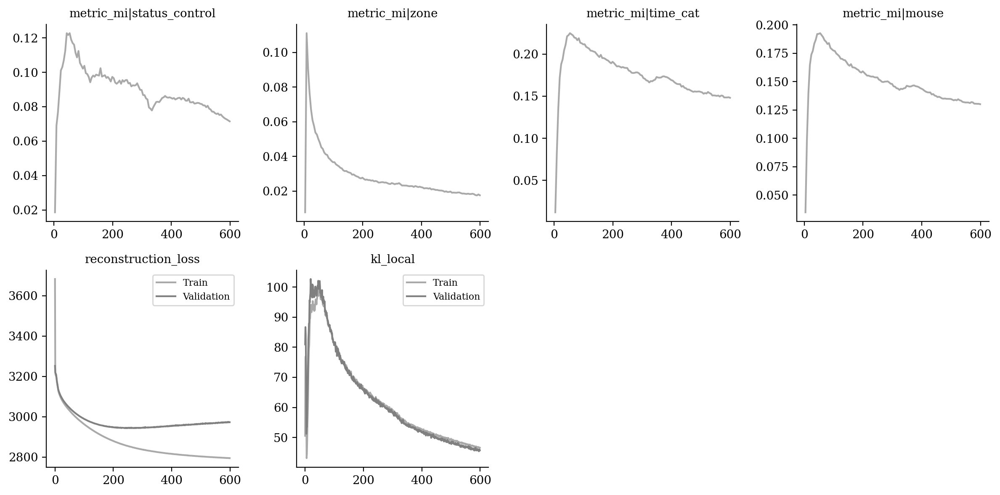

In [11]:
vae.plot_training_history(
    ignore_first=0,
    n_col=4,
    metrics_name=["metric_mi|status_control", "metric_mi|zone", "metric_mi|time_cat", "metric_mi|mouse",
                 "reconstruction_loss", "kl_local"]
)

In [12]:
from tardis._disentanglementmanager import DisentanglementManager as DM

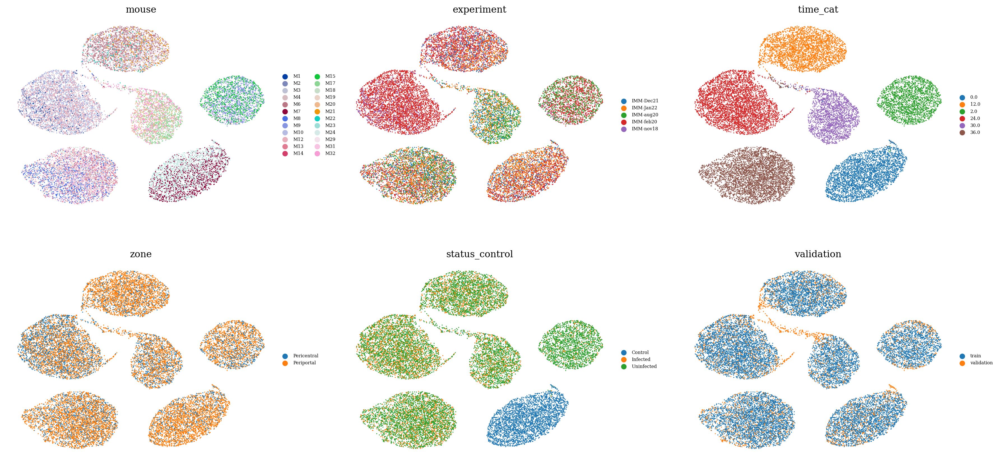

In [13]:
sublatent = DM.configurations.get_by_obs_key("time_cat").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

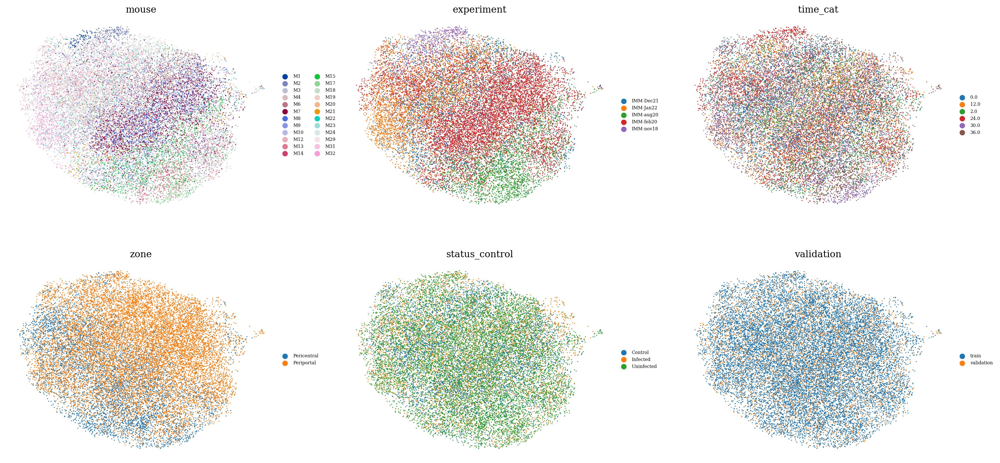

In [14]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

In [15]:
from tardis._utils.functions import label_transfer

In [16]:
k = "time_cat"
sublatent = DM.configurations.get_by_obs_key(k).reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())

reference_embeddings = latent[vae.train_indices, :].copy()
query_embeddings = latent[vae.validation_indices, :].copy()

sc.pp.neighbors(reference_embeddings, n_neighbors=30)
label_transfer(reference_embeddings, query_embeddings, cluster_list=[k], neighbors_count=30)

predicted = query_embeddings.obs[f"transf_{k}"].astype(str).values
true = query_embeddings.obs[k].astype(str).values

import sklearn
metrics = {}
metrics['accuracy'] = sklearn.metrics.accuracy_score(true, predicted)
metrics['precision_macro'] = sklearn.metrics.precision_score(true, predicted, average='macro', zero_division=0)
metrics['recall_macro'] = sklearn.metrics.recall_score(true, predicted, average='macro', zero_division=0)
metrics['f1_score_macro'] = sklearn.metrics.f1_score(true, predicted, average='macro', zero_division=0)
metrics['precision_micro'] = sklearn.metrics.precision_score(true, predicted, average='micro', zero_division=0)
metrics['recall_micro'] = sklearn.metrics.recall_score(true, predicted, average='micro', zero_division=0)
metrics['f1_score_micro'] = sklearn.metrics.f1_score(true, predicted, average='micro', zero_division=0)
metrics['precision_weighted'] = sklearn.metrics.precision_score(true, predicted, average='weighted', zero_division=0)
metrics['recall_weighted'] = sklearn.metrics.recall_score(true, predicted, average='weighted', zero_division=0)
metrics['f1_score_weighted'] = sklearn.metrics.f1_score(true, predicted, average='weighted', zero_division=0)
metrics['confusion_matrix'] = sklearn.metrics.confusion_matrix(true, predicted)
metrics

{'accuracy': 0.9713910761154856,
 'precision_macro': 0.9674900261516176,
 'recall_macro': 0.9663002758117955,
 'f1_score_macro': 0.9667653204497316,
 'precision_micro': 0.9713910761154856,
 'recall_micro': 0.9713910761154856,
 'f1_score_micro': 0.9713910761154856,
 'precision_weighted': 0.9715131113835108,
 'recall_weighted': 0.9713910761154856,
 'f1_score_weighted': 0.9713446604851006,
 'confusion_matrix': array([[647,   0,   6,   0,   4,   1],
        [  1, 633,   0,   3,   0,   5],
        [  6,   0, 388,   1,   7,   0],
        [  3,   0,   0, 835,   8,   2],
        [  9,   0,  14,   6, 370,   9],
        [ 16,   2,   0,   3,   3, 828]])}

In [17]:
from sklearn.dummy import DummyClassifier
dummy_clf = DummyClassifier(strategy='most_frequent')
dummy_clf.fit(true.reshape(-1, 1), true)
dummy_predictions = dummy_clf.predict(true.reshape(-1, 1))
accuracy = sklearn.metrics.accuracy_score(true, dummy_predictions)
print(f"Baseline Accuracy: {accuracy}")

Baseline Accuracy: 0.22362204724409449


In [18]:
from sklearn.dummy import DummyClassifier
dummy_clf = DummyClassifier(strategy='stratified')
dummy_clf.fit(true.reshape(-1, 1), true)
dummy_predictions = dummy_clf.predict(true.reshape(-1, 1))
accuracy = sklearn.metrics.accuracy_score(true, dummy_predictions)
print(f"Baseline Accuracy: {accuracy}")

Baseline Accuracy: 0.1847769028871391


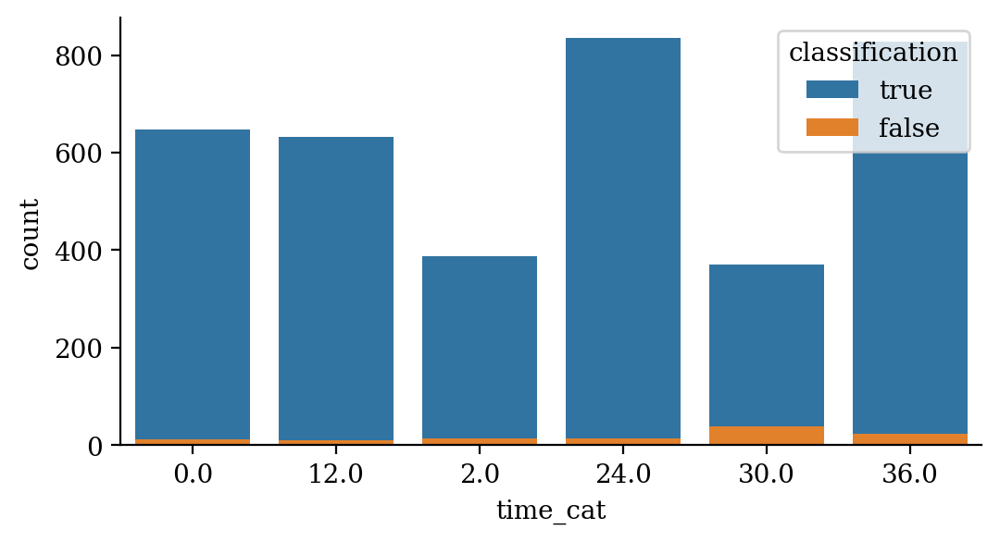

In [19]:
query_embeddings.obs["classification"] = 'false'
query_embeddings.obs.loc[query_embeddings.obs[k] == query_embeddings.obs[f"transf_{k}"], "classification"] = 'true'
grouped = query_embeddings.obs.groupby(k)['classification'].value_counts().rename('count').reset_index()

# Plotting the data
plt.figure(figsize=(6, 3))
# Create a barplot, which inherently supports stacking by using the 'hue' argument, and normalize the height by 'proportion'
sns.barplot(data=grouped, x=k, y='count', hue='classification', dodge=False)
sns.despine()
plt.show()